<a href="https://colab.research.google.com/github/arpanbiswas52/varTBO/blob/main/BO_spectral_(Notebookversion).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **BO Spectral**
Jan, 2023

This is the human-augmented, dynamic, BO recommder system framework for automated experiement with microscope. (Colab Version)

## *   Rama Vasudevan proposed the idea
## *   Arpan Biswas developed BO recommder system framework
## *   Rama Vasudevan, Yongtao Liu adapted to make it compatible with microscopy measurement



#Problem Description
Build a BO framework-

Here we have a image data, where X is the input location of the image

Each location in the image, we have a spectral data, from where user select if the data is good/bad (discrete choice). We take the means of all good spectral only to generate the target spectral.

At the mid of execution, the user also have option to either eliminate (or update the preferance) all the previously stored (if user suddenly find a desired spectral) spectral, and put more weights on new found spectral.

The goal is to build a optimization (BO) model where we adaptively sample towards region (in image) of good spectral, and find optimal location point closest to the current chosen target spectral (as per user voting).

#Workflow: Run BO to find the optimal location for user-desired spectral as per voting
Here we vote the quality of spectral

User interaction part:

During the play (for each function evaluation)-

- View spectral image. User have three rating options as 0, 1, 2: 0-Bad, 1-Good, 2-Very good. **To answer 0-Bad spectral, user can just jit ENTER to save time**

- If user rated as Good or Very Good, and user already have a current target spectral (user already selected at least one good/very good spectral in earlier iterations), another message pops up if the user want to update preference of new spectral Vs the current target spectral(Y or N). **To answer No, user can just jit ENTER to save time**

  - If user choose "Y", user have option (any number between 0-10) to provide weights of new spectral. For example: If user provide 10 as input, the updated target spectral will be only the new chosen spectral and all the other earlier selected good spectral will be eliminated from target.

  - If user choose "N", as default the updated target spectral is the mean of all the earlier selected spectral and the new spectral.

- User will get prompt at each BO iteration if they are satisfied with current target spectral or need further updating(Y or N). **To answer No, user can just jit ENTER to save time**

  - If user select Y, target spectral will be updated as per voting of new spectral and **human-guided dynamic objective evaluation** will be conducted

  - If user select N, target spectral will be fixed and an **automated objective evaluation** will be conducted for future BO iteration (like normal BO and no further prompt of target updating)


After END OF PLAY, the code automatically save below data (serially) in optim.results.npy

- Best locations, from evaluated samples and GP estimated

- User rating of spectral at each evaluated locations in image

- the matrices of evaluated location and the respective obj values

In [ ]:
!pip install --upgrade --no-cache-dir gdown

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.4.0
    Uninstalling gdown-4.4.0:
      Successfully uninstalled gdown-4.4.0


In [ ]:
!pip install --upgrade torch==1.8.1 torchvision==0.9.1
!pip install gpytorch botorch
!pip install smt
!pip install atomai
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 804.1/804.1 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 56.0 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.0+cu116
    Uninstalling torch-1.13.0+cu116:
      Successfully uninstalled torch-1.13.0+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.0+cu116
    Uninstalling torchvision-0.14.0+cu116:
      Successfully uninstalled torchvision-0.14.0+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.0 requires torch==1.13.0, but you have torch 1.8.1 which is incompatible.
torchaudio 0.13.0+cu116 requires torch==1.13.0, but you have torch 1.8.1 which is incompatible.
Looking in indexe

In [ ]:
import sys
import gdown
import torch
from torchvision import datasets, transforms
from torchmetrics.functional import structural_similarity_index_measure as ssim2
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
import pickle
import numpy as np
import random
#import kornia as K
#import kornia.metrics as metrics
from PIL import Image
from typing import Tuple
import ipywidgets as widgets
from IPython.display import display
import pylab as pl
from IPython.display import clear_output
import pdb
from skimage.transform import resize
from mpl_toolkits.axes_grid1 import make_axes_locatable
#import gpim
from sklearn.decomposition import PCA
import matplotlib.gridspec as gridspec
from copy import deepcopy

from typing import Union
import pickle

# Import GP and BoTorch functions
import gpytorch as gpt
from botorch.models import SingleTaskGP, ModelListGP
#from botorch.models import gpytorch
from botorch.fit import fit_gpytorch_model
from botorch.models.gpytorch import GPyTorchModel
from botorch.utils import standardize
from gpytorch.distributions import MultivariateNormal
from gpytorch.kernels import ScaleKernel, RBFKernel, MaternKernel, PeriodicKernel
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import ConstantMean, LinearMean
from gpytorch.mlls import ExactMarginalLogLikelihood
from botorch.acquisition import UpperConfidenceBound
from botorch.optim import optimize_acqf
from botorch.acquisition import qExpectedImprovement
from botorch.acquisition import ExpectedImprovement
from botorch.sampling import IIDNormalSampler
from botorch.sampling import SobolQMCNormalSampler
from gpytorch.likelihoods.likelihood import Likelihood
from gpytorch.constraints import GreaterThan

from botorch.generation import get_best_candidates, gen_candidates_torch
from botorch.optim import gen_batch_initial_conditions

from gpytorch.models import ExactGP
from mpl_toolkits.axes_grid1 import make_axes_locatable
from smt.sampling_methods import LHS
from torch.optim import SGD
from torch.optim import Adam
from scipy.stats import norm
from scipy.interpolate import interp1d
from skimage.metrics import structural_similarity as ssim
from skimage import filters
from skimage.restoration import denoise_bilateral
from atomai import utils

import time

In [ ]:
class SimpleCustomGP(ExactGP, GPyTorchModel):
    _num_outputs = 1  # to inform GPyTorchModel API

    def __init__(self, train_X, train_Y):
        # squeeze output dim before passing train_Y to ExactGP
        super().__init__(train_X, train_Y.squeeze(-1), GaussianLikelihood())
        self.mean_module = ConstantMean()
        #self.mean_module = LinearMean(train_X.shape[-1])
        self.covar_module = ScaleKernel(
            #base_kernel=MaternKernel(nu=2.5, ard_num_dims=train_X.shape[-1]),
            #base_kernel=RBFKernel(ard_num_dims=train_X.shape[-1]),
            base_kernel=PeriodicKernel(ard_num_dims=train_X.shape[-1]),
        )
        self.to(train_X)  # make sure we're on the right device/dtype

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return MultivariateNormal(mean_x, covar_x)

In [ ]:
class play_varTBO():

    def __init__(self):
      pass

    @classmethod
    def func_automated_obj(self, idx_x, idx_y, new_spec_x, new_spec_y, target_func):
        idx1 = int(idx_x)
        idx2 = int(idx_y)
        rf = 10
        #print(wcount_good)
        if (wcount_good == 0): #We dont find a good loop yet from all initial sampling and thus target is unknown
            ssim_spec = torch.rand(1)*(1) # Unif[0, 1] A sufficiently large value as we want to avoid selecting bad loops,


        else:
            #Calculate ssim between target and ith loop shape
            pred = new_spec_y.detach().numpy()
            target = target_func.detach().numpy()
            ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())

        #This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        #Into maximization problem
        obj = rf * ssim_spec  #Maximize reward and negative mse
        #print(obj)
        return obj

    @classmethod
    def func_human_interacted_obj(self, idx_x, idx_y, new_spec_x, new_spec_y, wcount_good, target_func, vote):
        idx1 = int(idx_x)
        idx2 = int(idx_y)
        rf = 1
        #print(wcount_good)
        if (wcount_good == 0): #We dont find a good loop yet from all initial sampling and thus target is unknown
            ssim_spec = torch.rand(1)*(1) # Unif[0, 1] A sufficiently large value as we want to avoid selecting bad loops,
            # When we have a target, we will recalculate again to get more accuract estimate
            R = vote*rf

        else:
            #Calculate dissimilarity (mse) between target and ith loop shape

            pred = new_spec_y.detach().numpy()
            target = target_func.detach().numpy()
            ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())
            #plt.plot(new_spec_x, new_spec_y)
            #plt.show()
            #dev2_spectral = (target_func-new_spec_y)**2
            #mse_spectral = torch.mean(dev2_spectral)
            #Calculate reward as per voting, this will minimize the risk of similar function values of good and bad loop shape with similar mse
            R = vote*rf

        #This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        #Into maximization problem
        obj = R + ssim_spec #Maximize reward and ssim
        #print(mse_spectral)
        return obj
   
    @classmethod
    def optimize_hyperparam_trainGP(self, train_X, train_Y):
        # Gp model fit

        gp_surro = SimpleCustomGP(train_X, train_Y)
        gp_surro = gp_surro.double()
        gp_surro.likelihood.noise_covar.register_constraint("raw_noise", GreaterThan(1e-1))
        mll1 = ExactMarginalLogLikelihood(gp_surro.likelihood, gp_surro)
        # fit_gpytorch_model(mll)
        mll1 = mll1.to(train_X)
        gp_surro.train()
        gp_surro.likelihood.train()
        ## Here we use Adam optimizer with learning rate =0.1, user can change here with different algorithm and/or learning rate for each GP
        optimizer1 = Adam([{'params': gp_surro.parameters()}], lr=0.1) #0.01 set for BEPFM data, recommended to check the lr for any new data
        #optimizer1 = SGD([{'params': gp_surro.parameters()}], lr=0.0001)

        NUM_EPOCHS = 150

        for epoch in range(NUM_EPOCHS):
            # clear gradients
            optimizer1.zero_grad()
            # forward pass through the model to obtain the output MultivariateNormal
            output1 = gp_surro(train_X)
            # Compute negative marginal log likelihood
            loss1 = - mll1(output1, gp_surro.train_targets)
            # back prop gradients
            loss1.backward(retain_graph=True)
            # print last iterations
            if (epoch + 1) > NUM_EPOCHS: #Stopping the print for now
                print("GP Model trained:")
                print("Iteration:" + str(epoch + 1))
                print("Loss:" + str(loss1.item()))
                # print("Length Scale:" +str(gp_PZO.covar_module.base_kernel.lengthscale.item()))
                print("noise:" + str(gp_surro.likelihood.noise.item()))

            optimizer1.step()

        gp_surro.eval()
        gp_surro.likelihood.eval()
        return gp_surro

    @classmethod
    def cal_posterior(self, gp_surro, test_X):
        y_pred_means = torch.empty(len(test_X), 1)
        y_pred_vars = torch.empty(len(test_X), 1)
        t_X = torch.empty(1, test_X.shape[1])
        for t in range(0, len(test_X)):
            with torch.no_grad(), gpt.settings.max_lanczos_quadrature_iterations(32), \
                gpt.settings.fast_computations(covar_root_decomposition=False, log_prob=False,
                                                          solves=True), \
                gpt.settings.max_cg_iterations(100), \
                gpt.settings.max_preconditioner_size(80), \
                gpt.settings.num_trace_samples(128):

                    t_X[:, 0] = test_X[t, 0]
                    t_X[:, 1] = test_X[t, 1]
                    #t_X = test_X.double()
                    y_pred_surro = gp_surro.posterior(t_X)
                    y_pred_means[t, 0] = y_pred_surro.mean
                    y_pred_vars[t, 0] = y_pred_surro.variance

        return y_pred_means, y_pred_vars
    
    @classmethod
    def acqmanEI(self, y_means, y_vars, train_Y, ieval):
        y_means = y_means.detach().numpy()
        y_vars = y_vars.detach().numpy()
        y_std = np.sqrt(y_vars)
        fmax = train_Y.max()
        fmax = fmax.detach().numpy()
        best_value = fmax
        EI_val = np.zeros(len(y_vars))
        Z = np.zeros(len(y_vars))
        eta = 0.01

        for i in range(0, len(y_std)):
            if (y_std[i] <=0):
                EI_val[i] = 0
            else:
                Z[i] =  (y_means[i]-best_value-eta)/y_std[i]
                EI_val[i] = (y_means[i]-best_value-eta)*norm.cdf(Z[i]) + y_std[i]*norm.pdf(Z[i])

        # Eliminate evaluated samples from consideration to avoid repeatation in future sampling
        EI_val[ieval] = -1
        acq_val = np.max(EI_val)
        acq_cand = [k for k, j in enumerate(EI_val) if j == acq_val]
        #print(acq_val)
        return acq_cand, acq_val, EI_val

    @classmethod
    def augment_newdata_KL(self, acq_X, acq_X_norm, train_X, train_X_norm, train_Y, 
                           new_spec_x, new_spec_y, eval_spec, img_space, var_params, u, m):
        wcount_good, pref, target_func = var_params[0], var_params[1], var_params[2]

        nextX = acq_X
        nextX_norm = acq_X_norm
        train_X_norm = torch.vstack((train_X_norm, nextX_norm))
        train_X = torch.vstack((train_X, nextX))

        p = torch.empty(1, 1)
        #x = torch.empty((1,2))
        idx_x = int(train_X[-1, 0])
        idx_y = int(train_X[-1, 1])

        
        if (u == 0):
            print("Are you satisfied with current target? (y- yes or press ENTER- No)")
            update_target = str(input("Answer: "))
            if (update_target == "Y" or update_target == 'y'):
                print("Spectral target now fixed. Continue automated BO...")
                #First time switching to automated BO, need to recalculate the objectives again
                plt.plot(new_spec_x, new_spec_y)
                plt.title('loc:' +str(idx_y) +"," + str(idx_x), fontsize = 20)
                plt.show()
                train_Y = torch.empty((train_X.shape[0], 1))
                u = 1 # This is a switching parameter to not call for update target every iteration once the user is satisfied
                for i in range(0, train_X.shape[0]):
                    idx_x = int(train_X[i, 0])
                    idx_y = int(train_X[i, 1])
                    spec_y = eval_spec_y[idx_x, idx_y, :]
                    #print(idx_x, idx_y, torch.mean(target_func))
                    train_Y[i, 0] = self.func_automated_obj(idx_x, idx_y, new_spec_x, spec_y, target_func)
  
            else:
                print("User still searching for best target. Continue BO with human interaction...")

                #Vote for new spectral sample and update(or not) target spectral function
                p[0, 0], wcount_good, target_func = self.generate_targetobj(idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func)
                pref = torch.vstack((pref, p)) #Augment pref matrix

                if (p[0, 0] == 0):
                  # If target loop is not updated, we eval for the new samples only as the
                  # func value for others remain the same

                    next_feval = torch.empty(1, 1)
                    next_feval[0, 0] = self.func_human_interacted_obj(idx_x, idx_y, new_spec_x, new_spec_y, wcount_good, target_func, pref[-1, 0])
                    train_Y = torch.vstack((train_Y, next_feval))
                else:
                    # If target loop is updated, we reevaluate the obj of old spectral samples and 
                    # eval for the new samples
                    train_Y = torch.empty((train_X.shape[0], 1))
                    for i in range(0, train_X.shape[0]):
                        #x[0, 0] = train_X[i, 0]
                        #x[0, 1] = train_X[i, 1]
                        idx_x = int(train_X[i, 0])
                        idx_y = int(train_X[i, 1])
                        spec_y = eval_spec_y[idx_x, idx_y, :]
                        #print(idx_x, idx_y, torch.mean(target_func))
                        train_Y[i, 0] = self.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])
        else:
            fig,ax=plt.subplots(ncols=2,figsize=(12,5))
            ax[0].plot(new_spec_x, new_spec_y)
            ax[0].set_title('loc:' +str(idx_y) +"," + str(idx_x), fontsize = 20)
            ax[1].plot(new_spec_x,target_func)
            ax[1].set_title('Fixed target function', fontsize = 20)
            plt.show()
            next_feval = torch.empty(1, 1)
            next_feval[0, 0] = self.func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func)
            train_Y = torch.vstack((train_Y, next_feval)) 

        var_params = [wcount_good, pref, target_func]
        m = m + 1
        return train_X, train_X_norm, train_Y, var_params, u, m

    @classmethod
    def generate_targetobj(self, idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func):
      #count_good= 0
      idx1 = int(idx_x)
      idx2 = int(idx_y)
      if (wcount_good == 0):
        # Figure for user choice
        fig,ax=plt.subplots(ncols=2,figsize=(12,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx2) +"," + str(idx1), fontsize = 20)
        plt.show()

      else:
        # Figure for user choice
        fig,ax=plt.subplots(ncols=3,figsize=(18,5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker = 'x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' +str(idx2) +"," + str(idx1), fontsize = 20)
        ax[2].plot(new_spec_x,target_func)
        ax[2].set_title('Current target function', fontsize = 20)
        plt.show()

      print("Rating: 0-Bad or press ENTER, 1-Good, 2-Very good")
      time.sleep(0.5)
      vote = (input("enter rating: "))
      # For bad spectral, we can also input null values to accelerate the voting- This is similar to skipping voting for bad spectral
      #For good ones, user need to vote as either 1 or 2
      if (vote == ""):
        vote = 0
        print(vote)
      else:
        vote = float(vote)
        print(vote)

      if(vote>0):
        newspec_wt = 1
        if ((wcount_good) > 0): #Only if we already have selected good spectral in early iterations
          print("Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No")
          newspec_pref = str(input("Answer: "))
          # For no pref update, we can also press enter (skip) to accelerate the process
          if (newspec_pref == 'Y' or newspec_pref == 'y'):
            print("Provide weights between 0 and 10: \n10 being all the weights to new spectral as new target.")
            newspec_wt = float(input("enter weightage: "))/10
            print(newspec_wt)
          else:
            newspec_wt = 0.5
        wcount_good =wcount_good + vote
        target_func = (((1-newspec_wt)*target_func*(wcount_good-vote))+(newspec_wt*vote*new_spec_y))/(((
            wcount_good-vote)*(1-newspec_wt)) + (vote*newspec_wt))
        #Normalize
        target_func = (target_func - target_func.min())/(target_func.max() - target_func.min())
      return vote, wcount_good, target_func    

    @classmethod
    def estimate (self, train_X, train_Y, test_X, y_pred_means):
        #Best solution among the evaluated data
        loss = torch.max(train_Y)
        ind = torch.argmax(train_Y)
        X_opt = torch.empty((1,2))
        X_opt[0, 0] = train_X[ind, 0]
        X_opt[0, 1] = train_X[ind, 1]

        # Best estimated solution from GP model considering the non-evaluated solution
        loss = torch.max(y_pred_means)
        ind = torch.argmax(y_pred_means)
        X_opt_GP = torch.empty((1,2))
        X_opt_GP[0, 0] = test_X[ind, 0]
        X_opt_GP[0, 1] = test_X[ind, 1]

        return X_opt, X_opt_GP


# Help function

In [ ]:
def plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_opt, X_opt_GP, img_space, i):
  pen = 10**0
  #Objective map
  fig,ax=plt.subplots(ncols=3,figsize=(18,5))
  a= ax[0].imshow(img_space, origin = "lower")
  ax[0].scatter(train_X[:,1], train_X[:,0], marker='s', c=train_Y, cmap='jet', linewidth=0.2)
  ax[0].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  ax[0].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  ax[0].axes.xaxis.set_visible(False)
  ax[0].axes.yaxis.set_visible(False)

  a = ax[1].scatter(test_X[:,1], test_X[:,0], c=y_pred_means/pen, cmap='viridis', linewidth=0.2)
  ax[1].scatter(train_X[:,1], train_X[:,0], marker='s', c=train_Y, cmap='jet', linewidth=0.2)
  #ax[1].scatter(X_opt[0, 1], X_opt[0, 0], marker='x', c='r')
  #ax[1].scatter(X_opt_GP[0, 1], X_opt_GP[0, 0], marker='o', c='r')
  divider = make_axes_locatable(ax[1])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(a, cax=cax, orientation='vertical')
  ax[1].set_title('Objective (GP mean) map', fontsize=10)
  ax[1].axes.xaxis.set_visible(False)
  ax[1].axes.yaxis.set_visible(False)
  #ax[1].colorbar(a)

  b = ax[2].scatter(test_X[:,1], test_X[:,0], c=y_pred_vars/(pen**2), cmap='viridis', linewidth=0.2)
  divider = make_axes_locatable(ax[2])
  cax = divider.append_axes('right', size='5%', pad=0.05)
  fig.colorbar(b, cax=cax, orientation='vertical')
  ax[2].set_title('Objective (GP var) map', fontsize=10)
  ax[2].axes.xaxis.set_visible(False)
  ax[2].axes.yaxis.set_visible(False)
  #ax[2].colorbar(b)

  plt.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
  plt.show()


#Load Dataset

In [ ]:
!gdown https://drive.google.com/uc?id=1iR791jgsJibeoSiw60I_Df61HXk5Flok
pickle_file_loc = r'beps_ground_truth_d1.p'
original_data = pickle.load(open(pickle_file_loc, "rb"))
beps_all = original_data['results_beps']

Downloading...
From: https://drive.google.com/uc?id=1iR791jgsJibeoSiw60I_Df61HXk5Flok
To: /content/beps_ground_truth_d1.p
100% 827M/827M [00:04<00:00, 189MB/s]


In [ ]:
!gdown https://drive.google.com/uc?id=1R3FkuimCtqoQQgOU8nct6bglBo-G9rU3
results = np.load("iterative_results_d1.npy", allow_pickle=True)

Downloading...
From: https://drive.google.com/uc?id=1R3FkuimCtqoQQgOU8nct6bglBo-G9rU3
To: /content/iterative_results_d1.npy
100% 69.4M/69.4M [00:00<00:00, 128MB/s]


In [ ]:
img_big = results[0][-2]

In [ ]:
dim = 50
img = resize(img_big, (50, 50),
                       anti_aliasing=True)

# Ground truth image

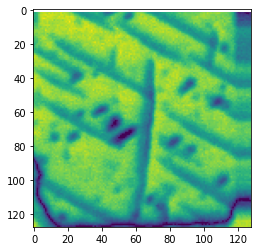

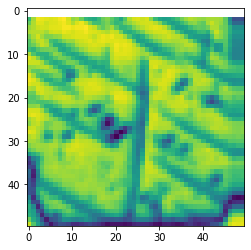

In [ ]:
plt.imshow(img_big)
plt.show()
plt.imshow(img)
plt.show()

In [ ]:
num_start = int(10)
N = int(200)
m = 0
spec_length = 64  #spectral data length

amp_slices = []
for ind in range(len(beps_all)):
    amp_slices.append(beps_all[ind][1][2])
amp_slices = np.array(amp_slices)
#img = amp_slices[:,16].reshape(50,50)

vdc_full = np.array(beps_all[0][1][0])
vdc_vec = vdc_full[-64:]

amp_mat = amp_slices[:,128:][:,1::2]
amp_masked = np.zeros_like(amp_mat)

rand_points = np.random.choice(np.arange(50*50), size = num_start, replace = False)
for ind in range(num_start):
    amp_masked[int(rand_points[ind]),:] = amp_mat[int(rand_points[ind]),:]

spec_length = amp_mat.shape[-1]  #spectral data length

coordinates = utils.get_coord_grid(img, 1)
X_feas = torch.from_numpy(coordinates[0][:,:2])

X_feas_norm = torch.empty((X_feas.shape[0], X_feas.shape[1]))

# Normalize X
for i in range(0, X_feas.shape[1]):
    X_feas_norm[:, i] = (X_feas[:, i] - 
                       torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - 
                                                                  torch.min(X_feas[:, i]))

# Initial evaluation

i is 0, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #1


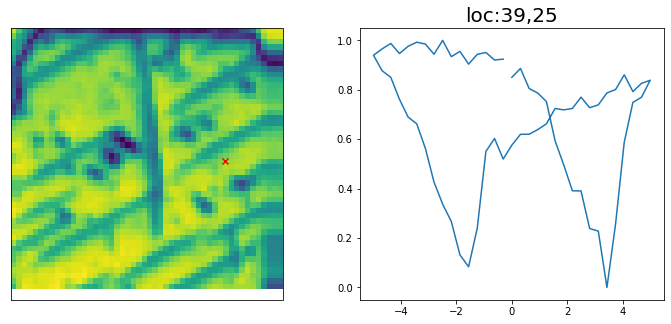

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
i is 1, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #2


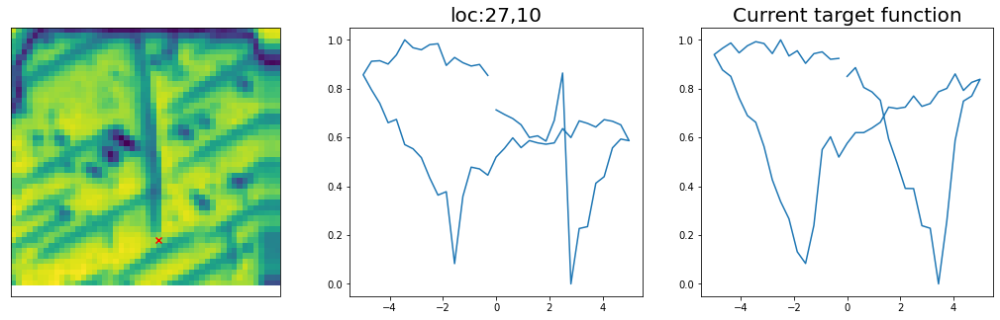

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 2, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #3


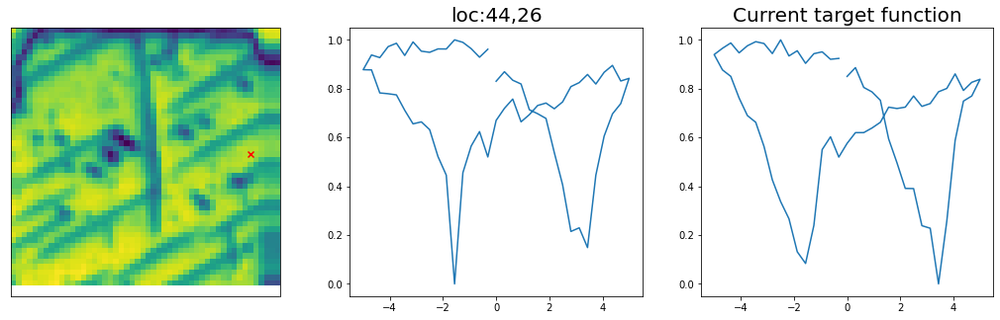

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 3, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #4


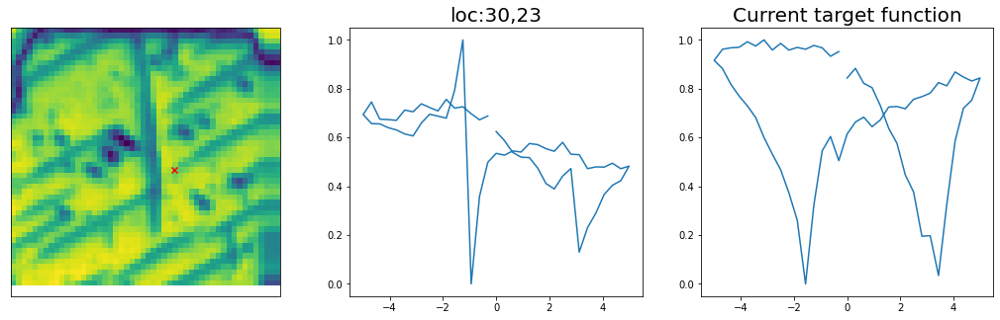

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 4, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #5


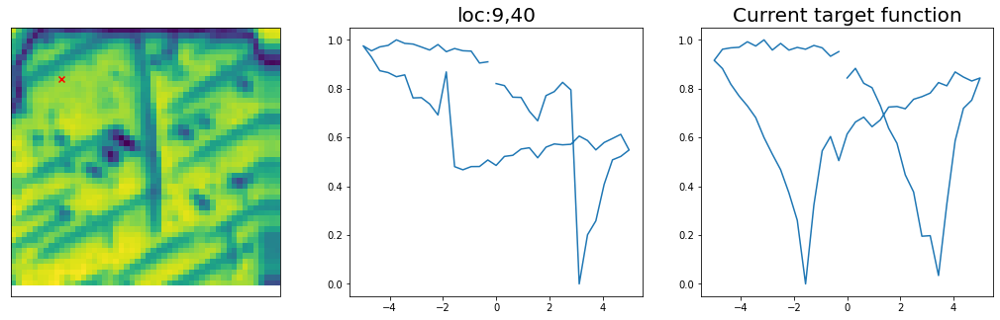

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 5, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #6


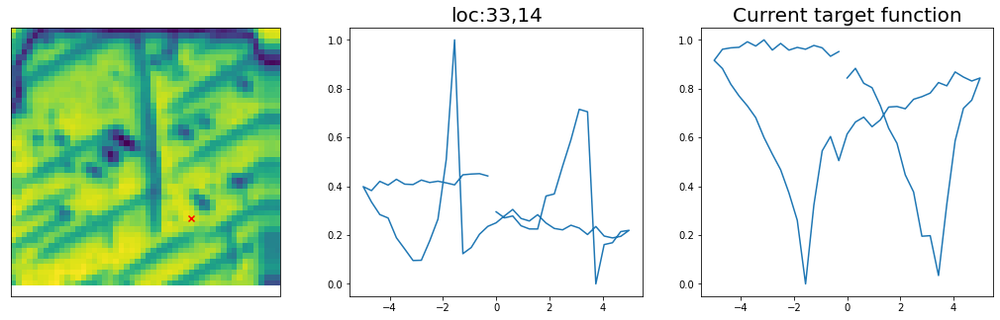

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 6, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #7


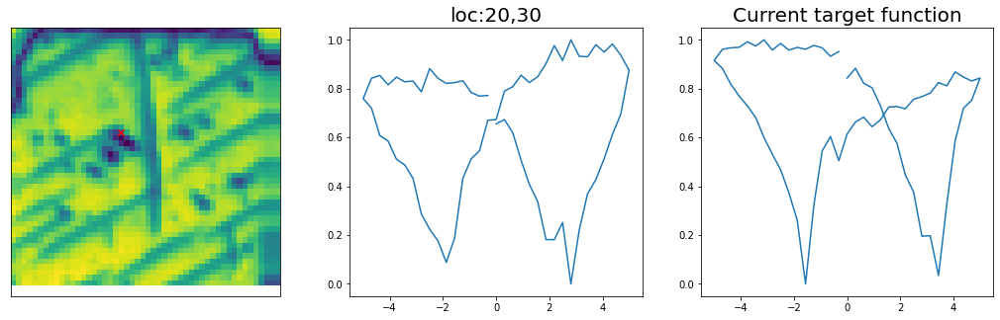

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: y
Provide weights between 0 and 10: 
10 being all the weights to new spectral as new target.
enter weightage: 8
0.8
i is 7, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #8


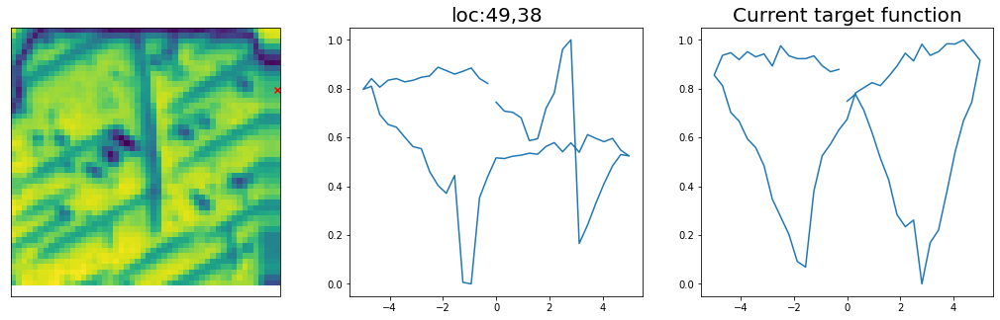

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 8, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #9


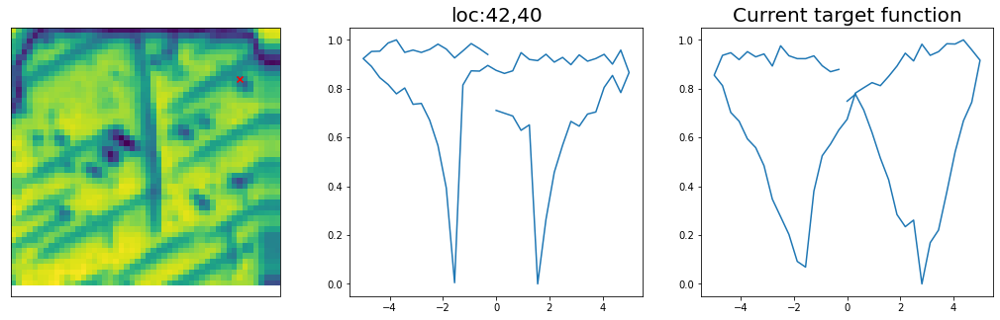

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 9, measurement done
points measured [1372 1764 1206  236 1759  137  875  335 2047 1336]
new_points_measured []


Sample #10


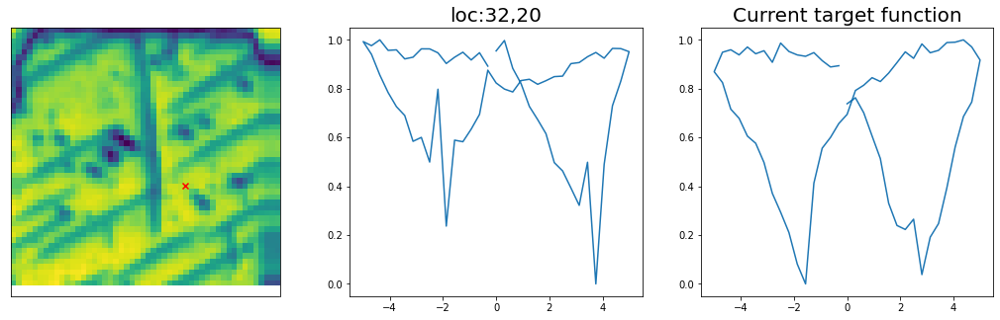

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0


In [ ]:
def return_new_measurement(full_dataset, points_measured):
    ampdat_masked = np.zeros_like(full_dataset)
    ampdat_masked[points_measured,:] = full_dataset[points_measured,:]
    return ampdat_masked, points_measured

# set parameters
IV = np.copy(amp_masked)
points_measured = np.array(rand_points)
last_points_measured = np.array(points_measured)
vdc = vdc_vec

# initial train location
np.random.seed(10)
idx = np.random.randint(0, len(X_feas), num_start)
train_X = X_feas[idx]
train_X_norm = X_feas_norm[idx]

train_Y = torch.empty((num_start, 1))
pref = torch.empty((num_start, 1))
init_spec = torch.empty((num_start, spec_length))
# Define a sparse grid to store evaluated spectral locations
eval_spec_y = torch.zeros(img.shape[0],img.shape[0],spec_length)
#Evaluate initial training data
x = torch.empty((1,2))

# First generate target loop, based on initial training data
wcount_good= 0
target_func = torch.zeros(spec_length)

mask = np.isin(points_measured, last_points_measured, invert = True)
new_points_measured = points_measured[mask]
last_points_measured = np.append(last_points_measured, new_points_measured)

for i in range(0, num_start):
    
    ##******************experiment start*******************##
    time.sleep(0.1)

    idx_x = int(train_X[i, 0])
    idx_y = int(train_X[i, 1])

    next_loc = np.asarray([idx_x, idx_y])

    print("i is {}, measurement done".format(i))
    
    mask = np.isin(points_measured, last_points_measured, invert = True)
    new_points_measured = points_measured[mask]
    last_points_measured = np.append(last_points_measured, new_points_measured)
    print('points measured {}'.format(points_measured))
    print('new_points_measured {}'.format(new_points_measured))

    new_iv = IV[last_points_measured,:]

    new_spec_x = torch.from_numpy(vdc_vec)
    new_spec_y = torch.from_numpy(new_iv)[i,:]

    new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())

    init_spec[i,] = new_spec_y
    eval_spec_y[idx_x, idx_y, :] = new_spec_y
    print("\n\nSample #" + str(m + 1))
    pref[i, 0], wcount_good, target_func = play_varTBO.generate_targetobj(idx_x, idx_y, new_spec_x,new_spec_y, 
                                                              img, wcount_good, target_func)
    m = m + 1


# Once target loop is defined (unless are loops are selected bad by user), we compute the obj
for i in range(0, num_start):
  idx_x = int(train_X[i, 0])
  idx_y = int(train_X[i, 1])
  spec_y = eval_spec_y[idx_x, idx_y, :]
  #print(idx_x, idx_y)
  train_Y[i, 0] = play_varTBO.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
= X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m


# Start BO

step:  1
Sample #11




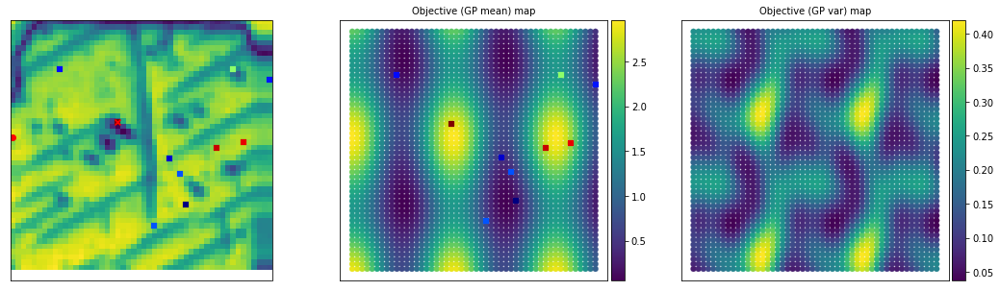

Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: y
Spectral target now fixed. Continue automated BO...


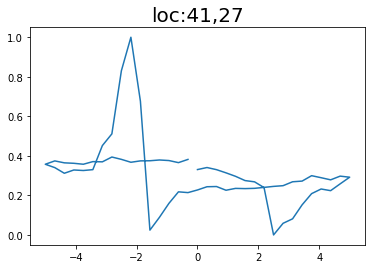

step:  2
Sample #12




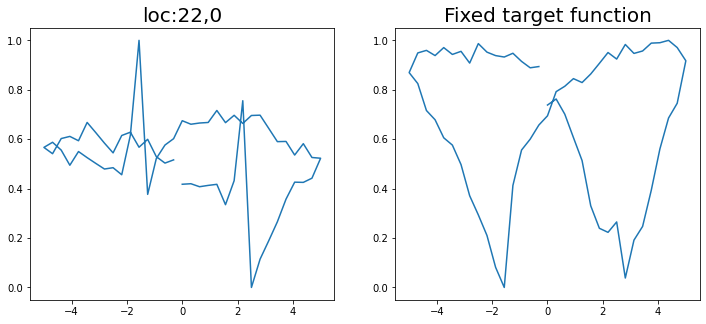

step:  3
Sample #13




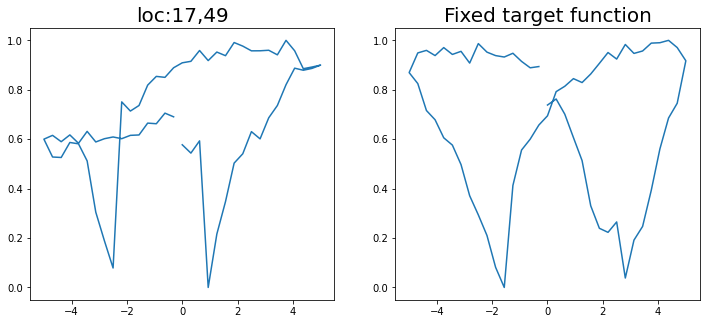

step:  4
Sample #14




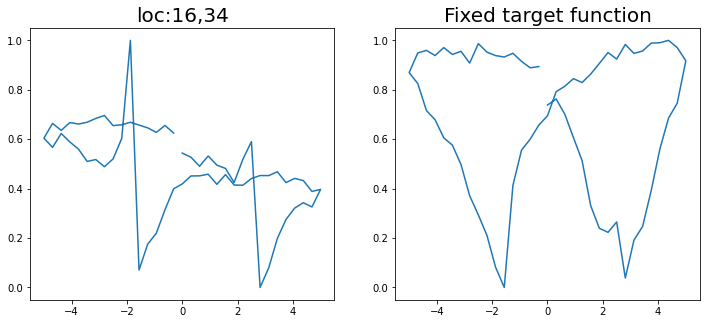

step:  5
Sample #15




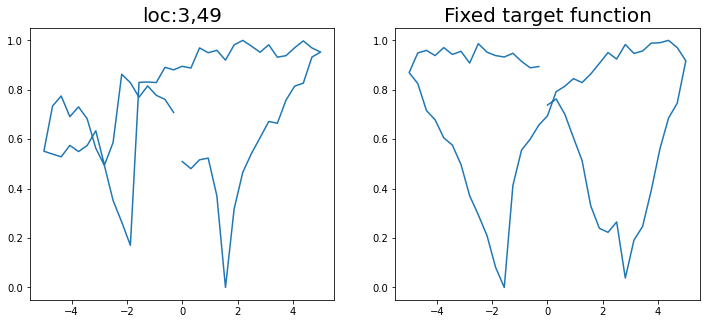

step:  6
Sample #16




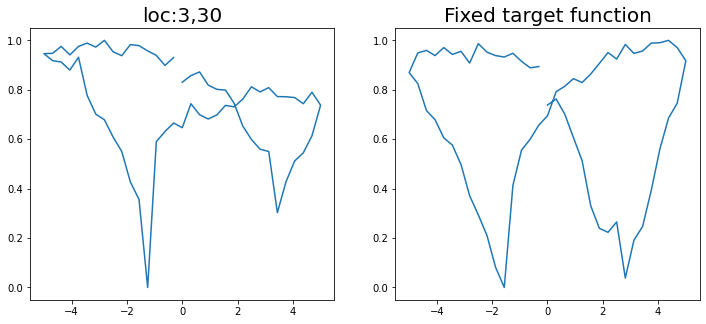

step:  7
Sample #17




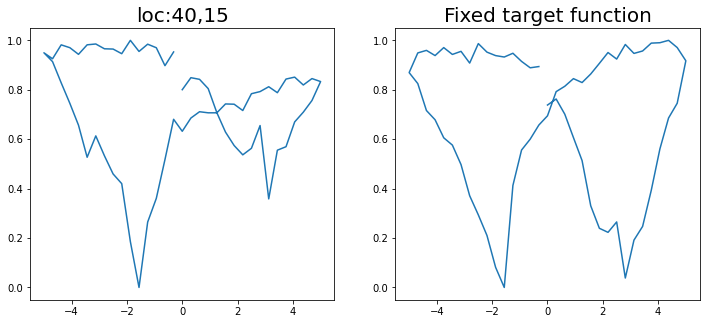

step:  8
Sample #18




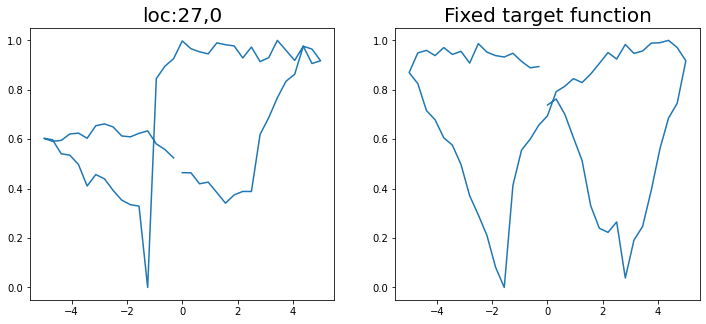

step:  9
Sample #19




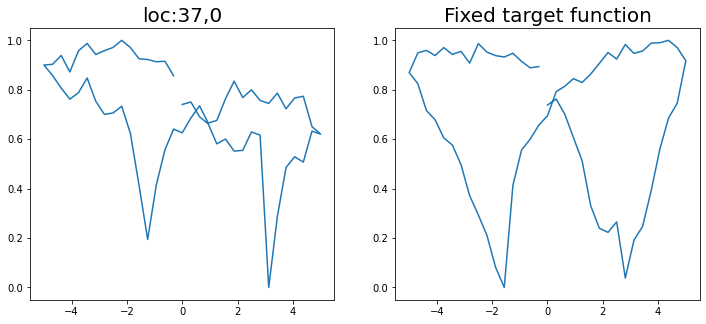

step:  10
Sample #20




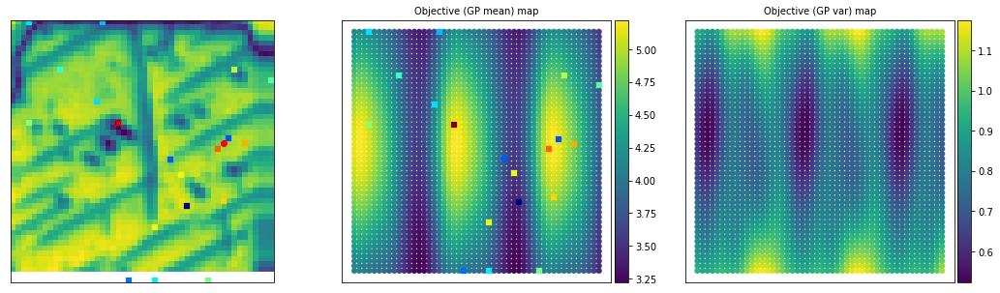

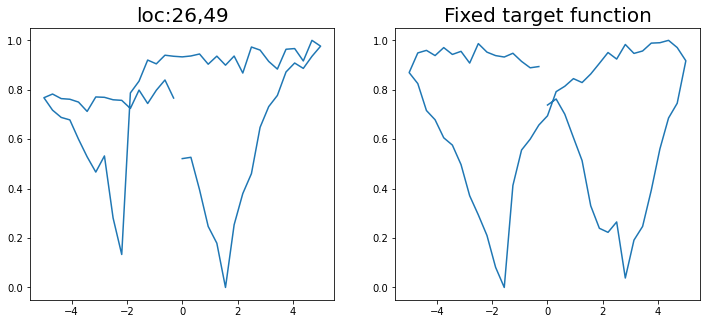

step:  11
Sample #21




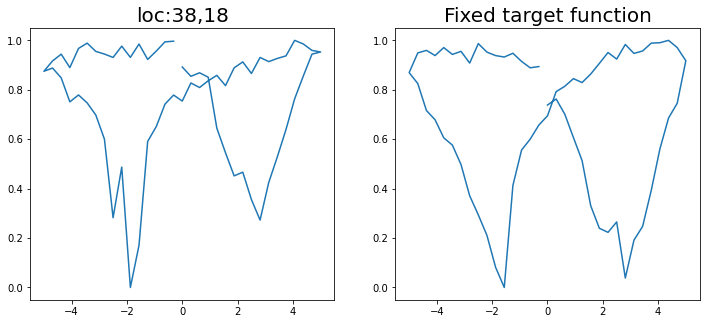

step:  12
Sample #22




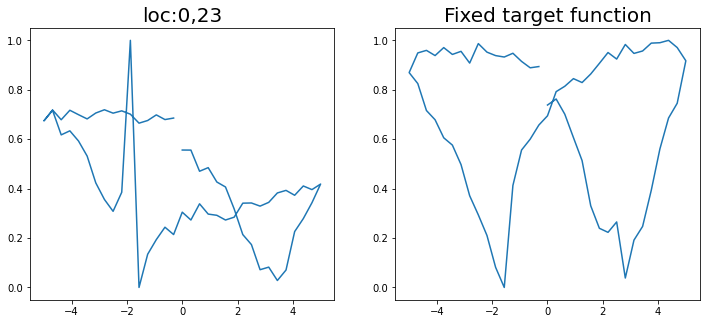

step:  13
Sample #23




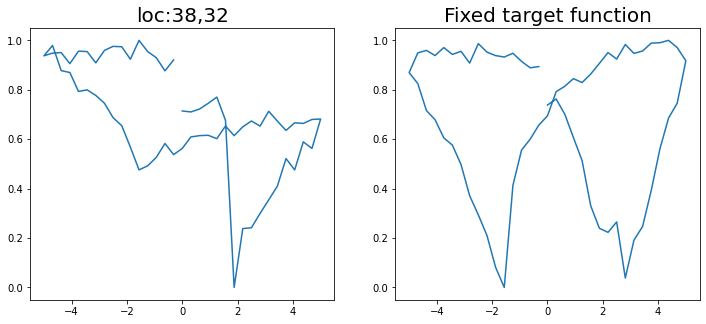

step:  14
Sample #24




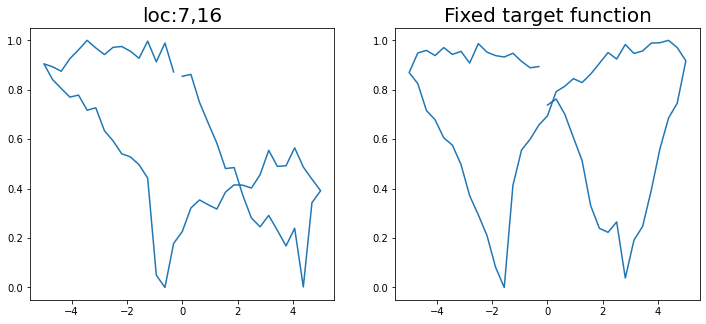

step:  15
Sample #25




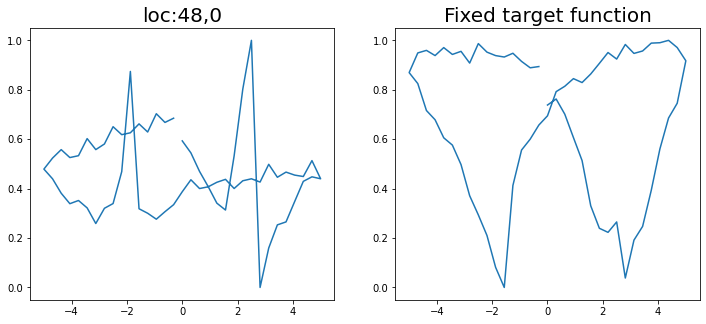

step:  16
Sample #26




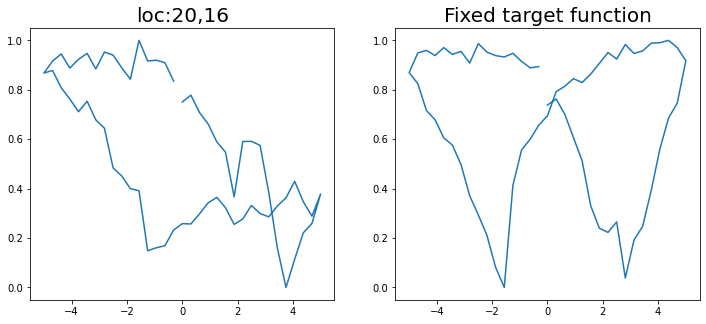

step:  17
Sample #27




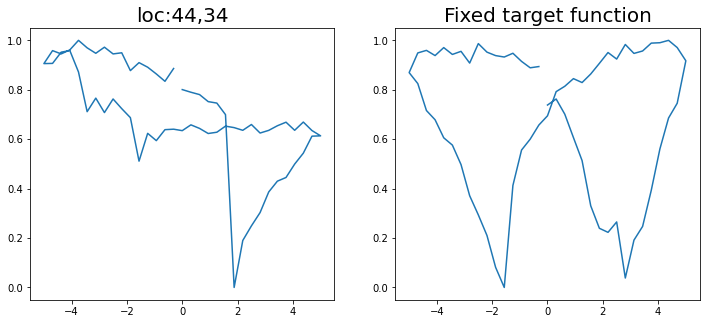

step:  18
Sample #28




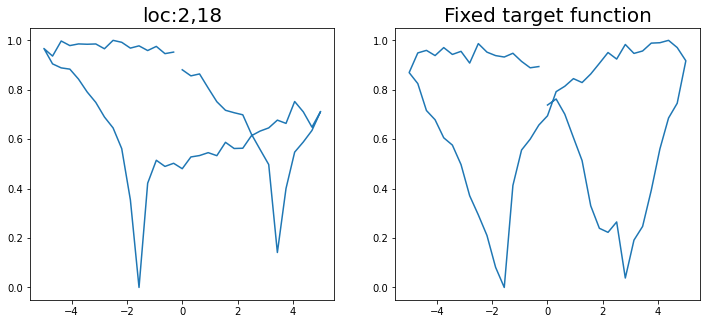

step:  19
Sample #29




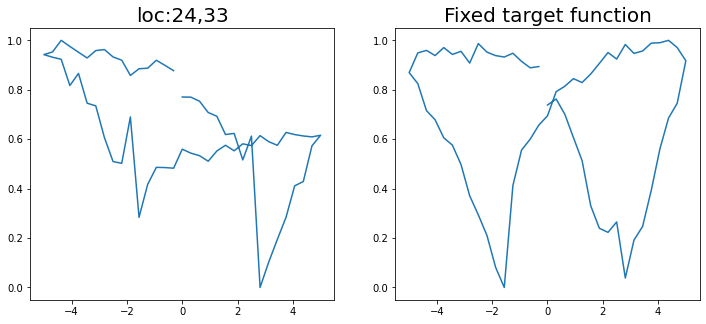

step:  20
Sample #30




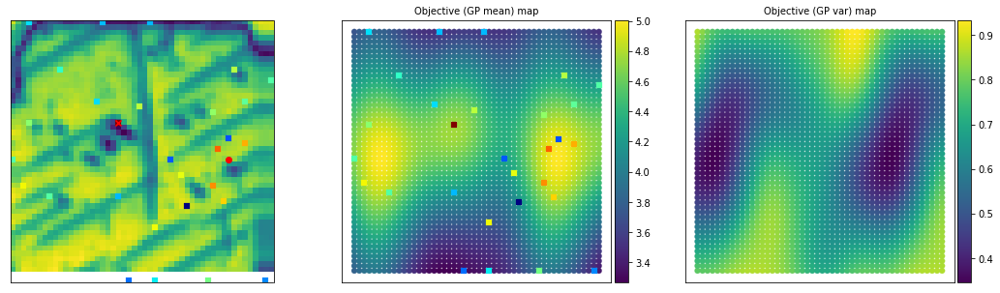

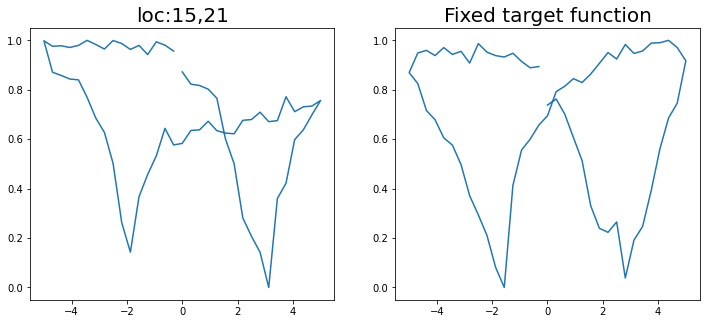

step:  21
Sample #31




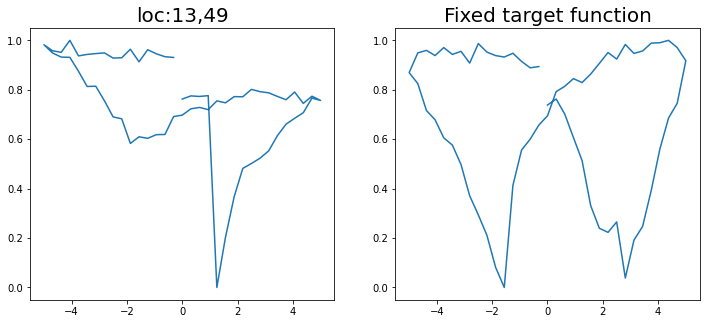

step:  22
Sample #32




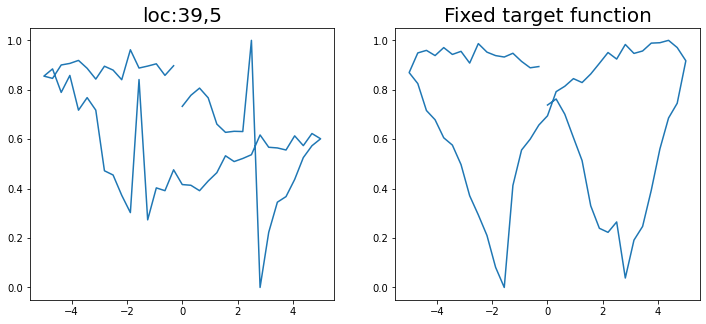

step:  23
Sample #33




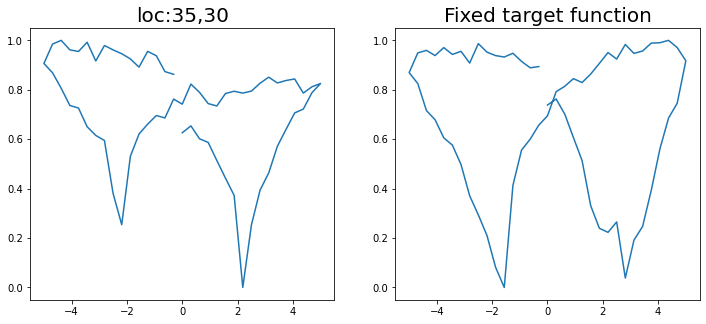

step:  24
Sample #34




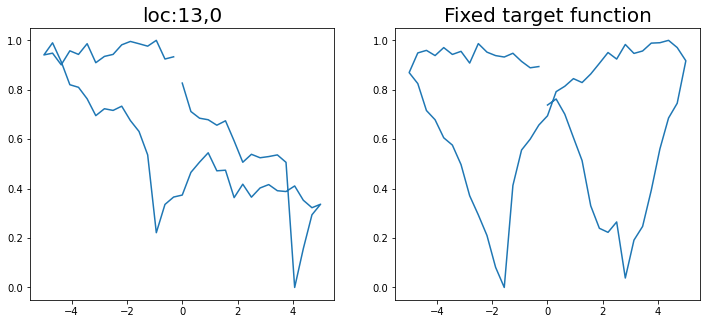

step:  25
Sample #35




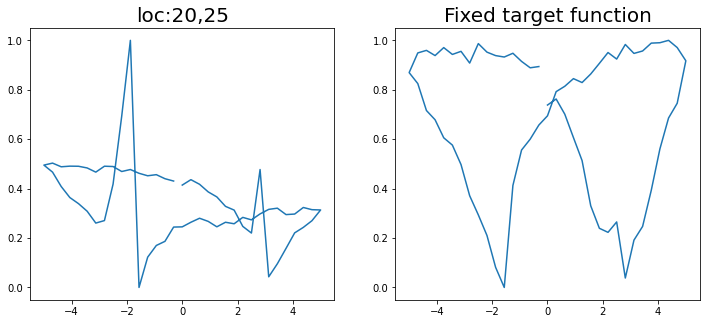

step:  26
Sample #36




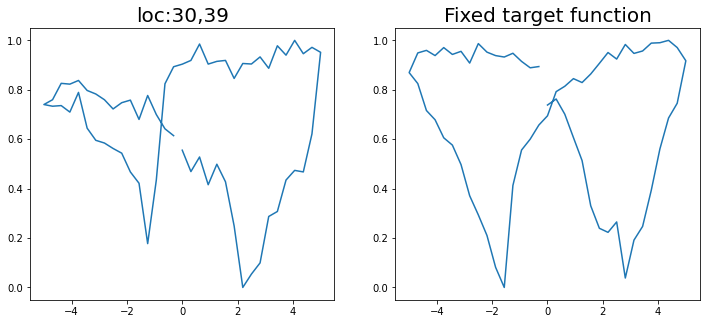

step:  27
Sample #37




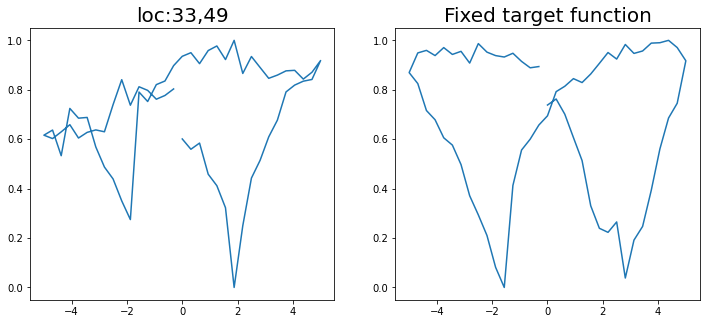

step:  28
Sample #38




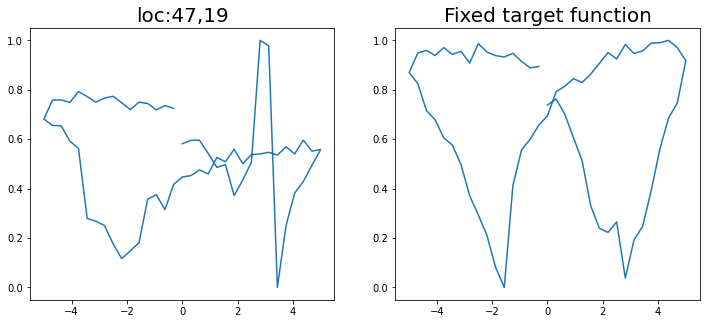

step:  29
Sample #39




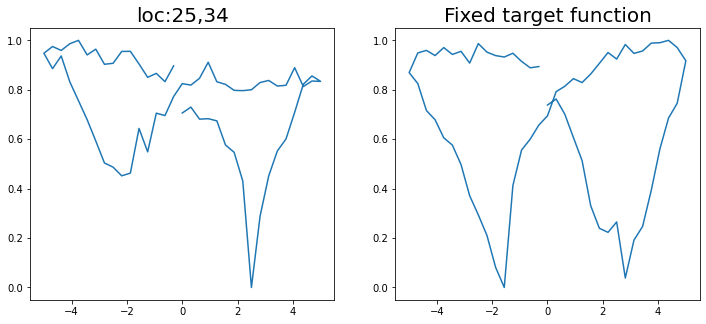

step:  30
Sample #40




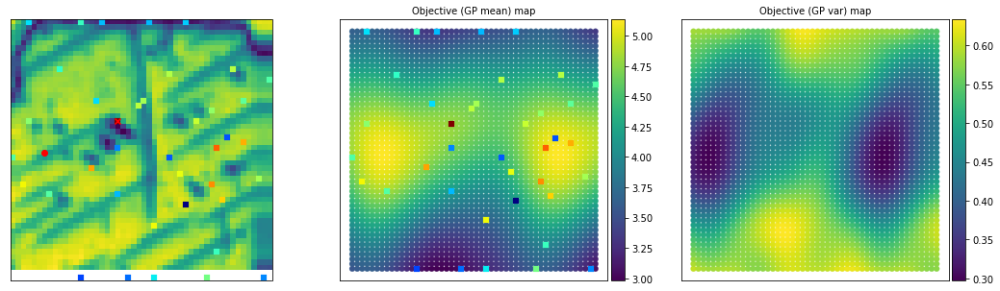

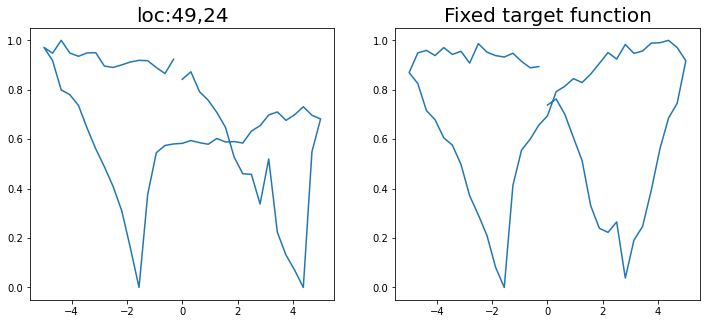

step:  31
Sample #41




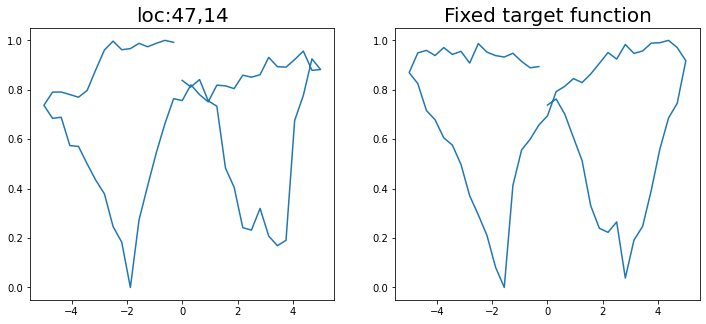

step:  32
Sample #42




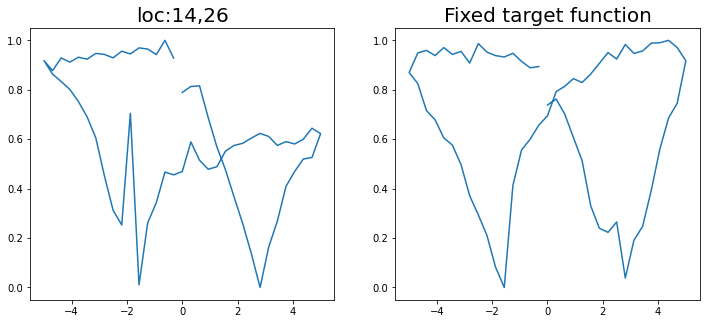

step:  33
Sample #43




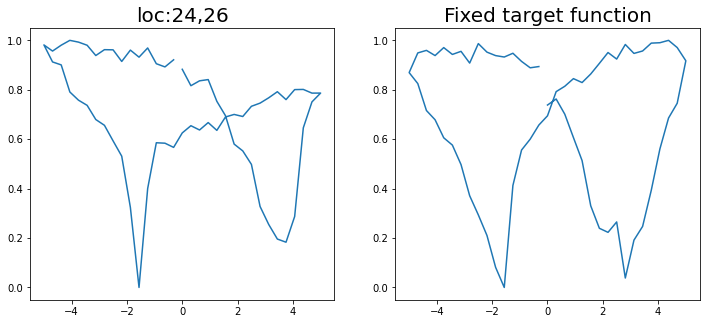

step:  34
Sample #44




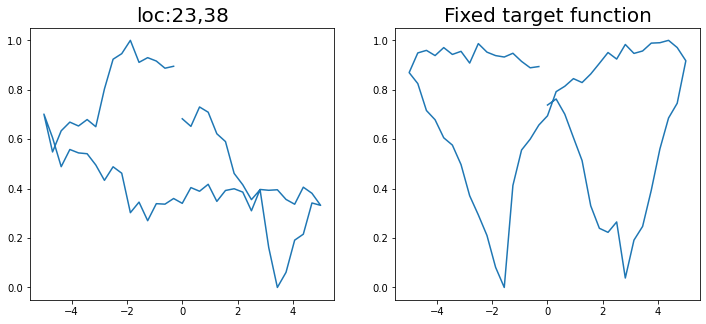

step:  35
Sample #45




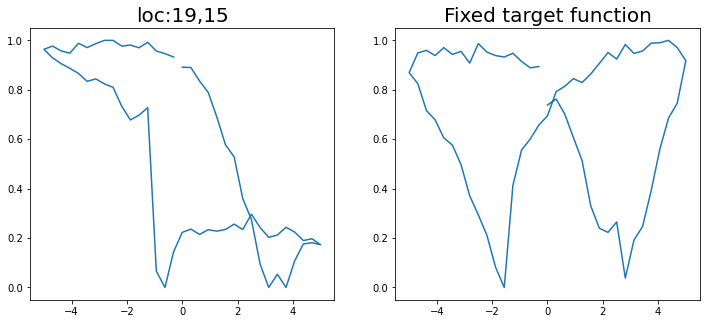

step:  36
Sample #46




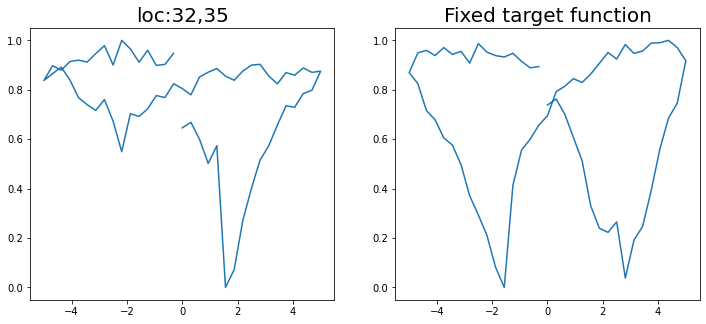

step:  37
Sample #47




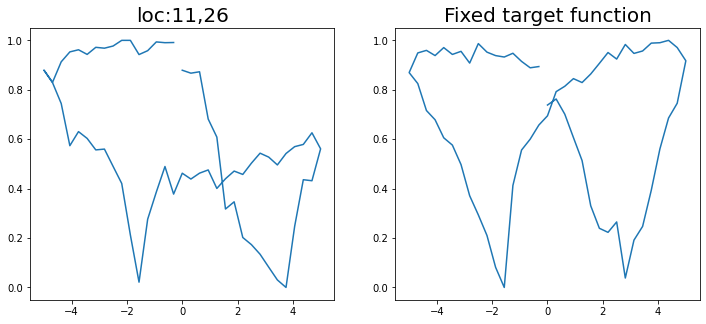

step:  38
Sample #48




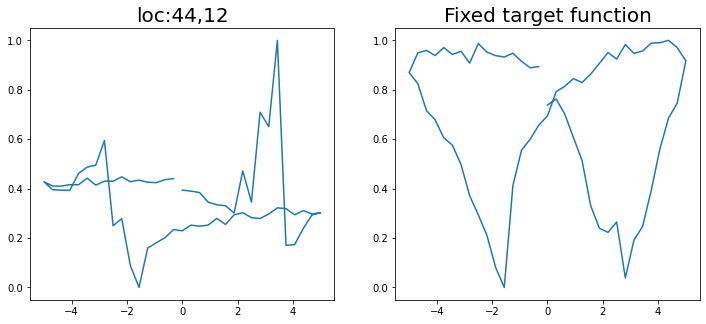

step:  39
Sample #49




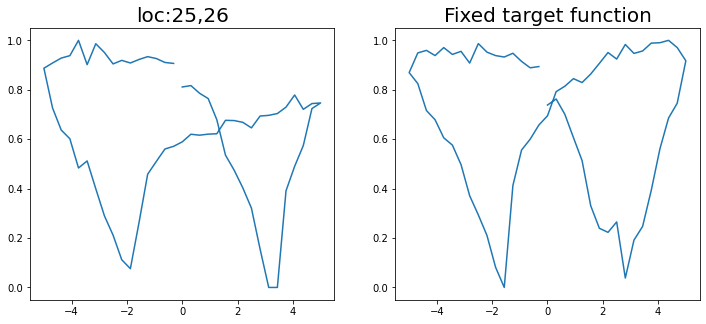

step:  40
Sample #50




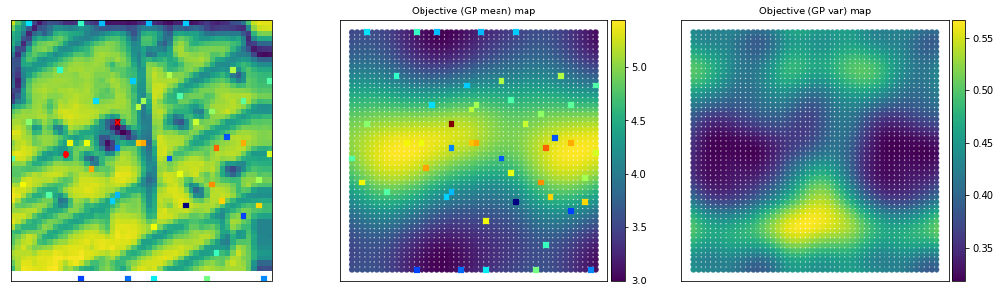

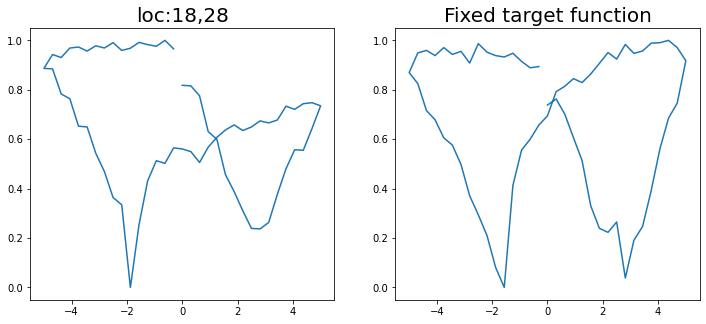

step:  41
Sample #51




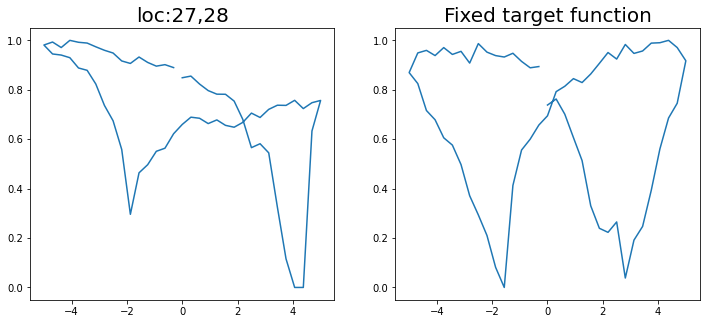

step:  42
Sample #52




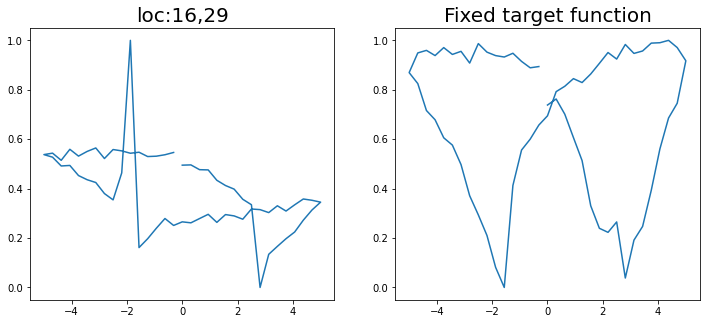

step:  43
Sample #53




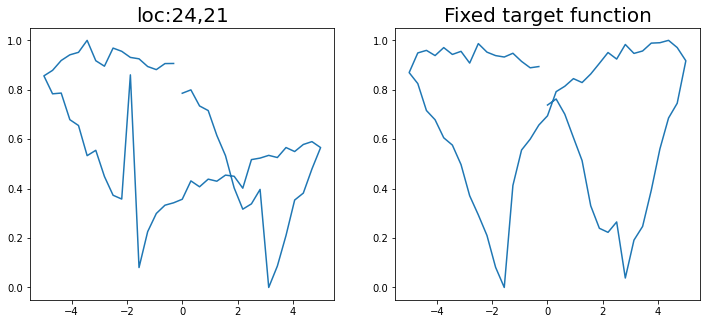

step:  44
Sample #54




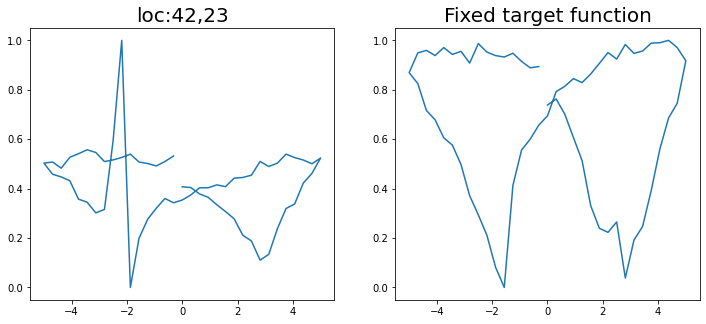

step:  45
Sample #55




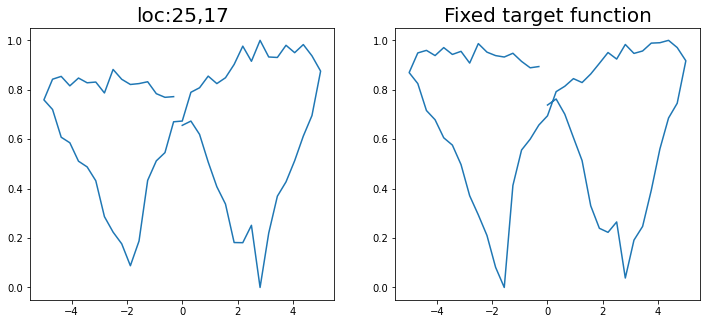

step:  46
Sample #56




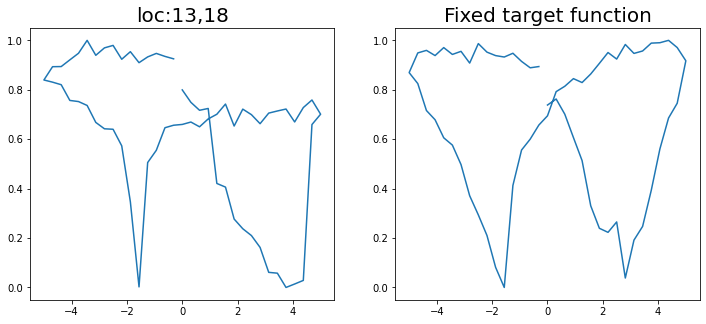

step:  47
Sample #57




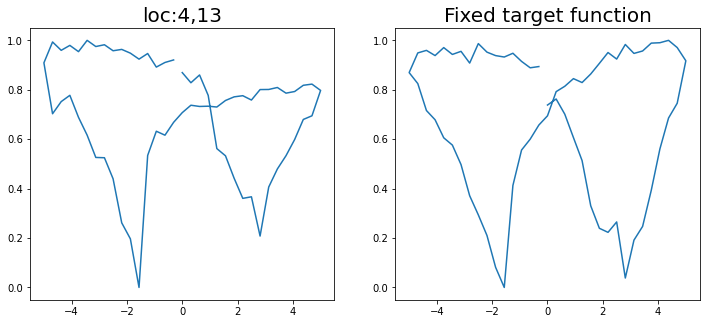

step:  48
Sample #58




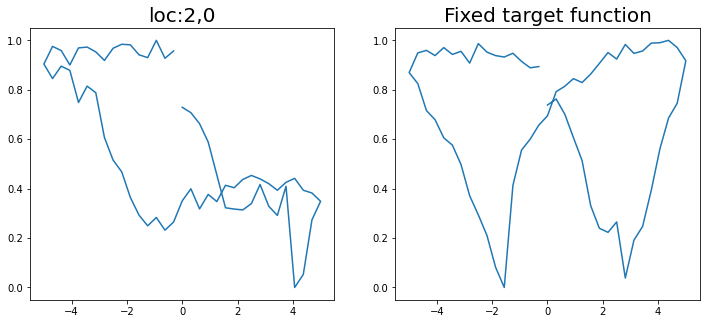

step:  49
Sample #59




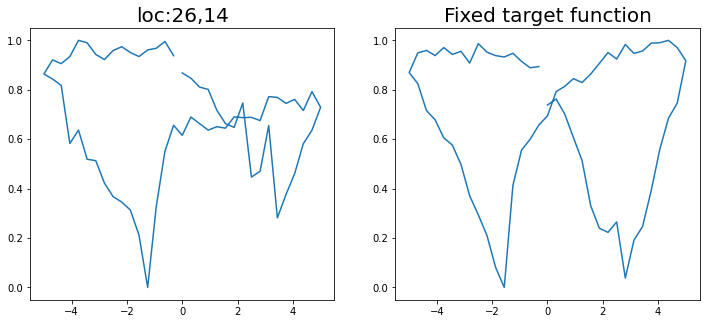

step:  50
Sample #60




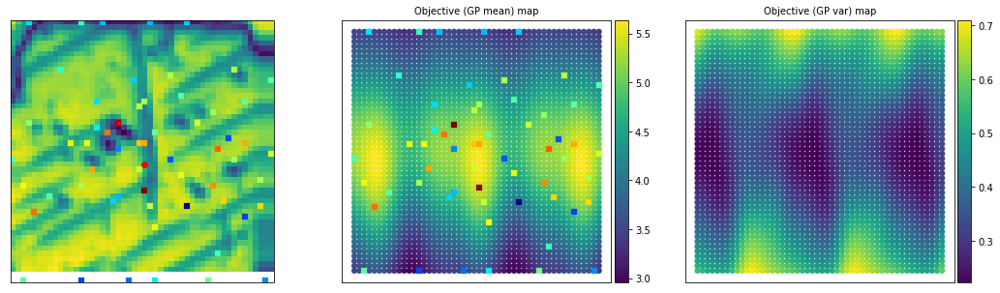

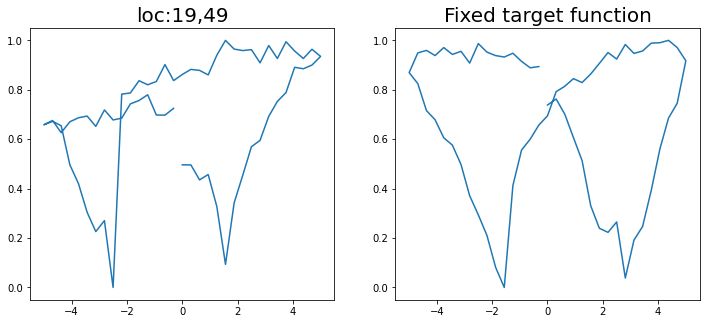

step:  51
Sample #61




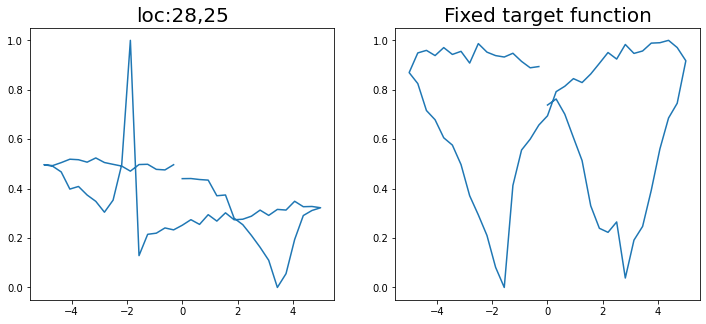

step:  52
Sample #62




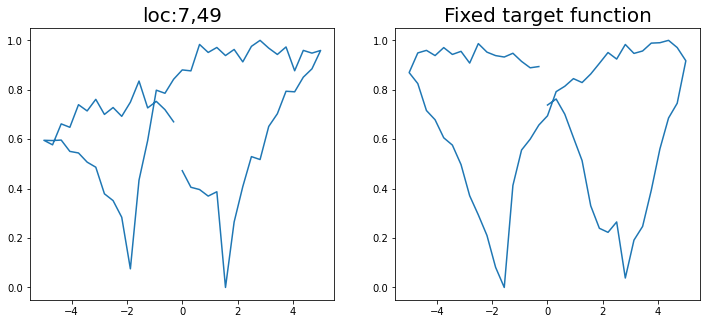

step:  53
Sample #63




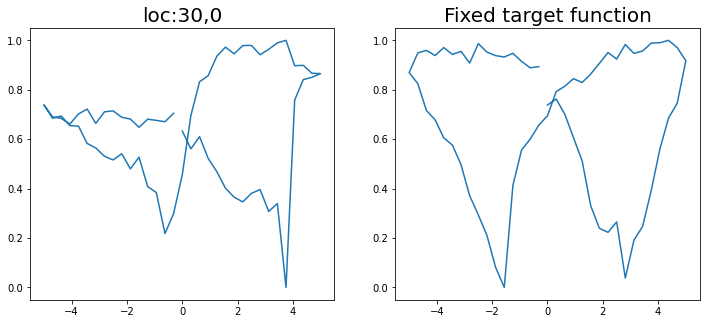

step:  54
Sample #64




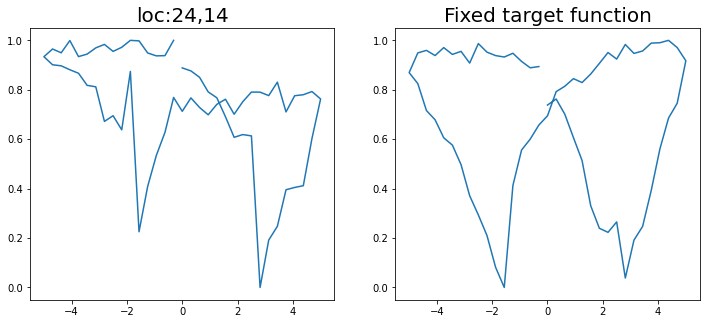

step:  55
Sample #65




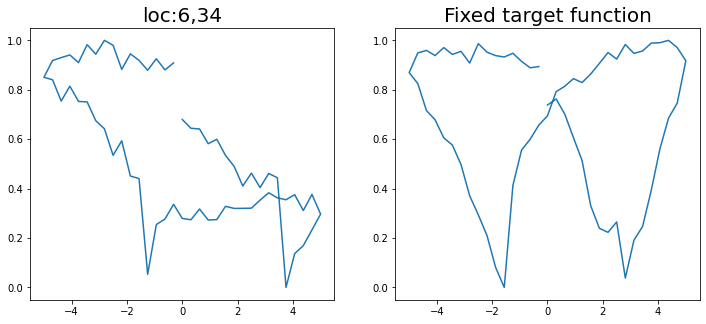

step:  56
Sample #66




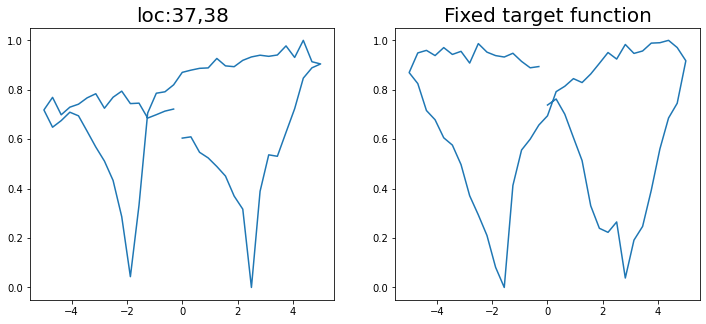

step:  57
Sample #67




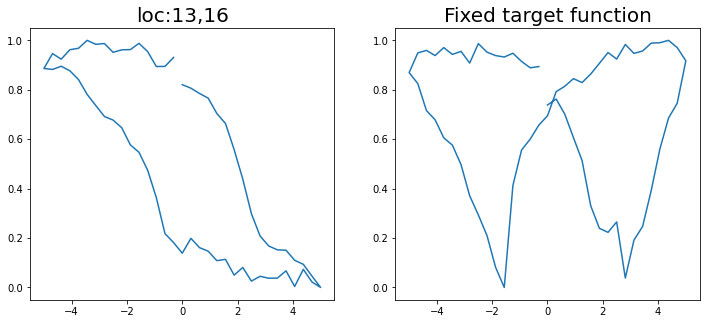

step:  58
Sample #68




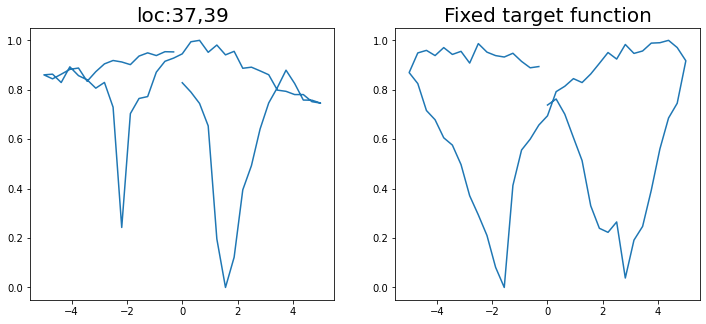

step:  59
Sample #69




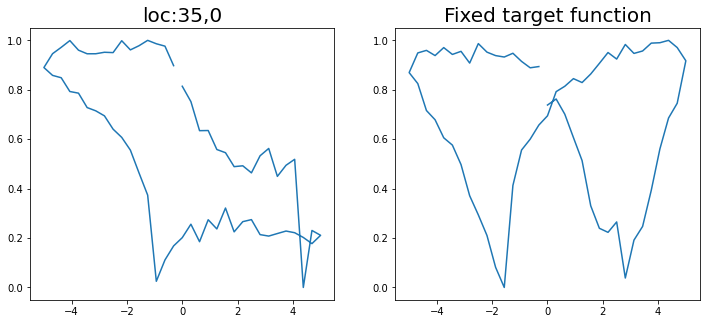

step:  60
Sample #70




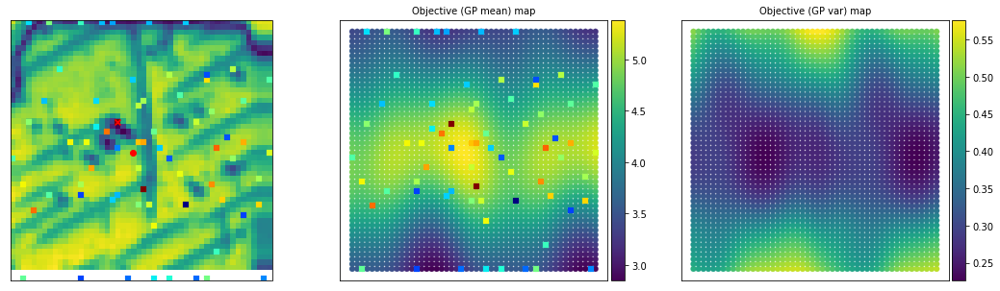

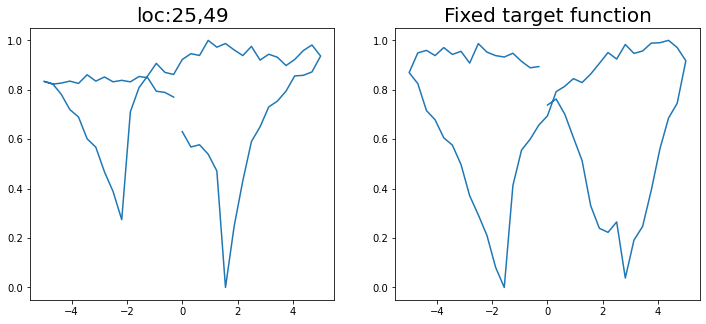

step:  61
Sample #71




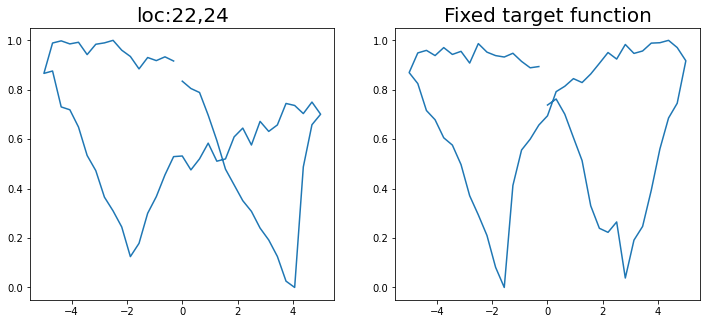

step:  62
Sample #72




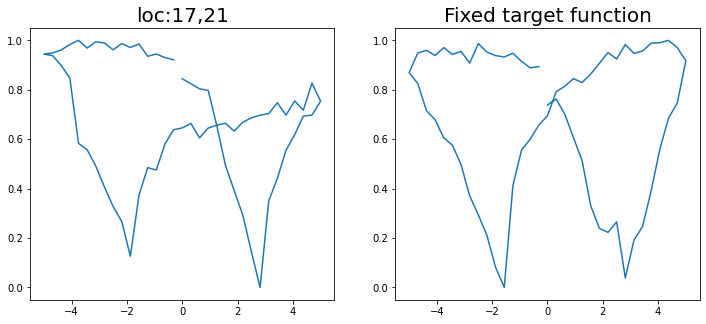

step:  63
Sample #73




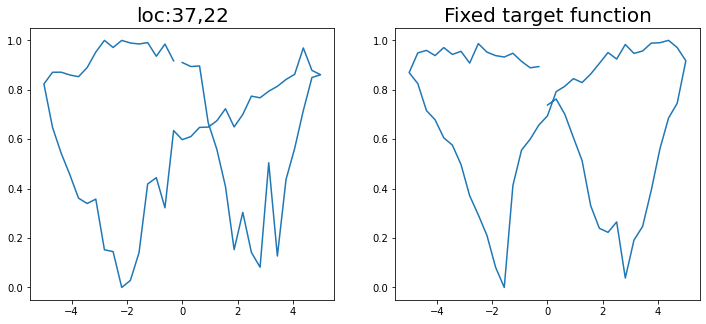

step:  64
Sample #74




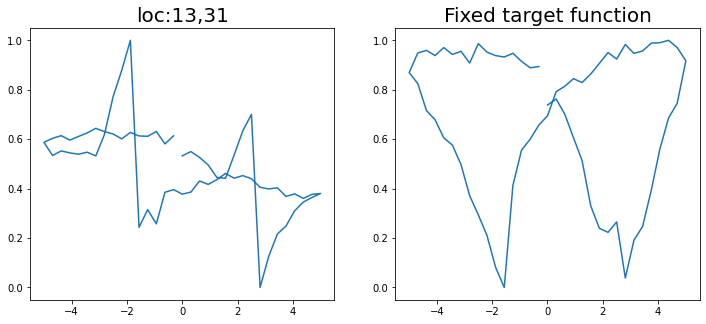

step:  65
Sample #75




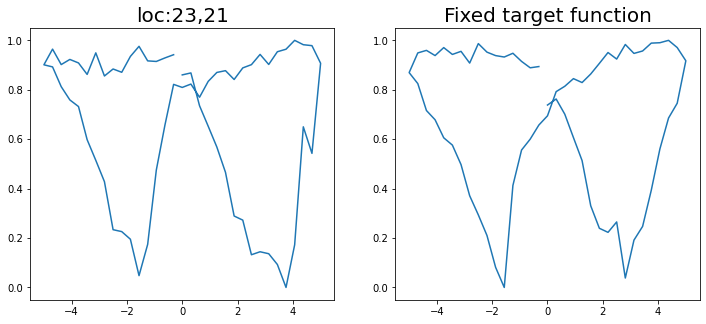

step:  66
Sample #76




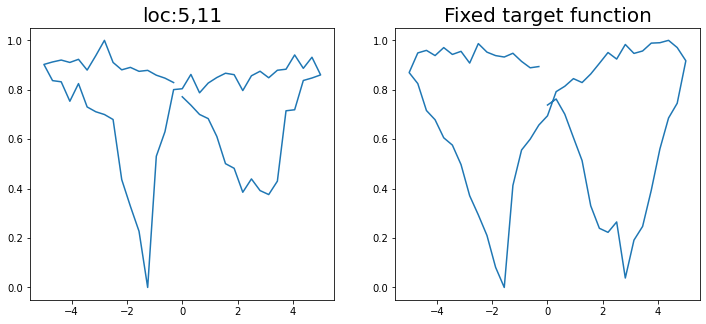

step:  67
Sample #77




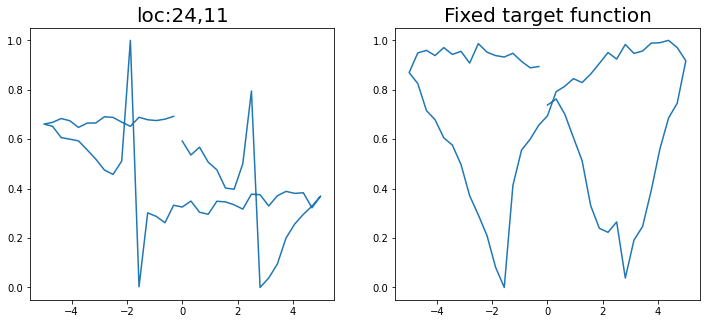

step:  68
Sample #78




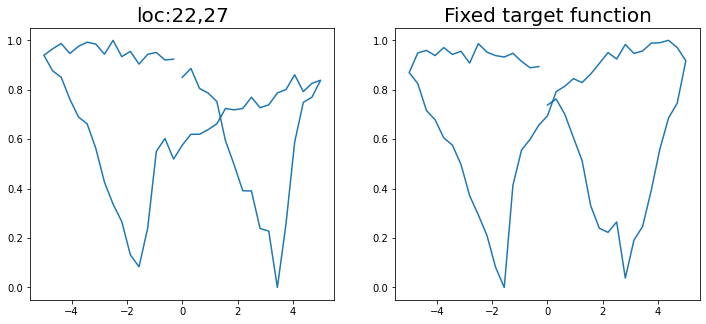

step:  69
Sample #79




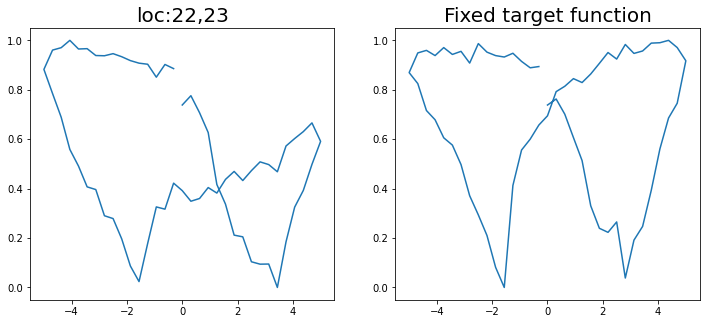

step:  70
Sample #80




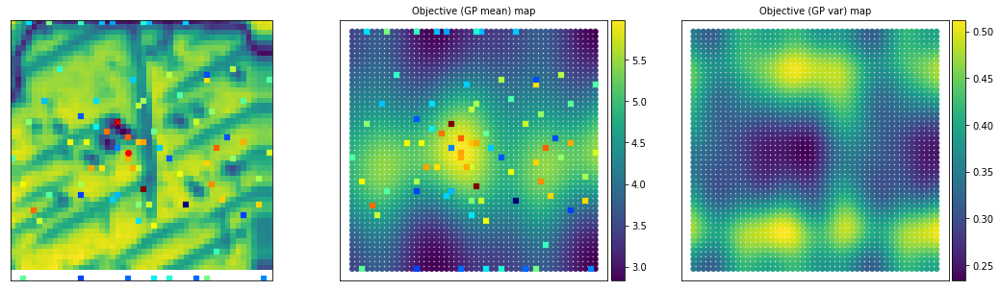

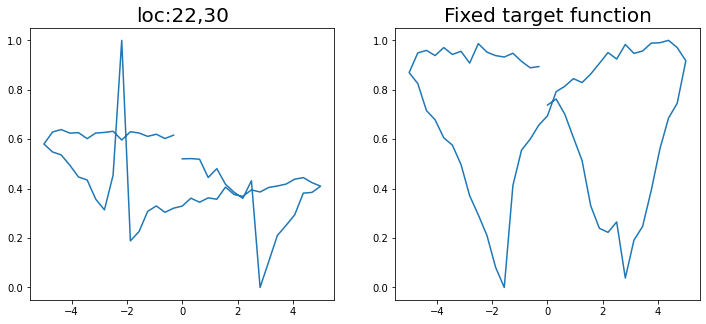

step:  71
Sample #81




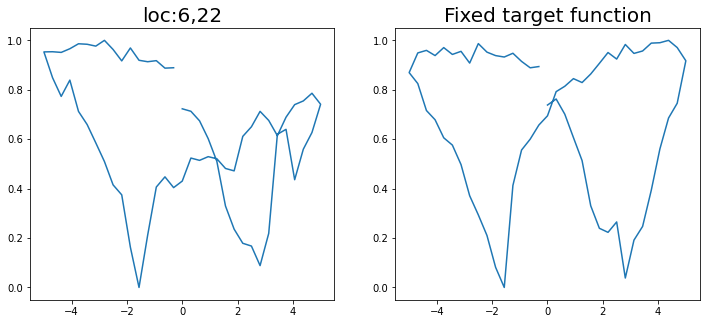

step:  72
Sample #82




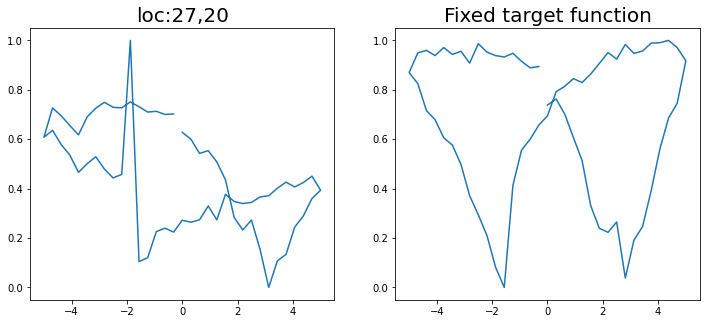

step:  73
Sample #83




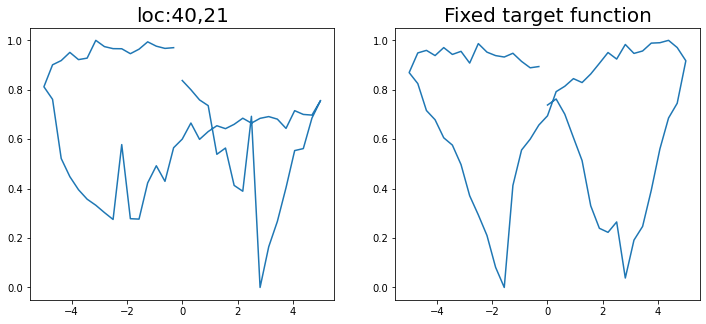

step:  74
Sample #84




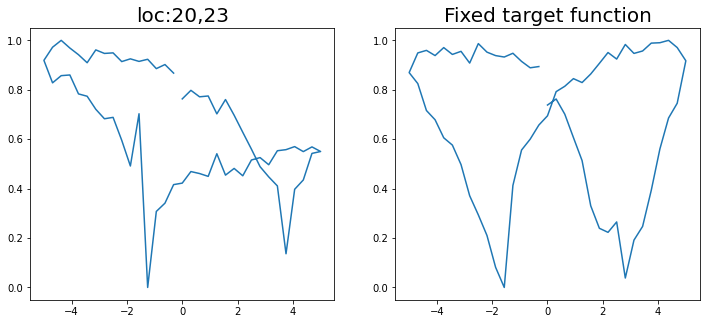

step:  75
Sample #85




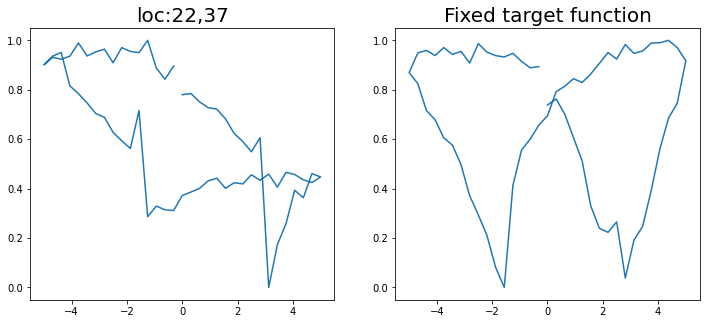

step:  76
Sample #86




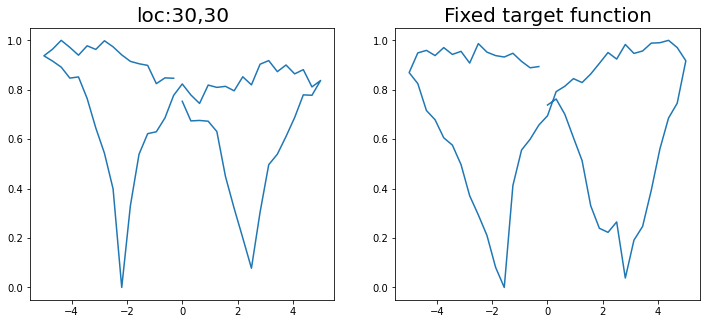

step:  77
Sample #87




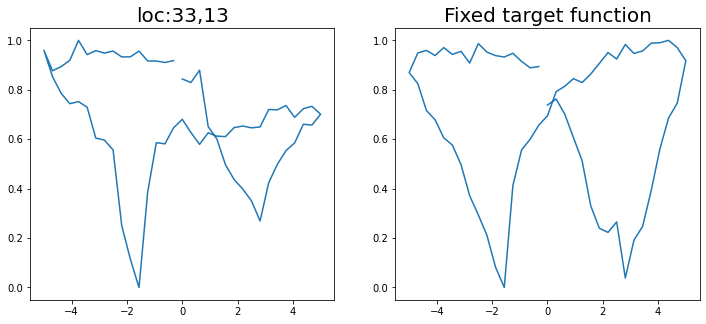

step:  78
Sample #88




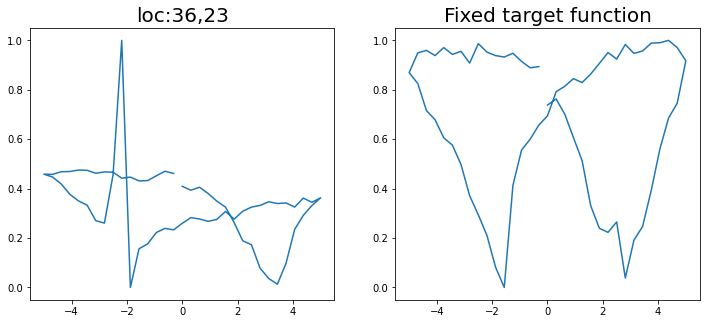

step:  79
Sample #89




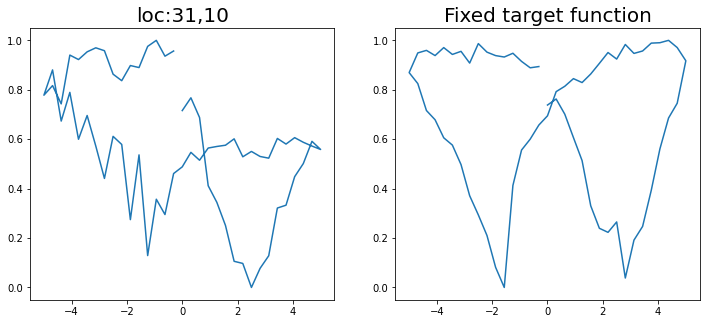

step:  80
Sample #90




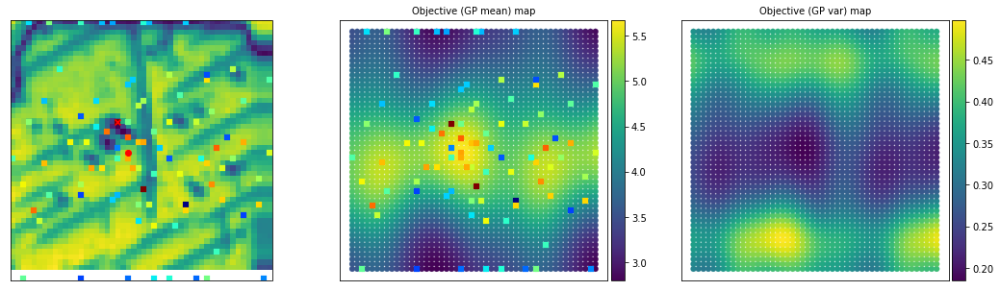

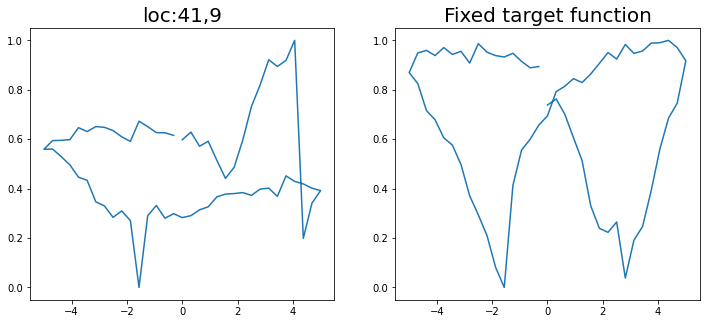

step:  81
Sample #91




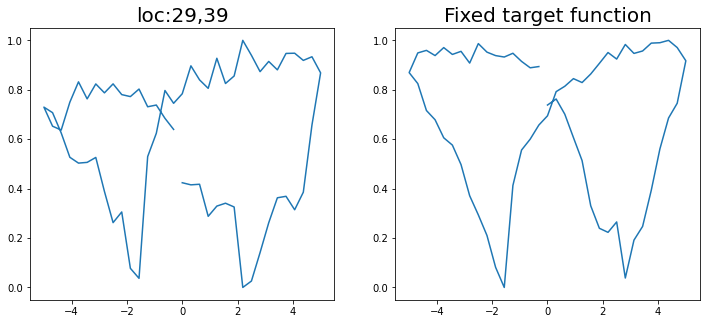

step:  82
Sample #92




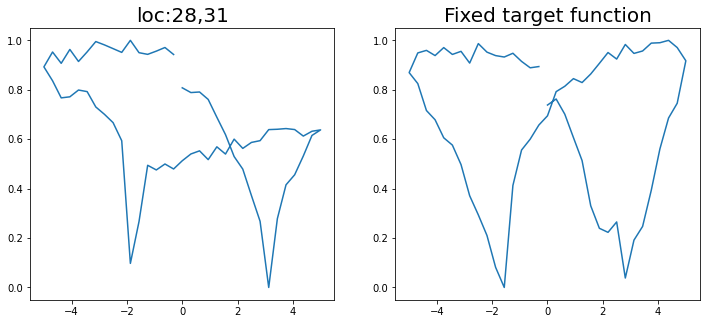

step:  83
Sample #93




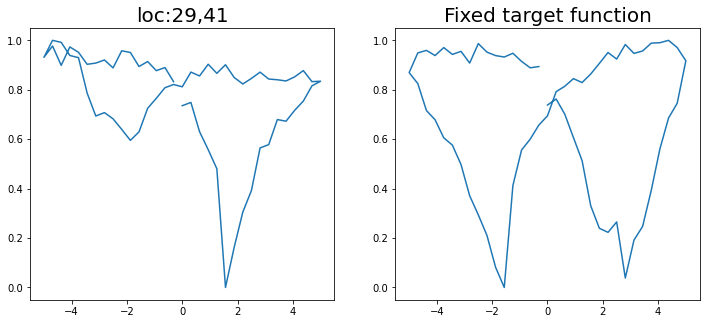

step:  84
Sample #94




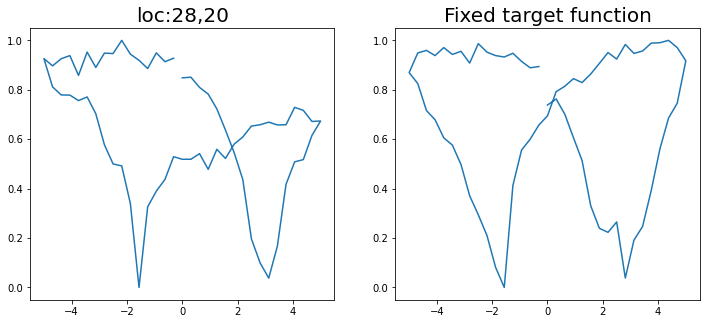

step:  85
Sample #95




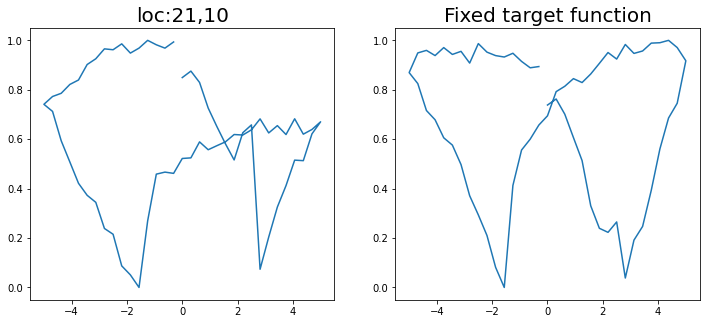

step:  86
Sample #96




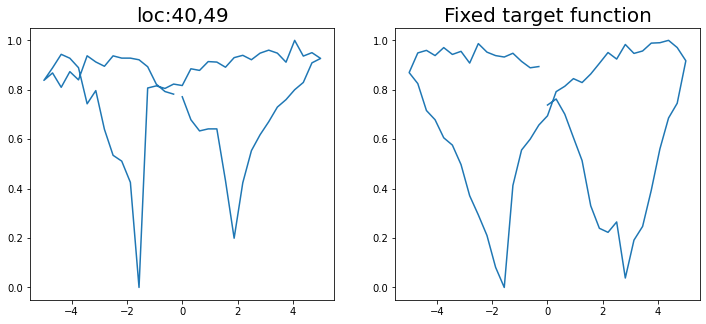

step:  87
Sample #97




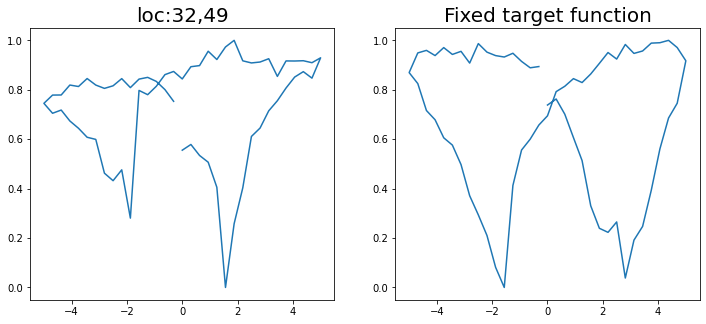

step:  88
Sample #98




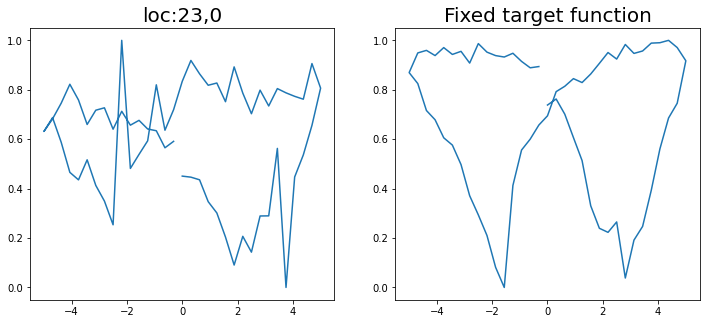

step:  89
Sample #99




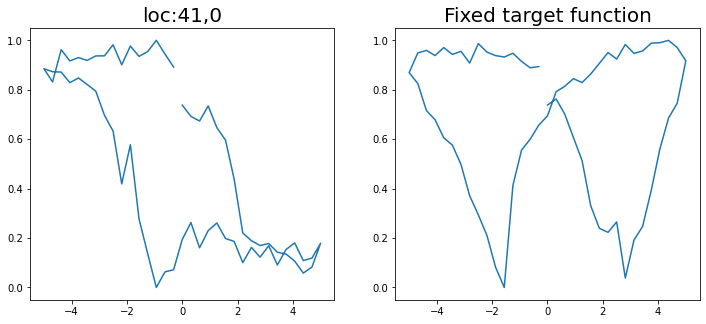

step:  90
Sample #100




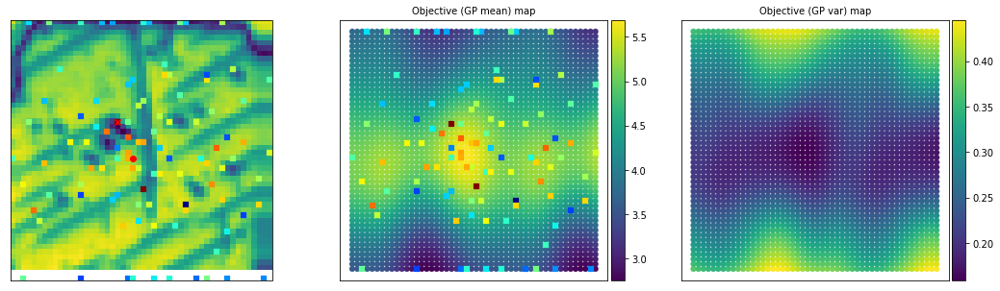

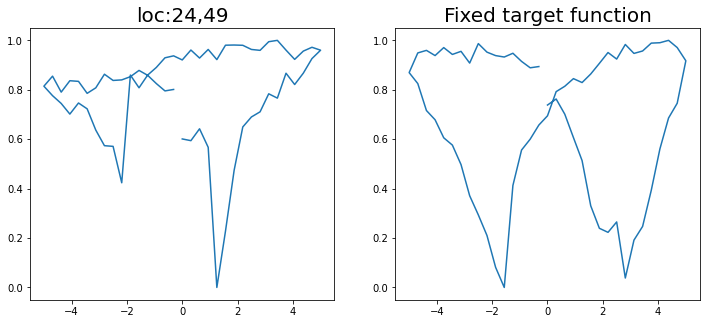

step:  91
Sample #101




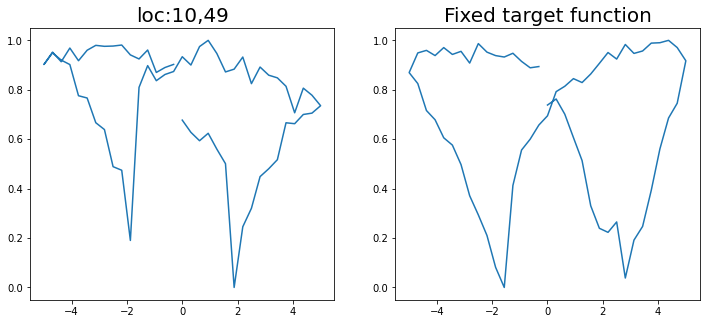

step:  92
Sample #102




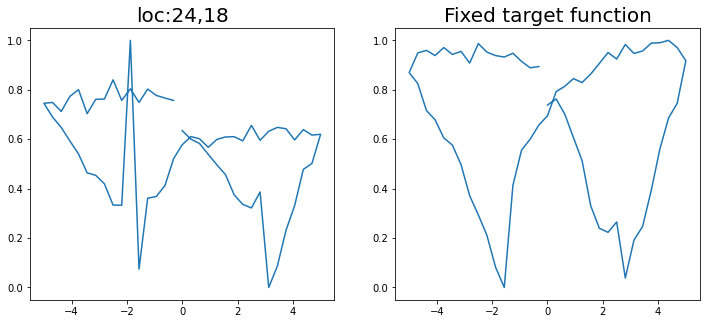

step:  93
Sample #103




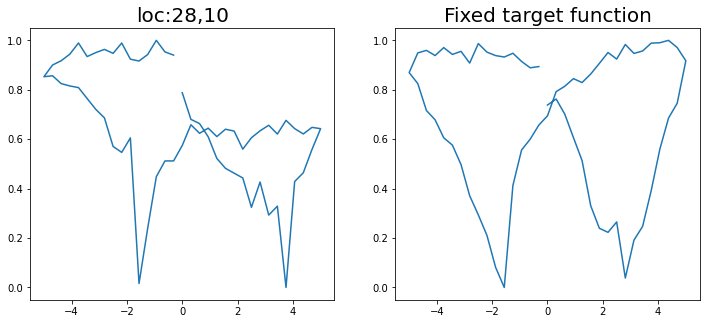

step:  94
Sample #104




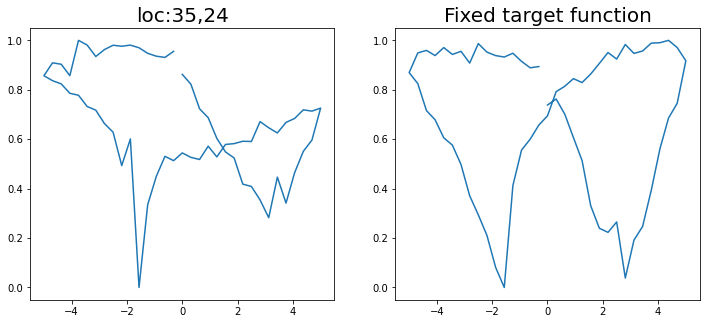

step:  95
Sample #105




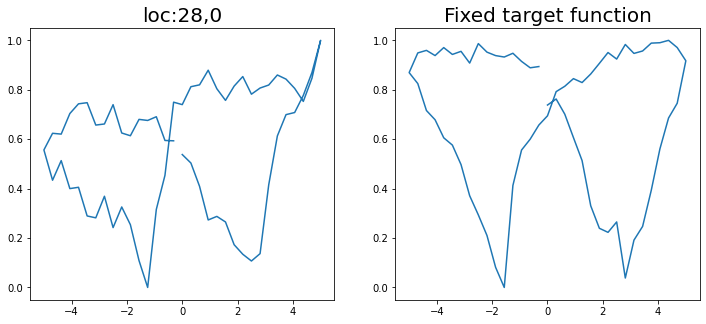

step:  96
Sample #106




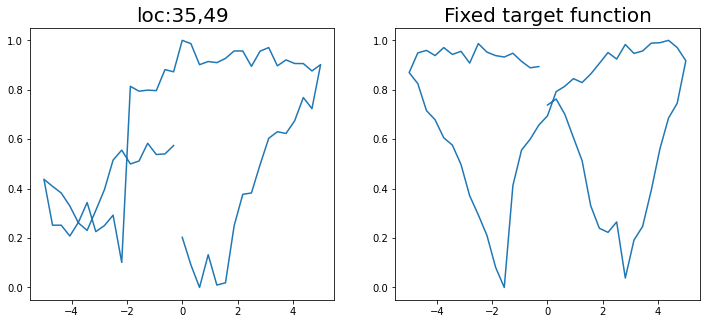

step:  97
Sample #107




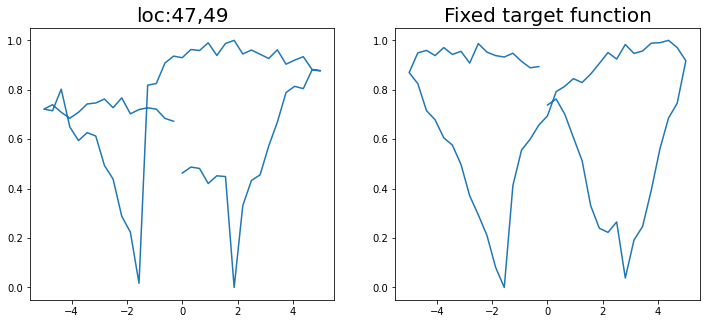

step:  98
Sample #108




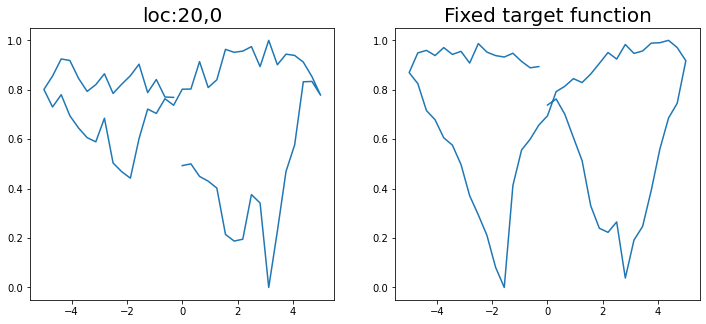

step:  99
Sample #109




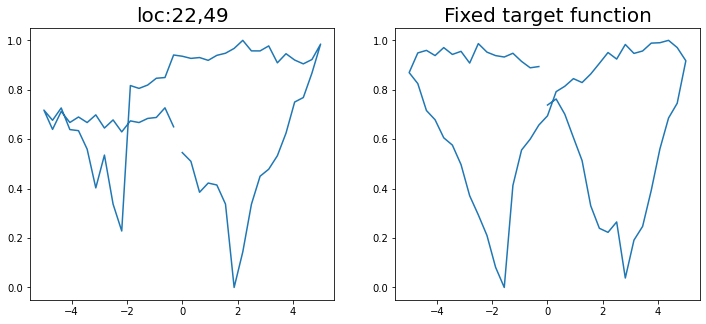

step:  100
Sample #110




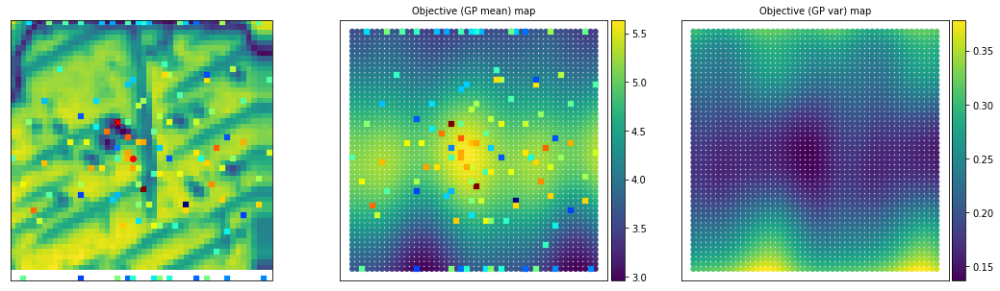

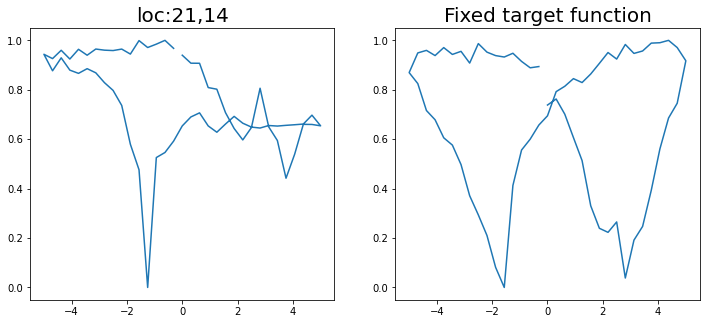

step:  101
Sample #111




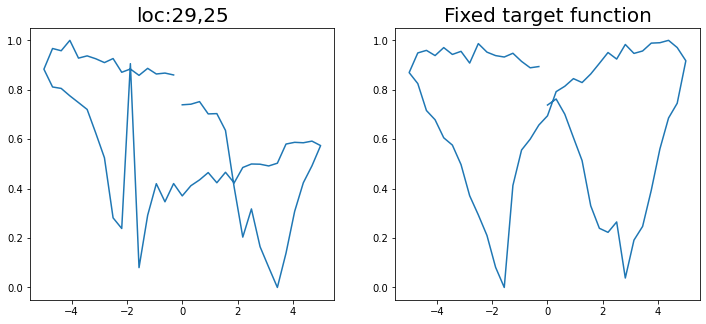

step:  102
Sample #112




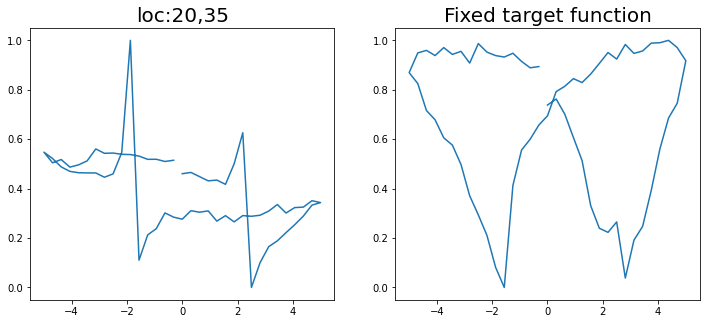

step:  103
Sample #113




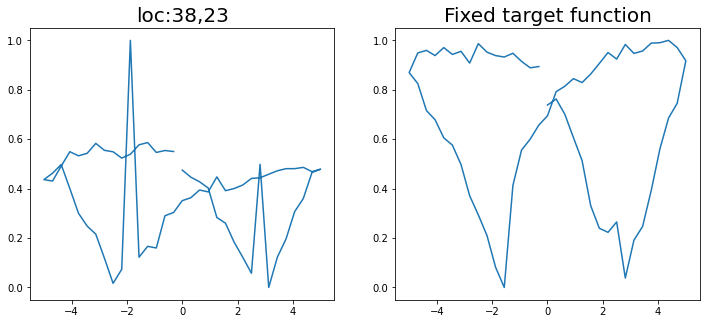

step:  104
Sample #114




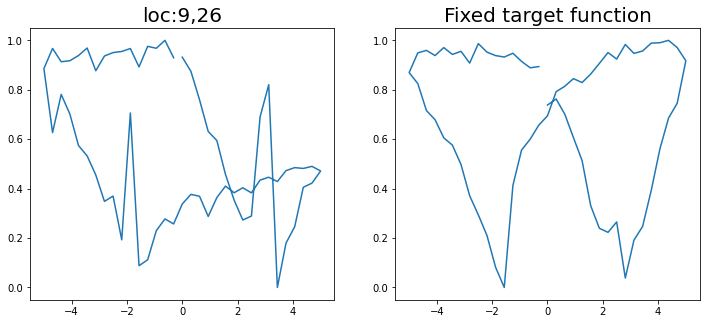

step:  105
Sample #115




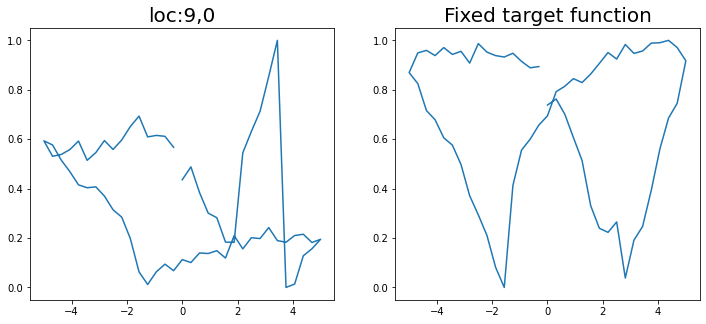

step:  106
Sample #116




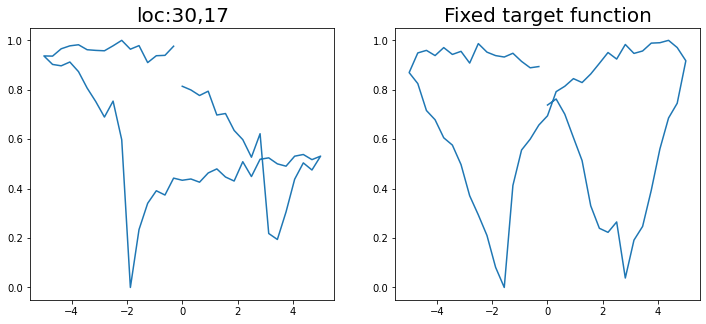

step:  107
Sample #117




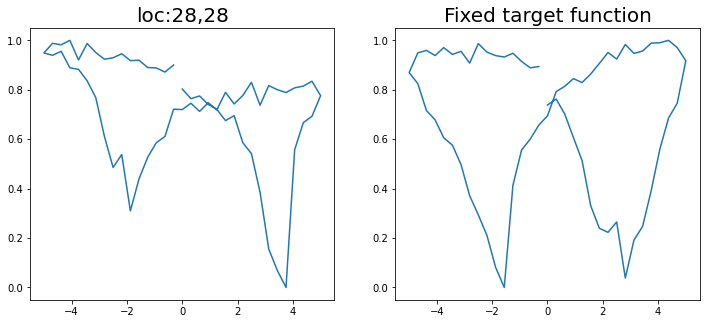

step:  108
Sample #118




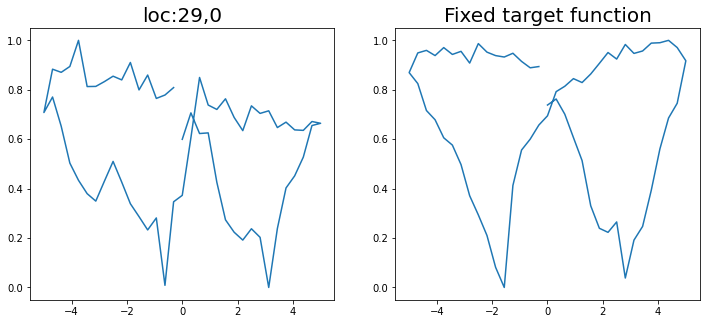

step:  109
Sample #119




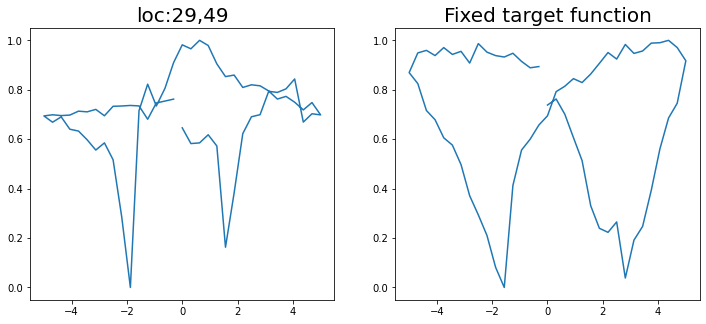

step:  110
Sample #120




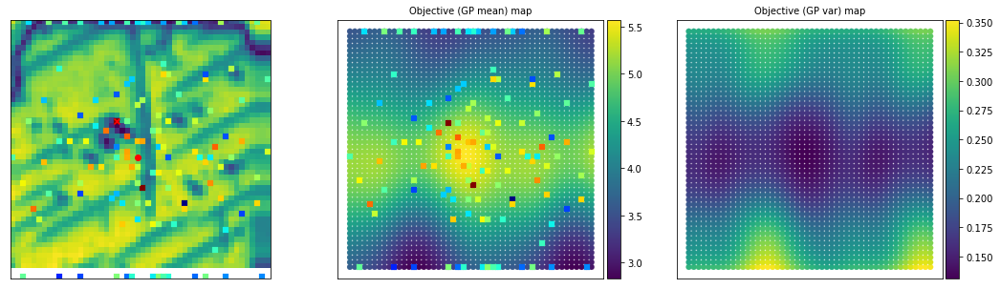

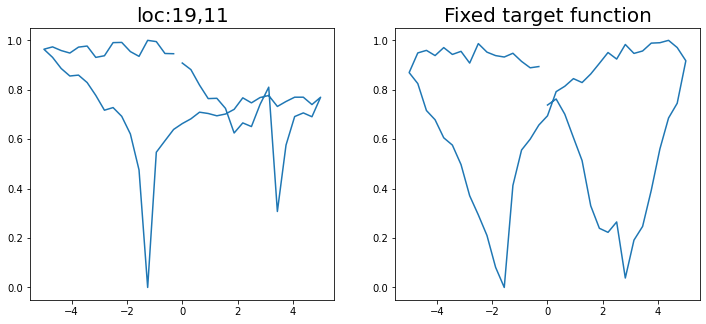

step:  111
Sample #121




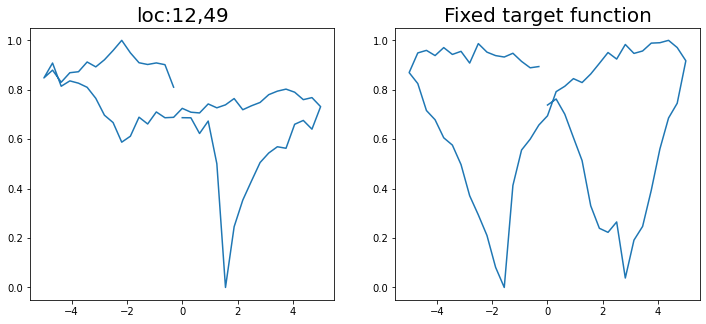

step:  112
Sample #122




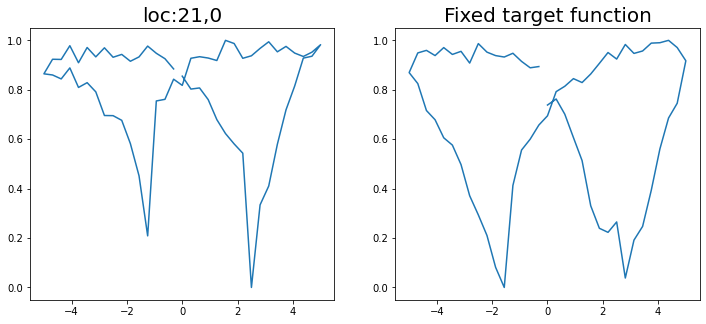

step:  113
Sample #123




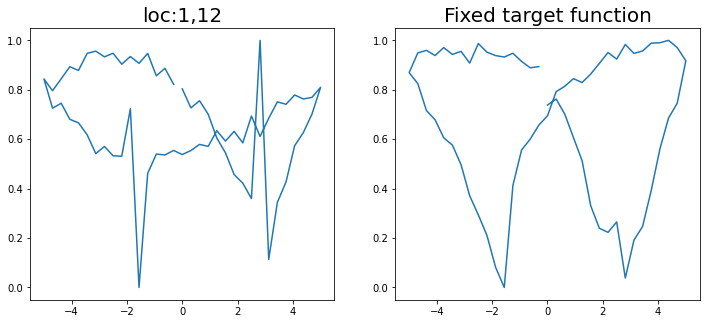

step:  114
Sample #124




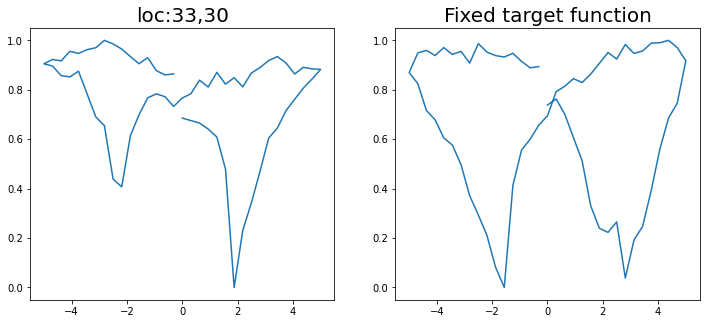

step:  115
Sample #125




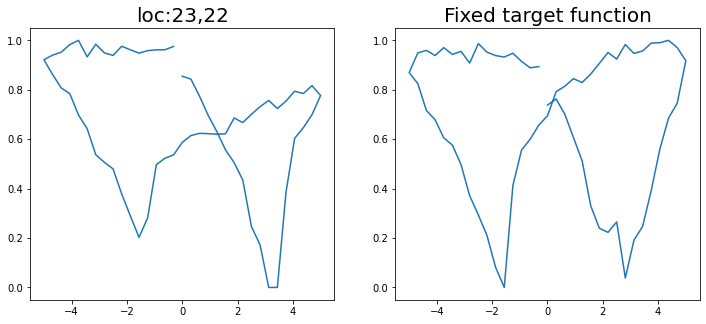

step:  116
Sample #126




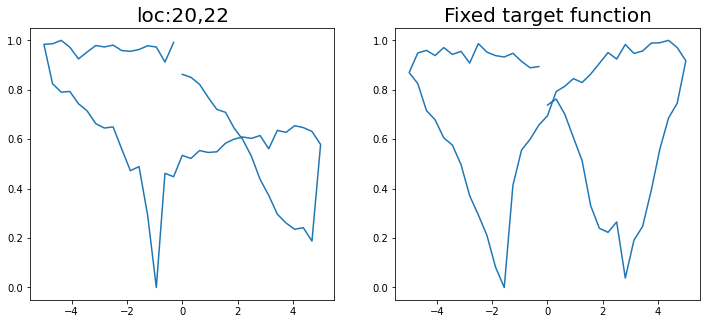

step:  117
Sample #127




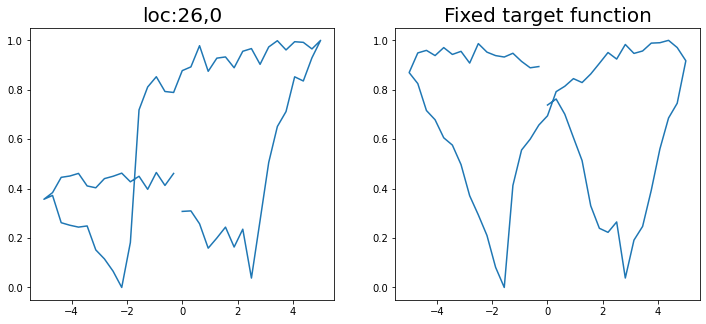

step:  118
Sample #128




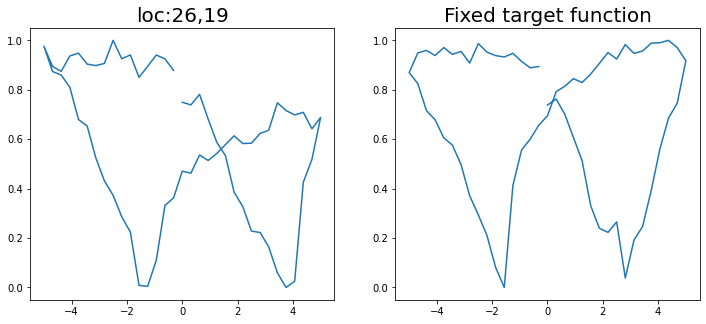

step:  119
Sample #129




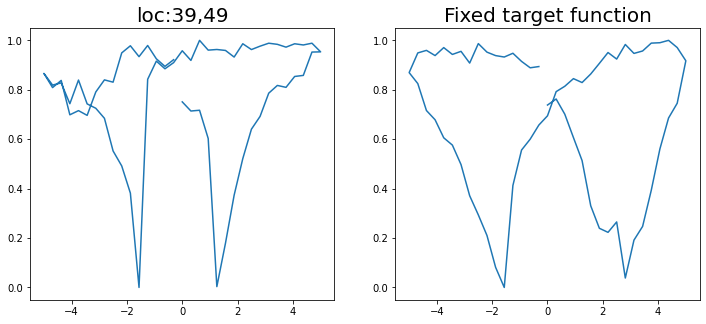

step:  120
Sample #130




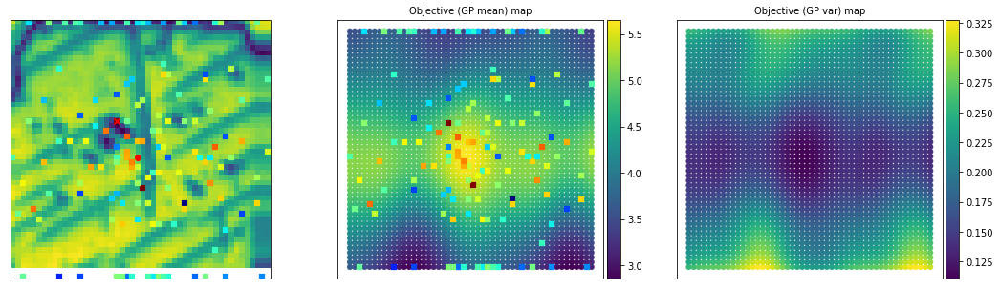

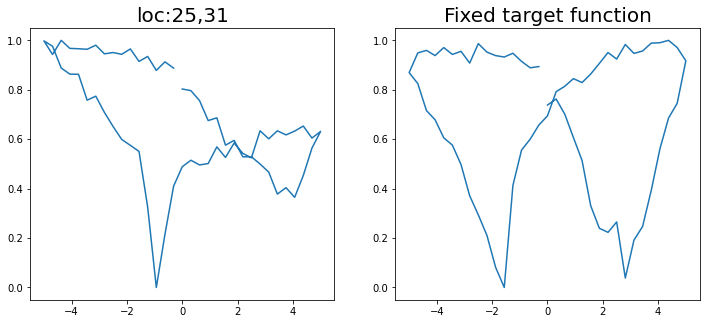

step:  121
Sample #131




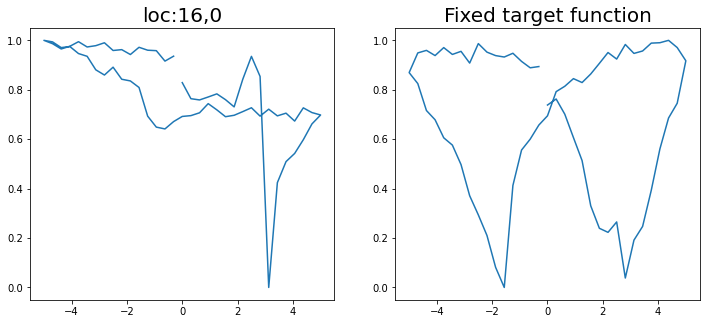

step:  122
Sample #132




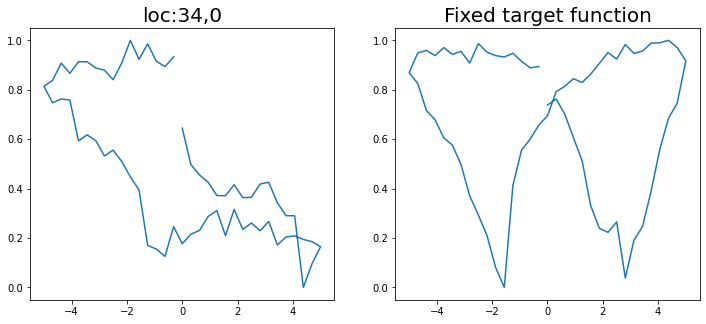

step:  123
Sample #133




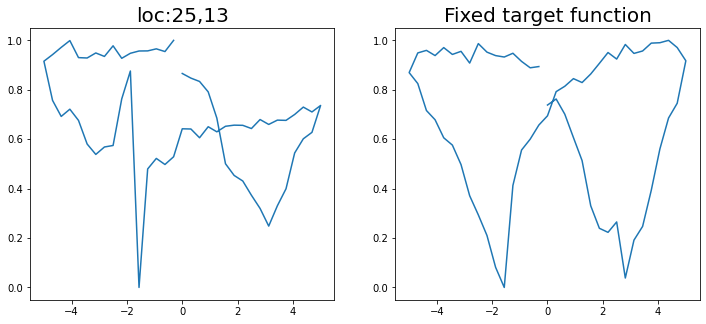

step:  124
Sample #134




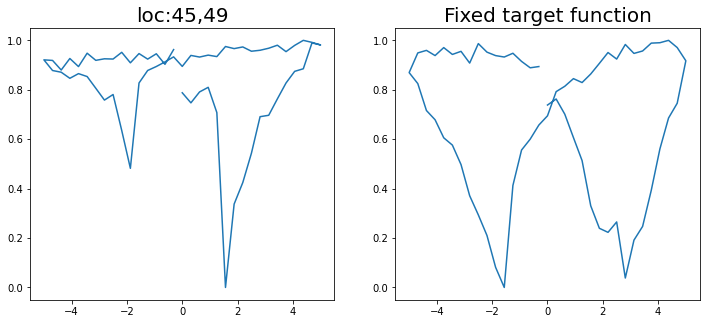

step:  125
Sample #135




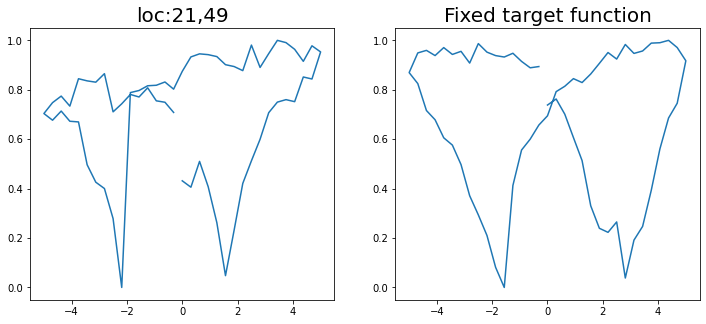

step:  126
Sample #136




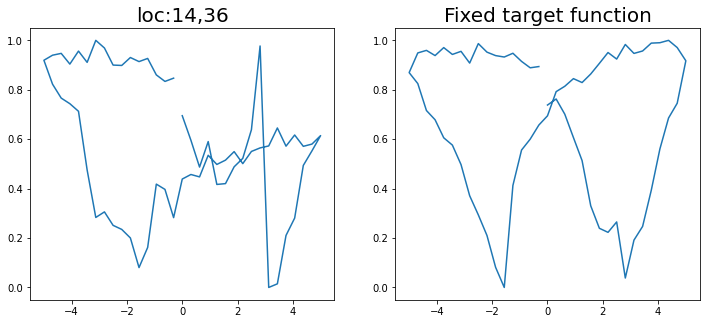

step:  127
Sample #137




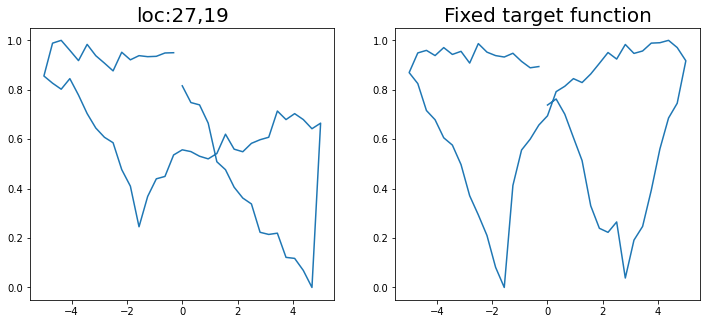

step:  128
Sample #138




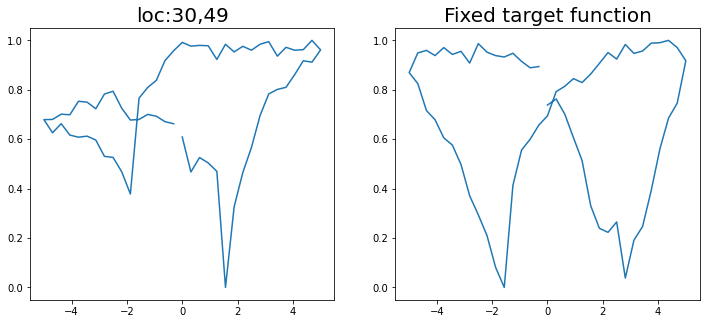

step:  129
Sample #139




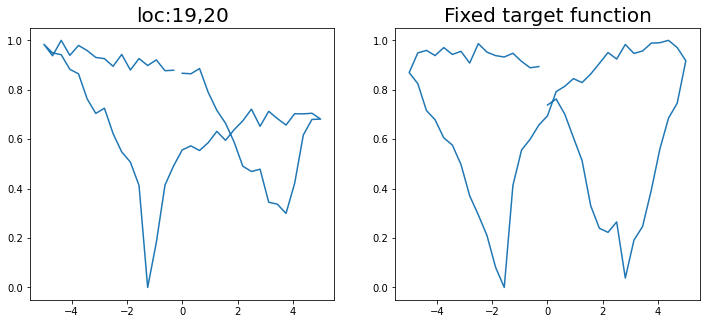

step:  130
Sample #140




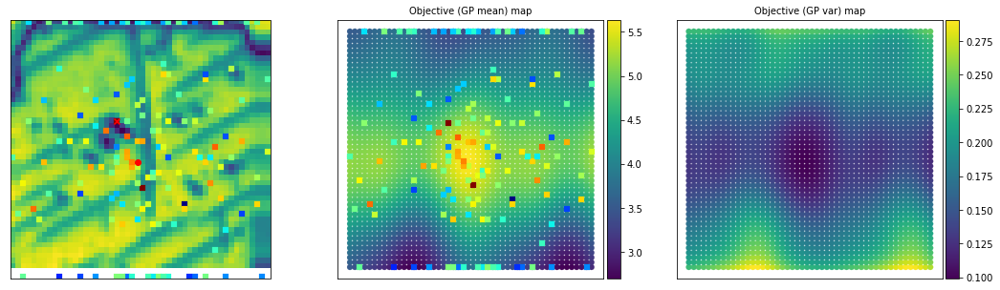

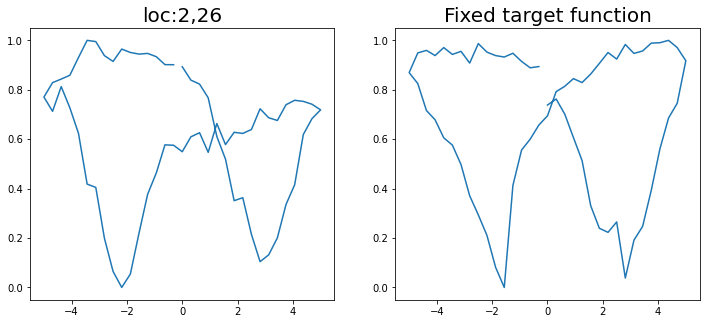

step:  131
Sample #141




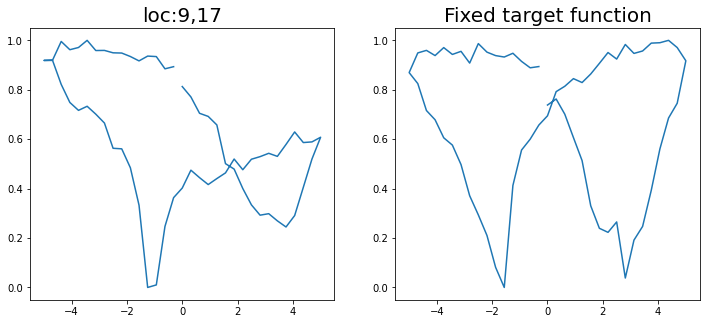

step:  132
Sample #142




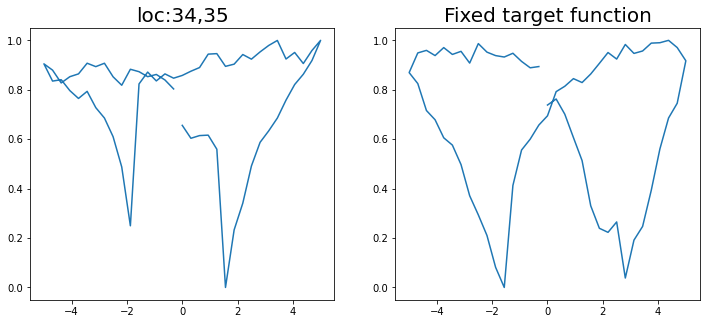

step:  133
Sample #143




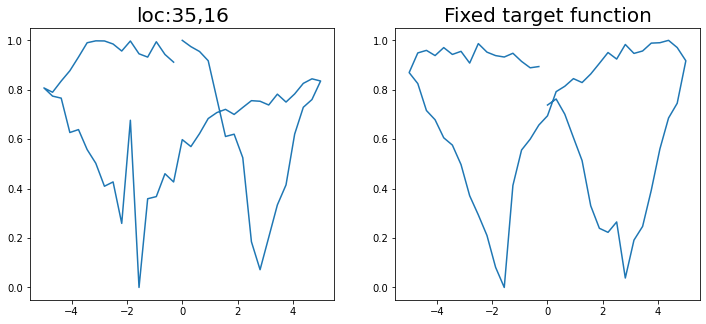

step:  134
Sample #144




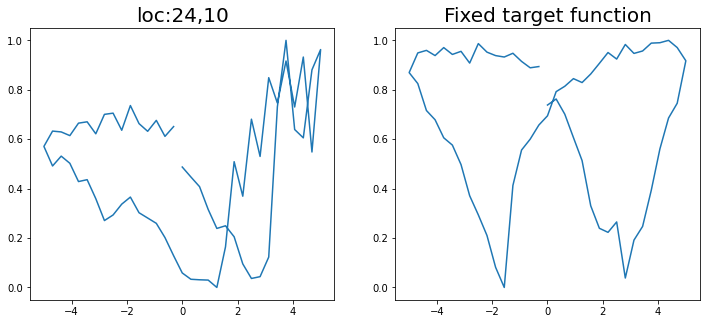

step:  135
Sample #145




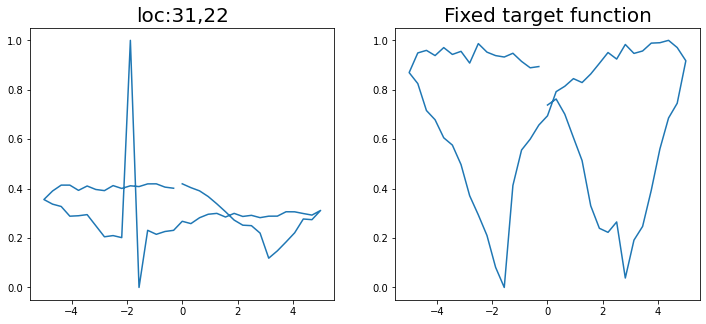

step:  136
Sample #146




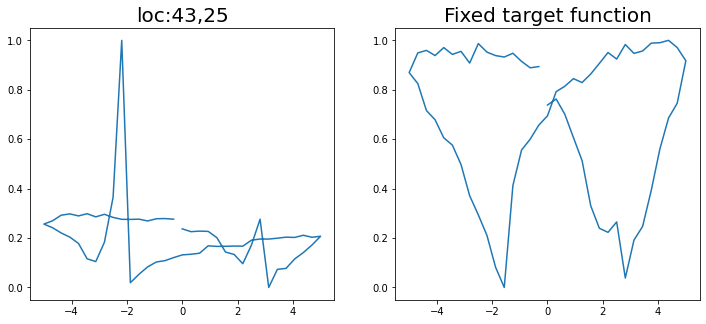

step:  137
Sample #147




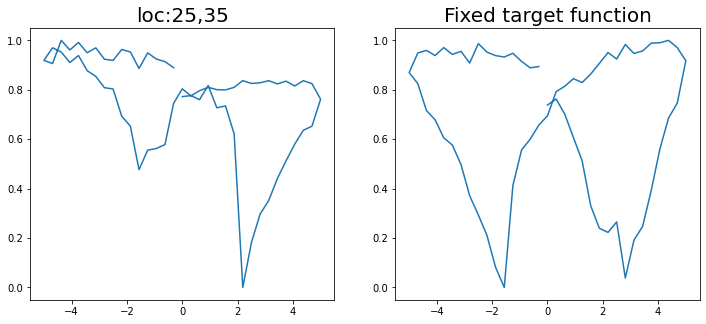

step:  138
Sample #148




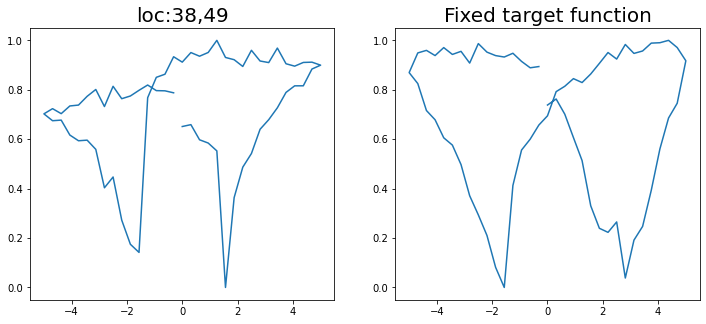

step:  139
Sample #149




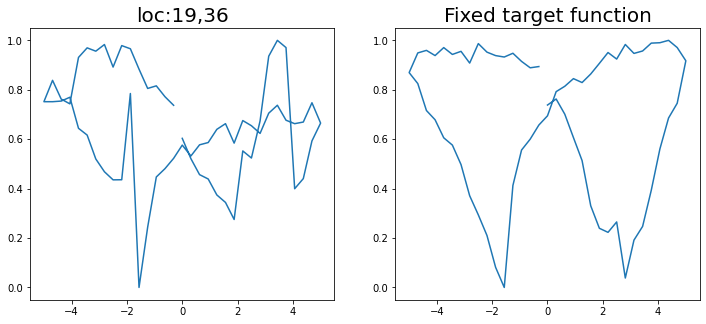

step:  140
Sample #150




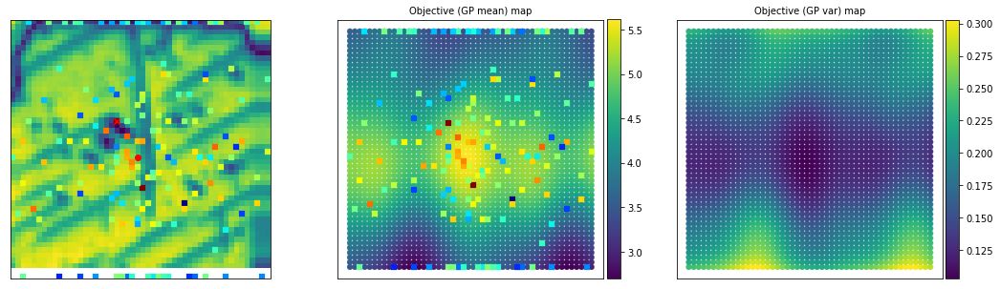

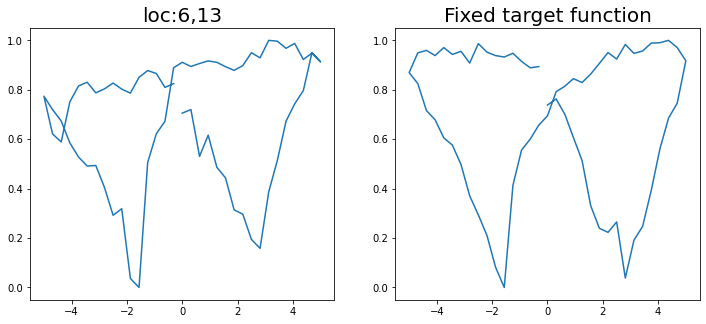

step:  141
Sample #151




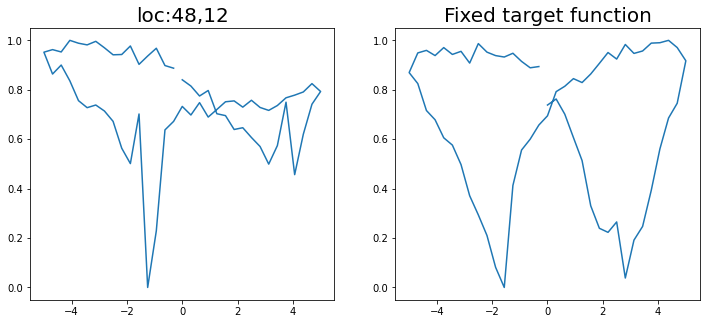

step:  142
Sample #152




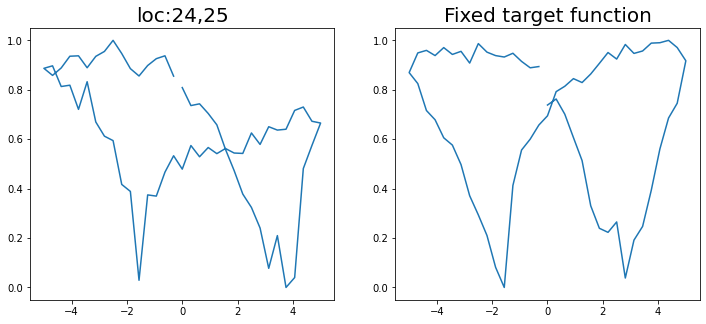

step:  143
Sample #153




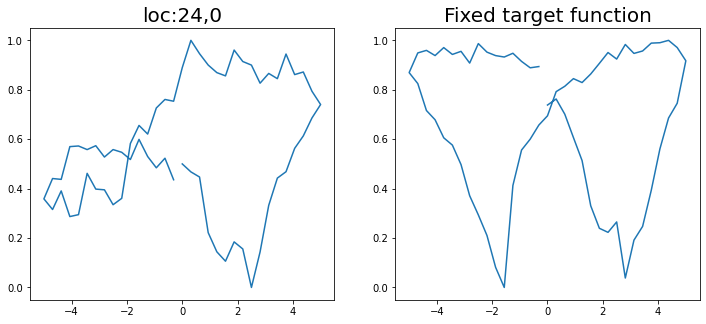

step:  144
Sample #154




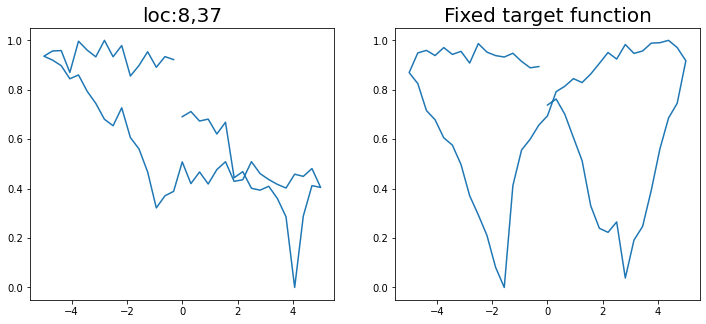

step:  145
Sample #155




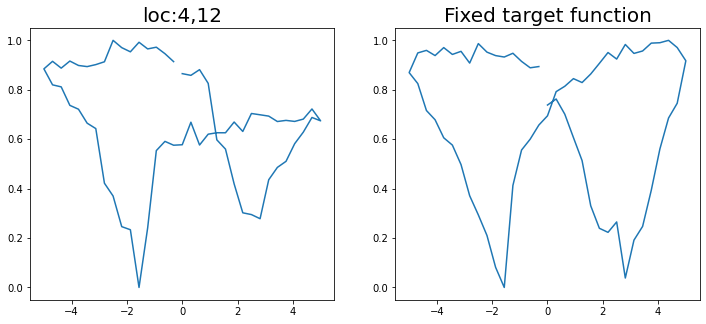

step:  146
Sample #156




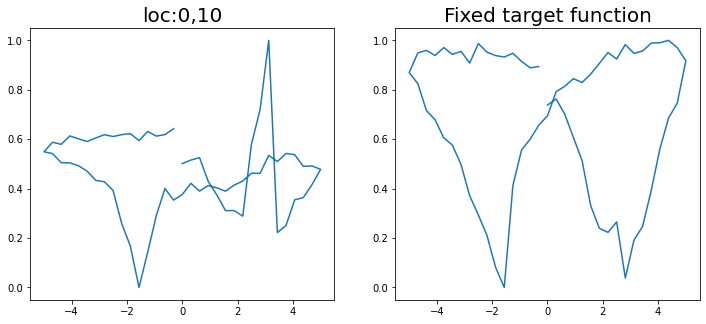

step:  147
Sample #157




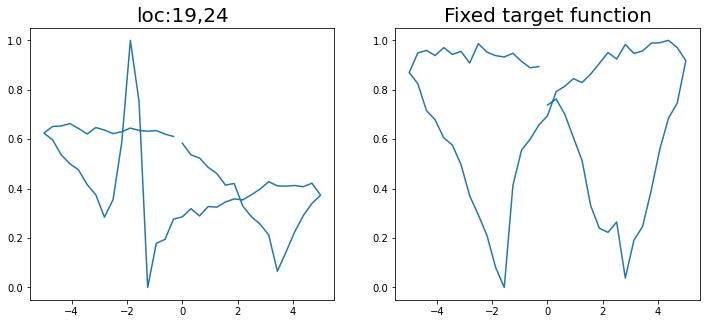

step:  148
Sample #158




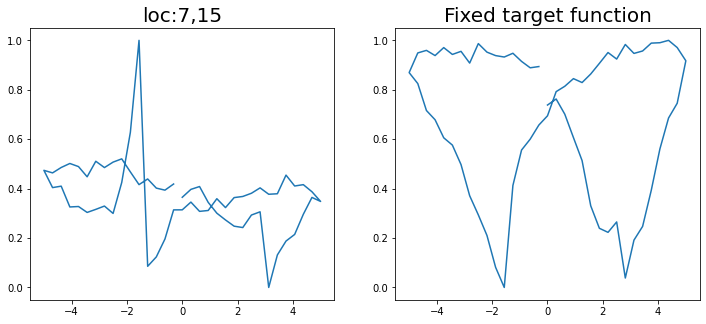

step:  149
Sample #159




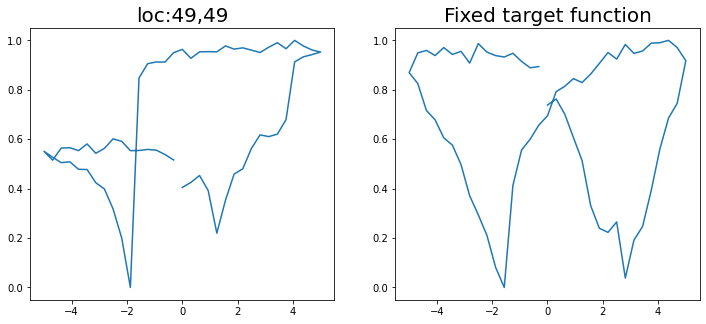

step:  150
Sample #160




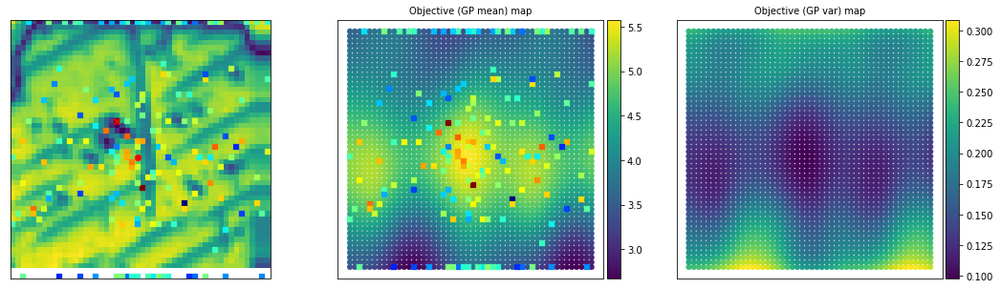

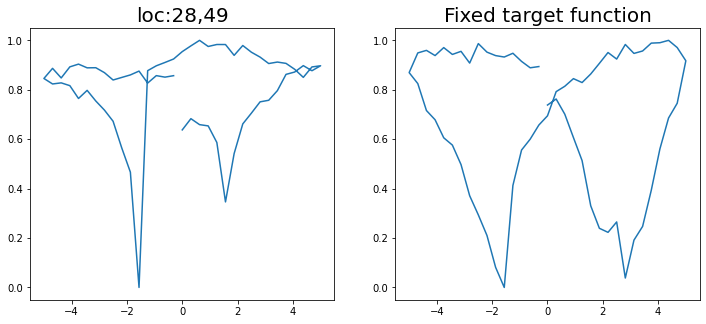

step:  151
Sample #161




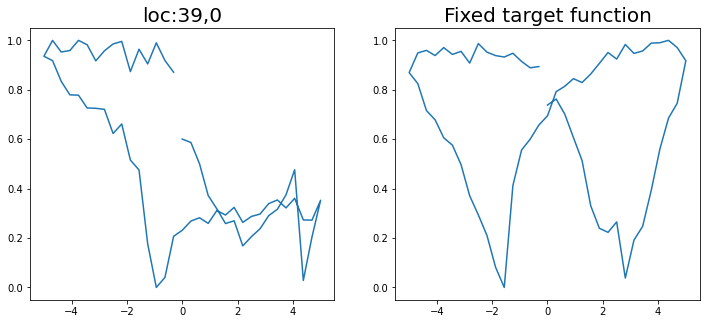

step:  152
Sample #162




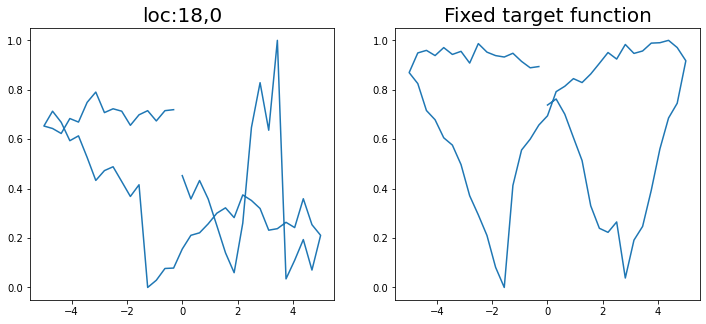

step:  153
Sample #163




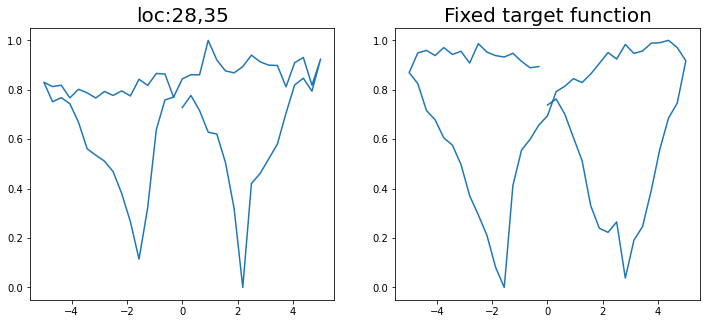

step:  154
Sample #164




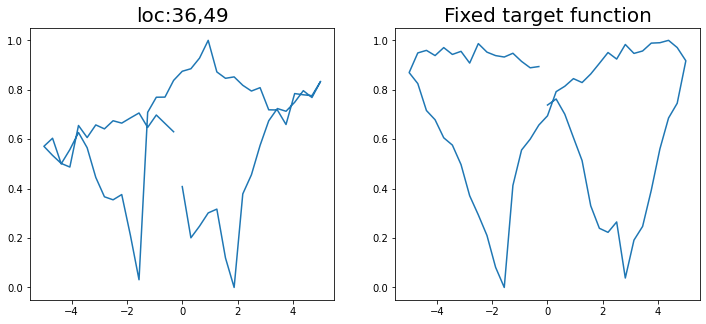

step:  155
Sample #165




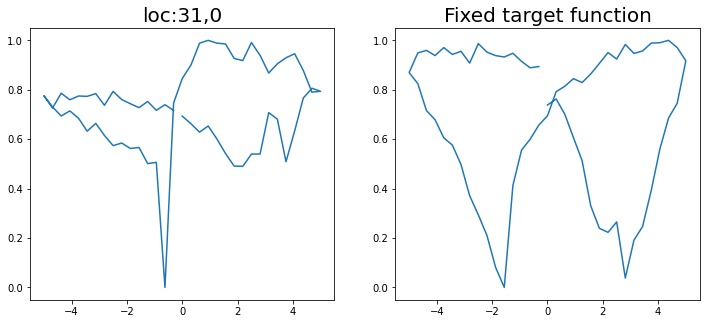

step:  156
Sample #166




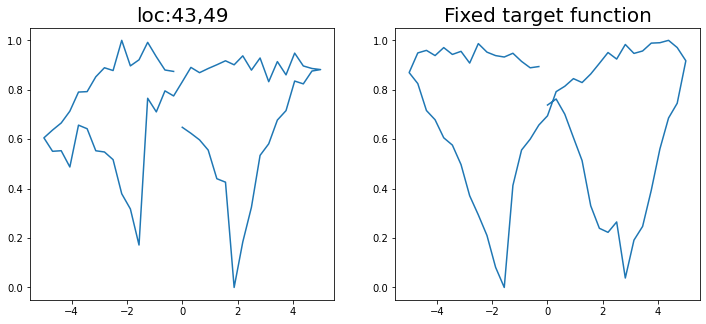

step:  157
Sample #167




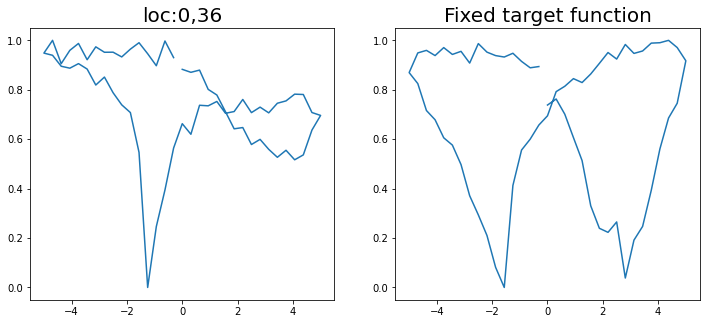

step:  158
Sample #168




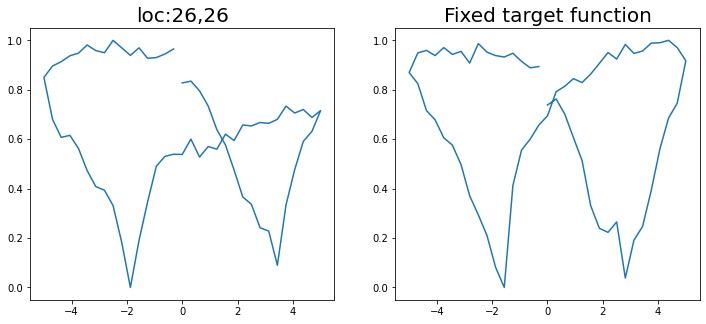

step:  159
Sample #169




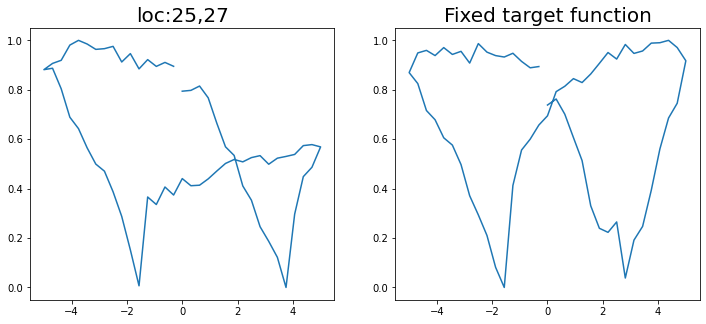

step:  160
Sample #170




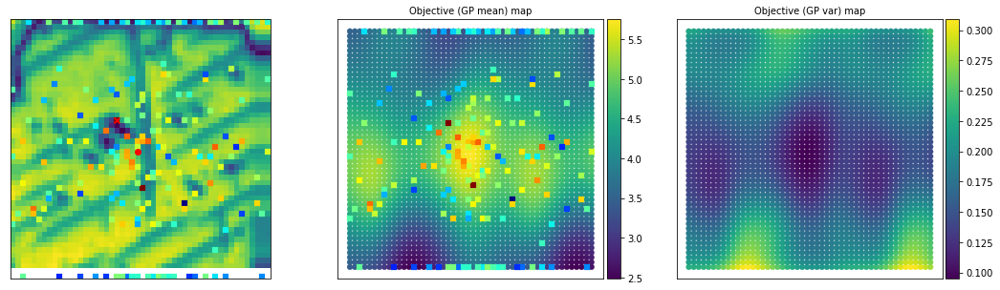

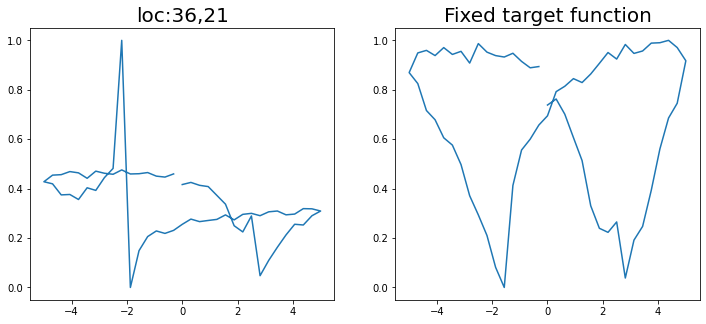

step:  161
Sample #171




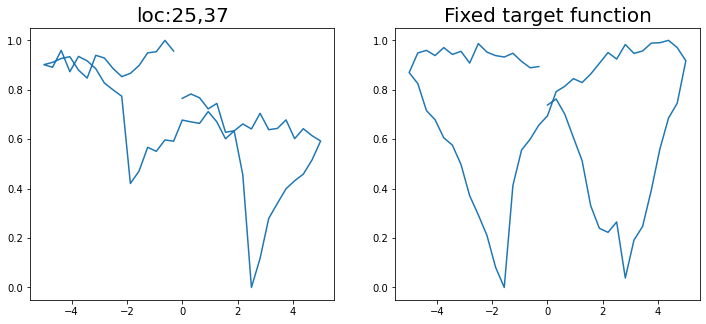

step:  162
Sample #172




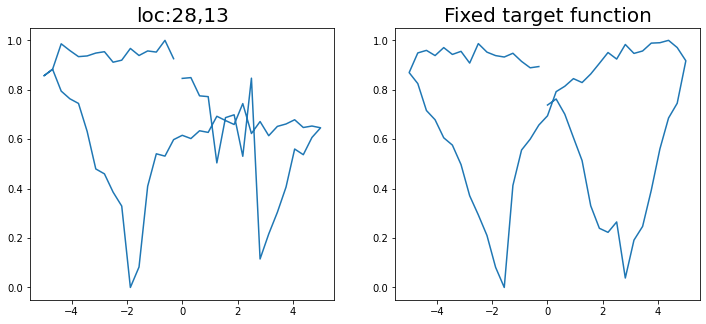

step:  163
Sample #173




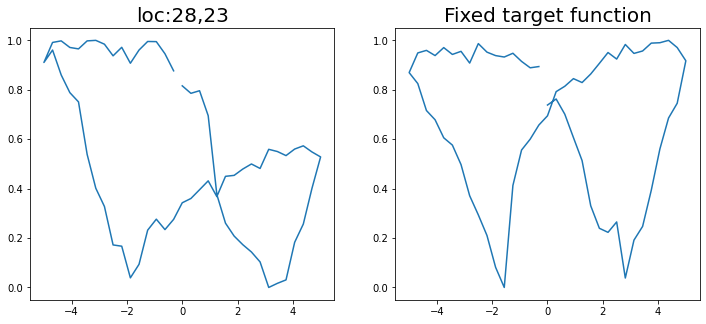

step:  164
Sample #174




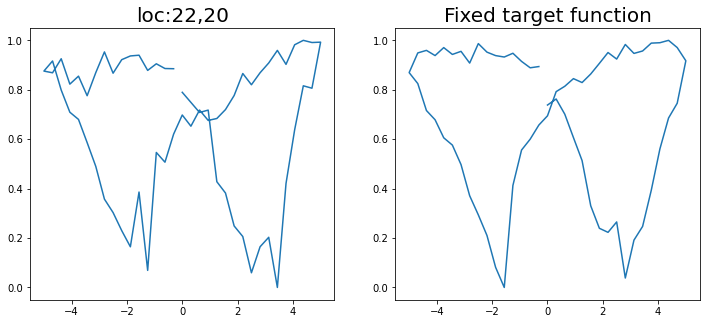

step:  165
Sample #175




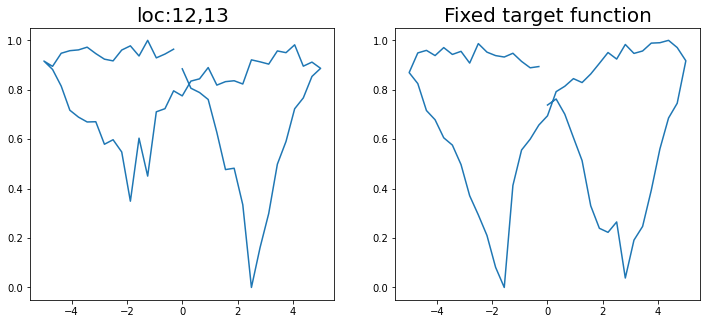

step:  166
Sample #176




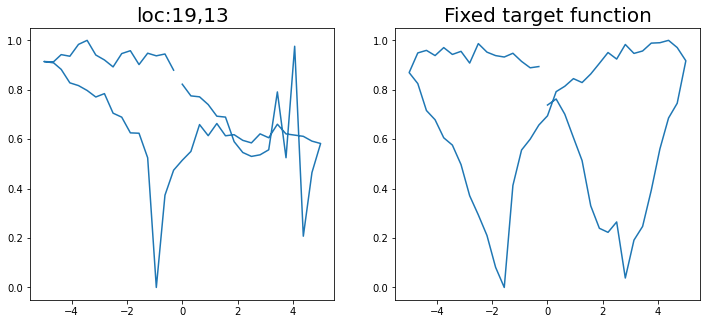

step:  167
Sample #177




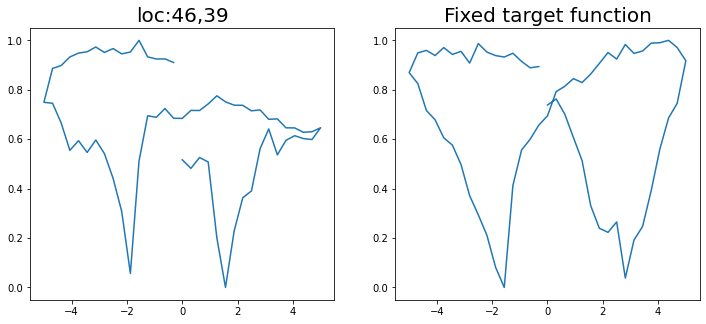

step:  168
Sample #178




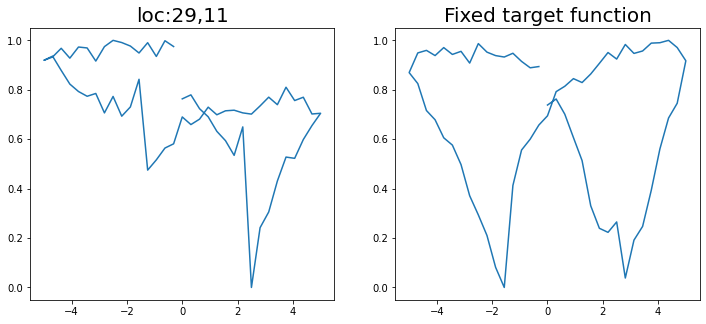

step:  169
Sample #179




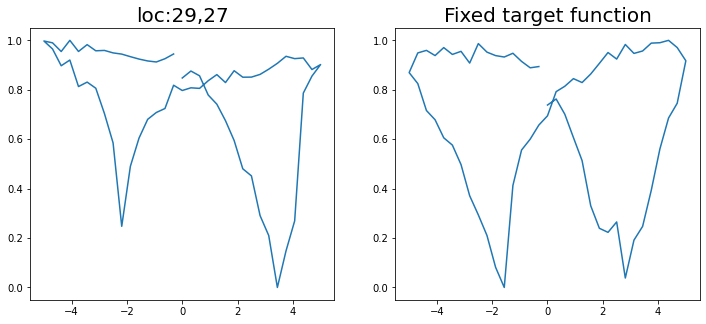

step:  170
Sample #180




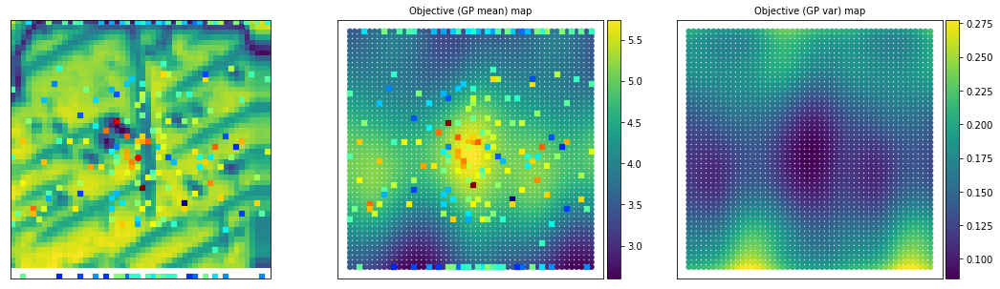

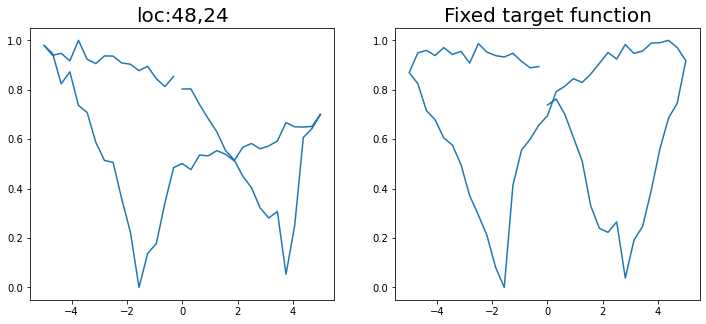

step:  171
Sample #181




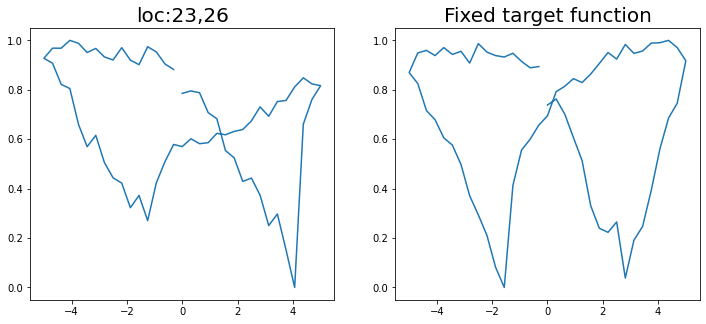

step:  172
Sample #182




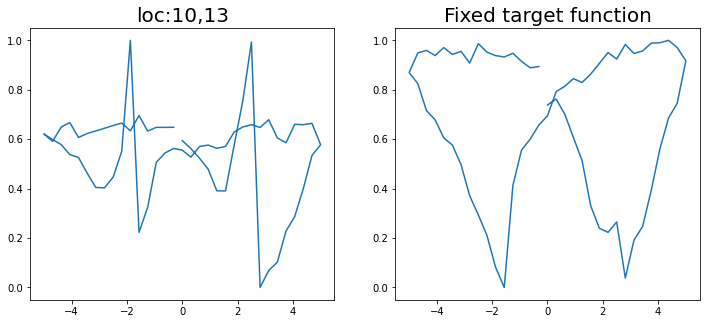

step:  173
Sample #183




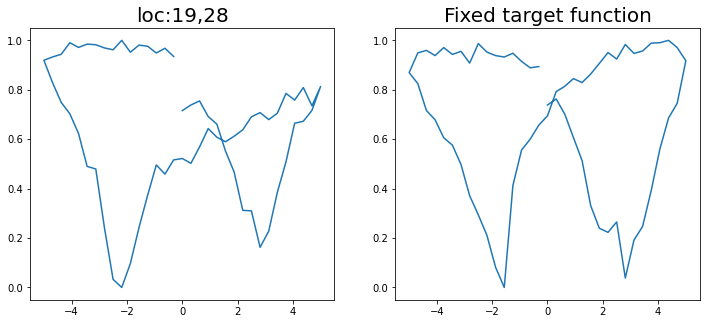

step:  174
Sample #184




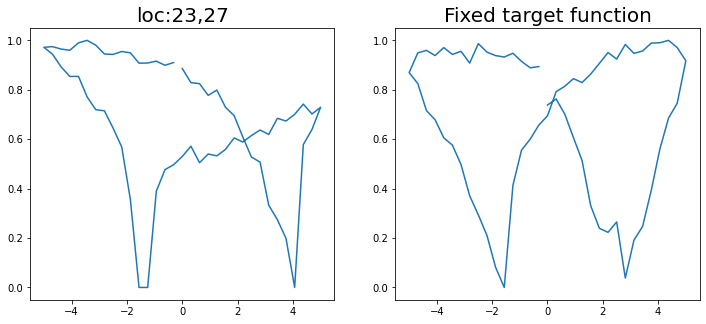

step:  175
Sample #185




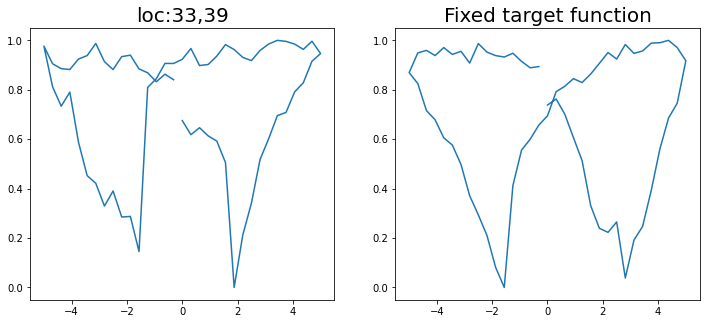

step:  176
Sample #186




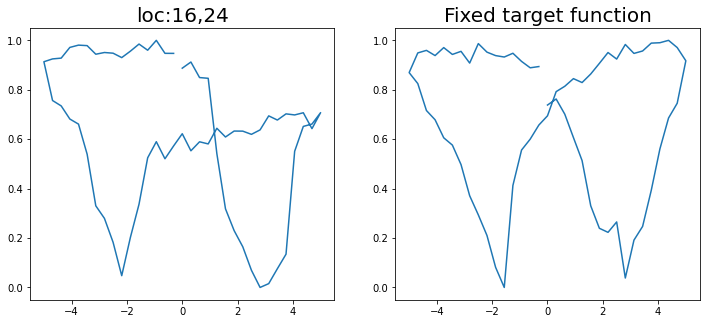

step:  177
Sample #187




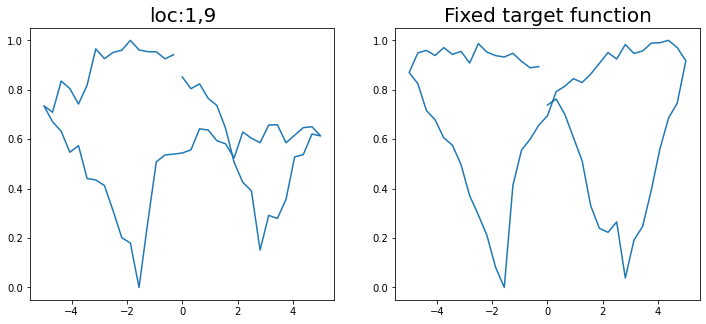

step:  178
Sample #188




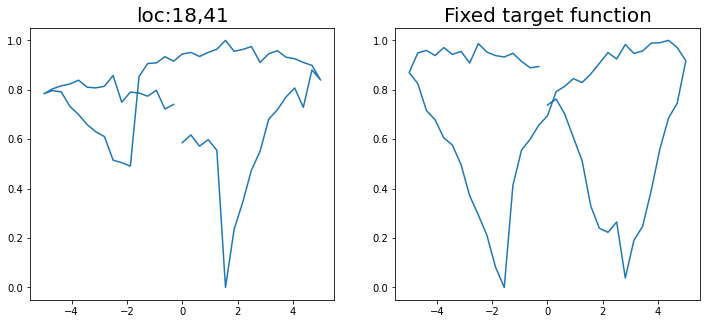

step:  179
Sample #189




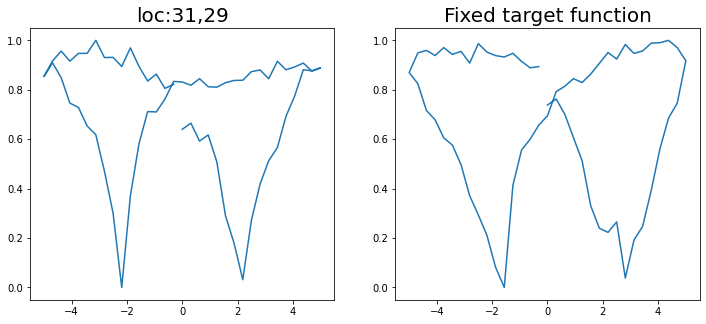

step:  180
Sample #190




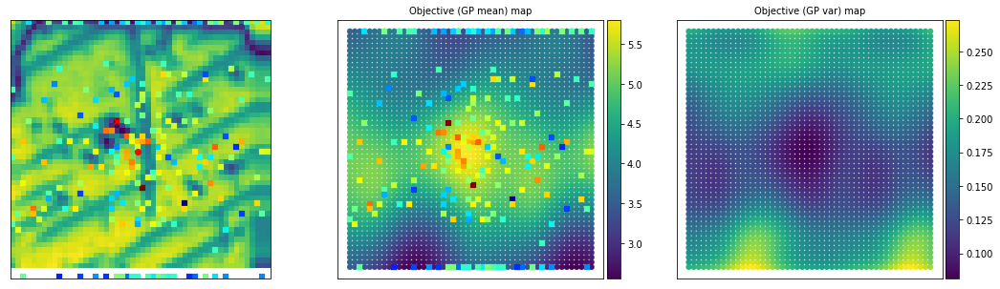

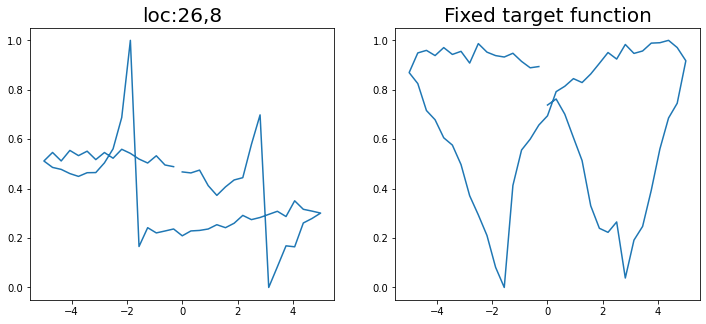

step:  181
Sample #191




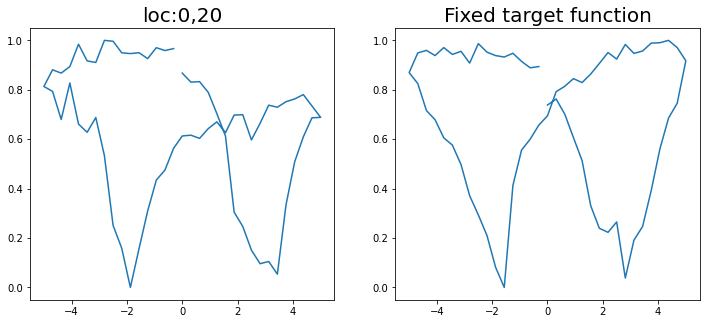

step:  182
Sample #192




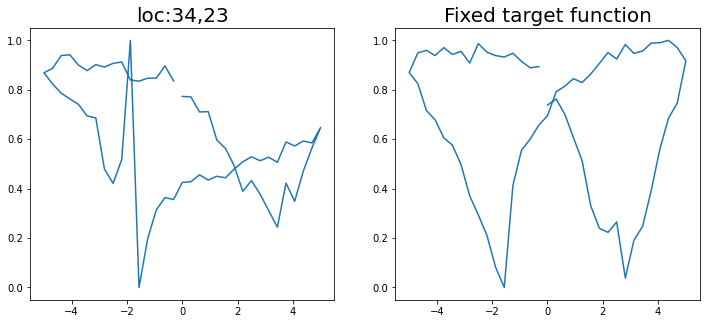

step:  183
Sample #193




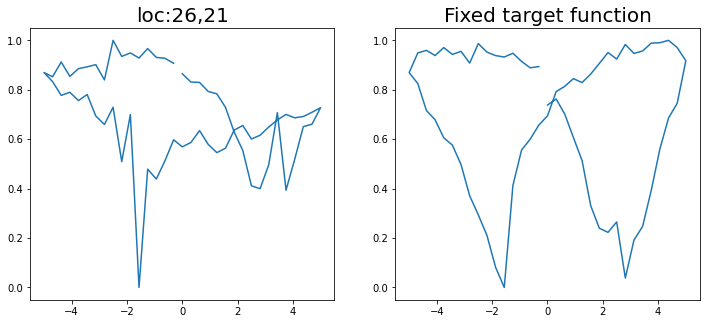

step:  184
Sample #194




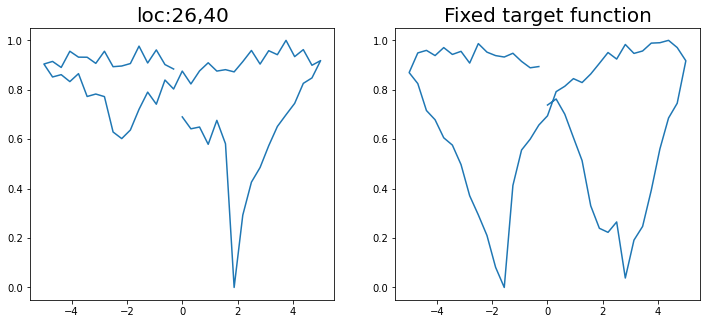

step:  185
Sample #195




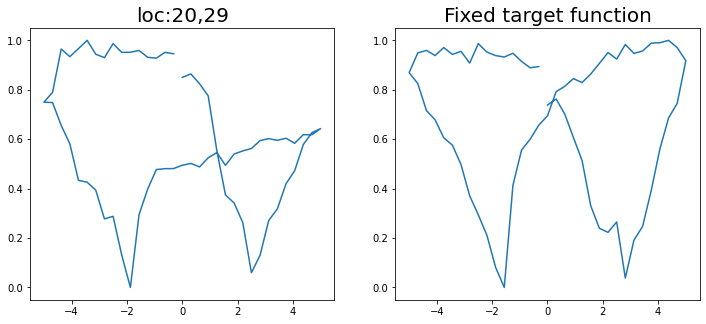

step:  186
Sample #196




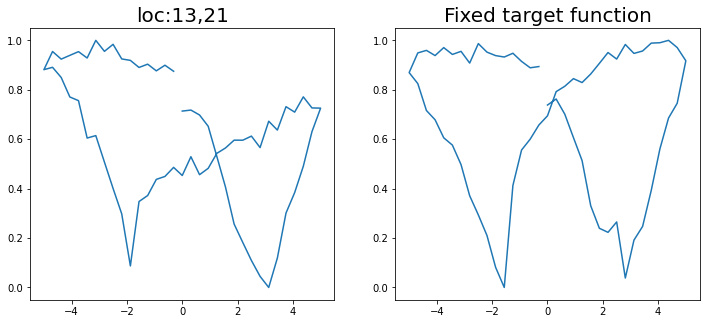

step:  187
Sample #197




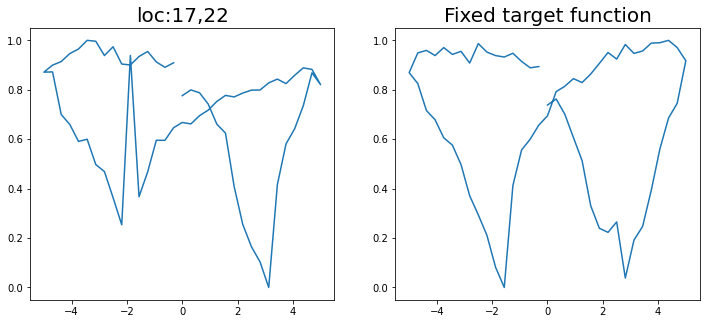

step:  188
Sample #198




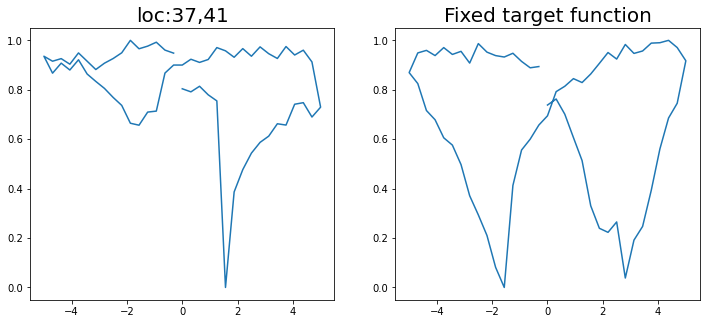

step:  189
Sample #199




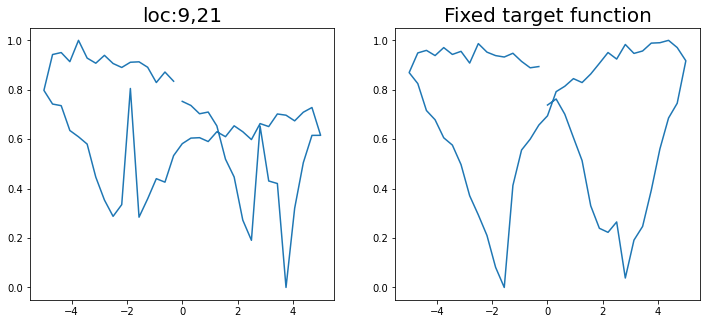

step:  190
Sample #200




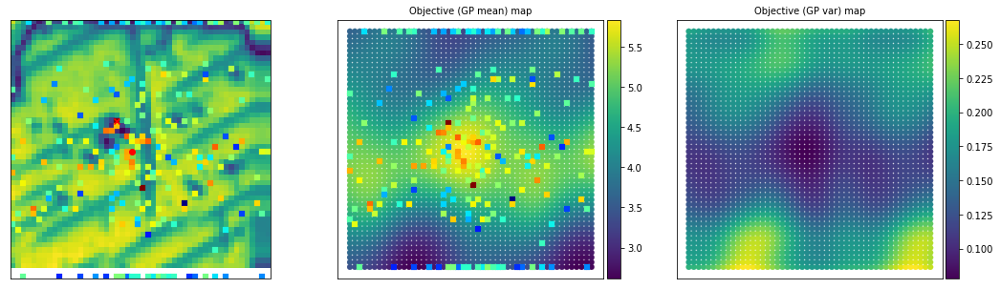

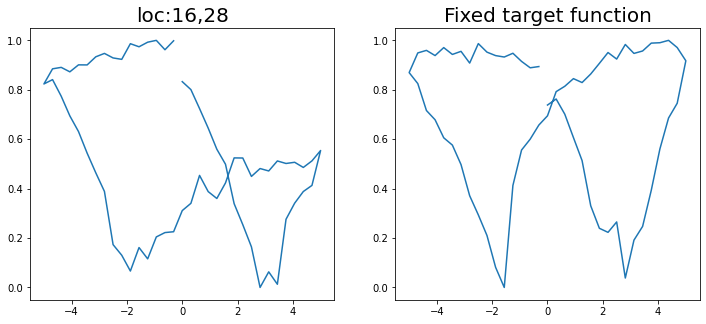

step:  191
Sample #201




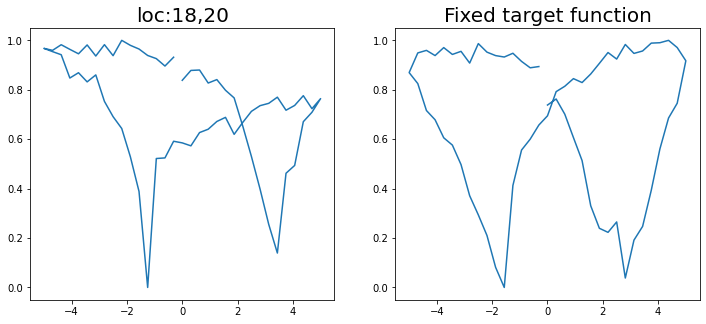

step:  192
Sample #202




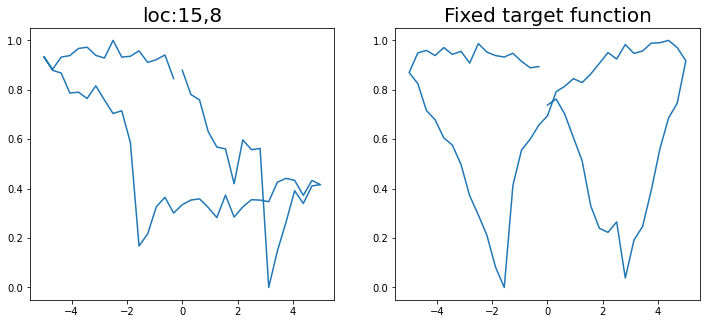

step:  193
Sample #203




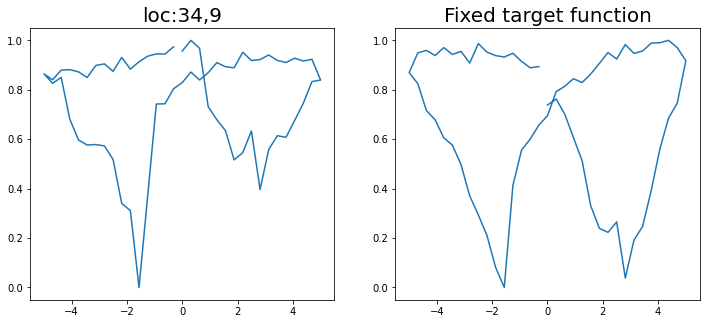

step:  194
Sample #204




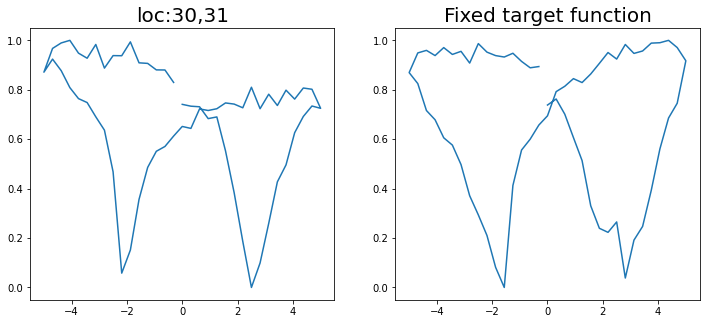

step:  195
Sample #205




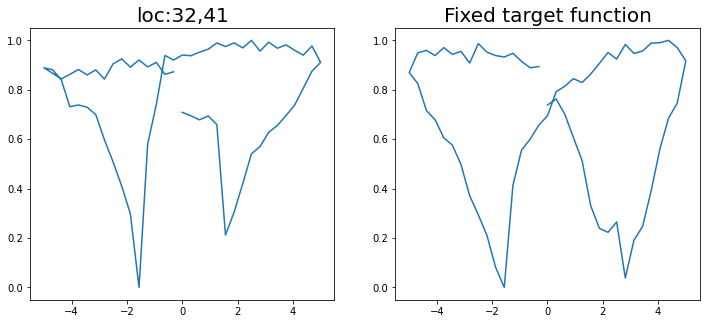

step:  196
Sample #206




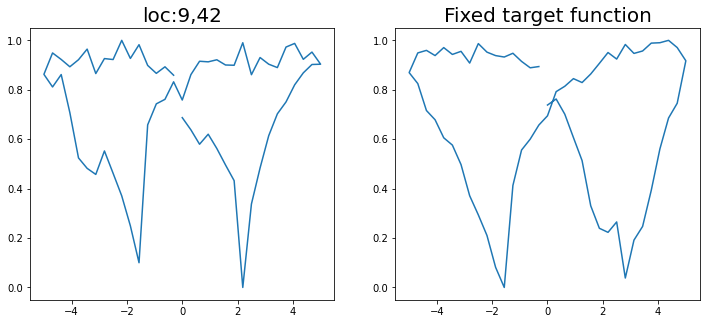

step:  197
Sample #207




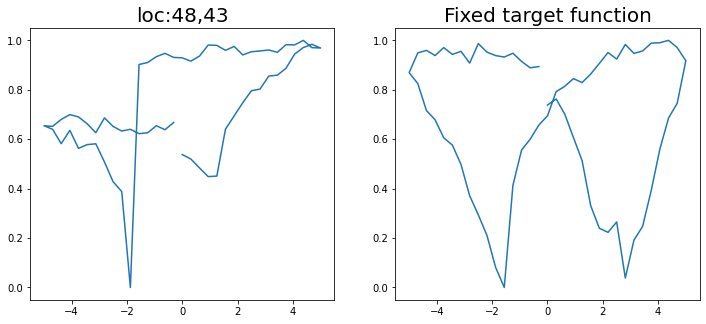

step:  198
Sample #208




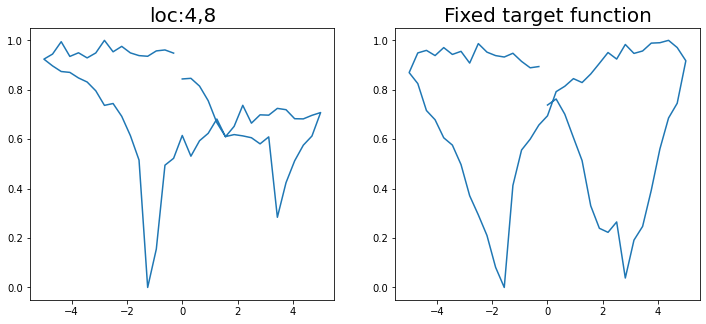

step:  199
Sample #209




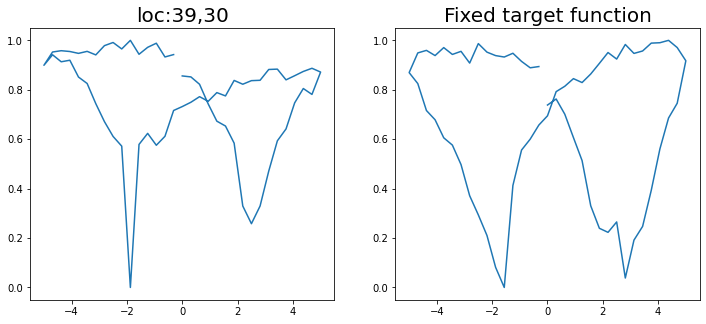

step:  200
Sample #210




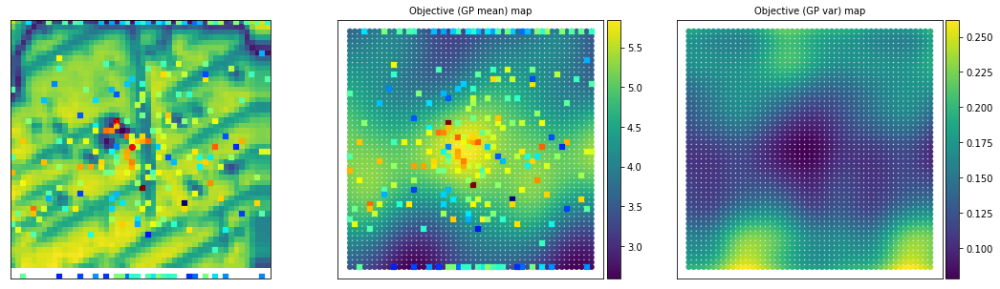

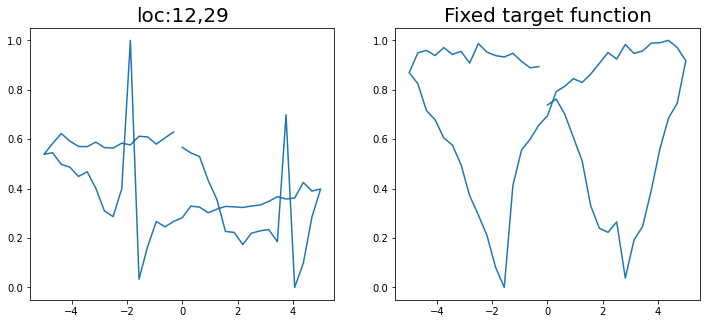



#####----Max. sampling reached, model stopped----#####


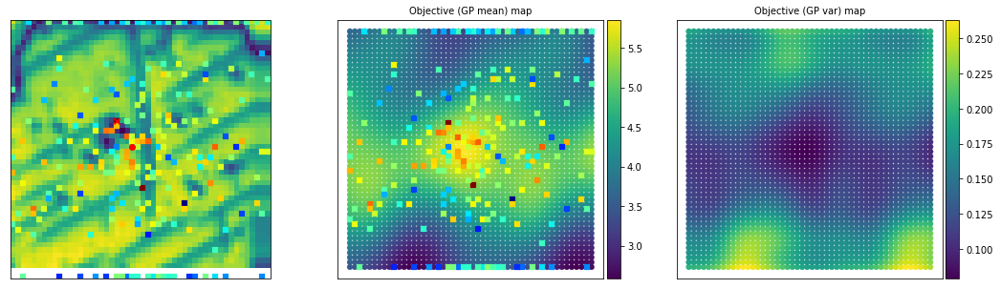

/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  arr = np.asanyarray(arr)
/usr/local/lib/python3.8/dist-packages/numpy/lib/npyio.py:528: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [ ]:
## Gp model fit
# Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
# Input args- Torch arrays of normalized training data, parameter X and objective eval Y
# Output args- Gaussian process model lists
switch_obj_index = 0 # This is the index parameter to switch from 0 to 1 when the user satisfy with updating target
#Set up the surrogat emodel
gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

for i in range(1, N + 1):
    print("step: ", i)
    print("Sample #" + str(m + 1)+ "\n\n")
    # Calculate posterior for analysis for intermidiate iterations
    y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_surro, test_X_norm)
    
    #Plot every tenth iteration after running the evaluation
    if ((i == 1) or ((i % 10) == 0)):
        #This will estimate the surrogate
        X_eval, X_GP = play_varTBO.estimate(train_X, train_Y, test_X, y_pred_means)
        fig = plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)
        #put the savefig within the plot function
        #fig.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    #calculate acquisition function
    acq_cand, acq_val, EI_val = play_varTBO.acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
    val = acq_val
    ind = np.random.choice(acq_cand) # When multiple points have same acq values
    idx = np.hstack((idx, ind))

    ## Find next point which maximizes the learning through exploration-exploitation
    if (i == 1):
        val_ini = val
      # Check for convergence
    if ((val) < 0):  # Stop for negligible expected improvement
        print("Model converged due to sufficient learning over search space ")
        break
    else:
        nextX = torch.empty((1, 2))
        nextX_norm = torch.empty(1, 2)
        nextX[0,:] = test_X[ind, :]
        nextX_norm [0, :] = test_X_norm[ind, :]
        idx_x = int(nextX[0, 0])
        idx_y = int(nextX[0, 1])

        next_loc = np.asarray([idx_x, idx_y])
        new_points_measured = idx
        
        #polarization loop area
        IV, points_measured = return_new_measurement(amp_mat, new_points_measured)

        new_iv = IV[points_measured,:]

        new_spec_x = torch.from_numpy(vdc_vec)
        new_spec_y = torch.from_numpy(new_iv)[-1]

      
        new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
        
        #clear_output(wait=True) Comment out as I need to check the run in colab
        
        eval_spec_y[idx_x, idx_y, :] = new_spec_y
        # Evaluate true function for new data, augment data
        train_X, train_X_norm, train_Y, var_params, switch_obj_index, m =\
        play_varTBO.augment_newdata_KL(nextX, nextX_norm, train_X, train_X_norm, train_Y,
                                        new_spec_x, new_spec_y, eval_spec_y, img, var_params, switch_obj_index, m)


        # Gp model fit
        # Updating GP with augmented training data
        gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

    ## Final posterior prediction after all the sampling done

if (i == N):
    print("\n\n#####----Max. sampling reached, model stopped----#####")

#Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_opt, test_X_norm)
# Plotting functions to check final iteration
X_opt, X_opt_GP = play_varTBO.estimate(train_X, train_Y, test_X, y_pred_means)
plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

explored_data = [train_X, train_Y]
final_GP_estim = [y_pred_means, y_pred_vars]
user_votes = var_params[1]
optim_results = [X_opt, X_opt_GP, user_votes, explored_data, y_pred_means, y_pred_vars]

#Save few data
np.save("optim_resultsd1BO", optim_results)

#Generate spectral (given target) ground truth, computing objective at each location grid points

In [ ]:
spec_ground = torch.zeros((X_feas_norm.shape[0],1))
spec_ground.shape

torch.Size([2500, 1])

In [ ]:
for i in range(0, X_feas_norm.shape[0]):
  idx_x = int(X_feas_norm[i, 0])
  idx_y = int(X_feas_norm[i, 1])
  new_spec_y = torch.from_numpy(amp_mat[i, :])
  new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
  #print(idx_x, idx_y, spec_y)
  spec_ground[i, 0] = play_varTBO.func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func)

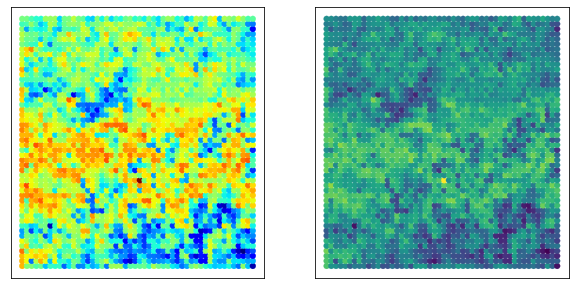

In [ ]:
  fig,ax=plt.subplots(ncols=2,figsize=(10,5))
  a = ax[0].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='jet', linewidth=0.2)
  #cax = divider.append_axes('right', size='5%', pad=0.05)
  #fig.colorbar(a, cax=cax, orientation='vertical')
  #ax[0].set_title('Objective (GP mean) map', fontsize=10)
  ax[0].axes.xaxis.set_visible(False)
  ax[0].axes.yaxis.set_visible(False)

  a = ax[1].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='viridis', linewidth=0.2)
  #cax = divider.append_axes('right', size='5%', pad=0.05)
  #fig.colorbar(a, cax=cax, orientation='vertical')
  #ax[1].set_title('Objective (GP mean) map', fontsize=10)
  ax[1].axes.xaxis.set_visible(False)
  ax[1].axes.yaxis.set_visible(False)

Error map between ground truth and GP prediction of SSIM

tensor(0.1652)


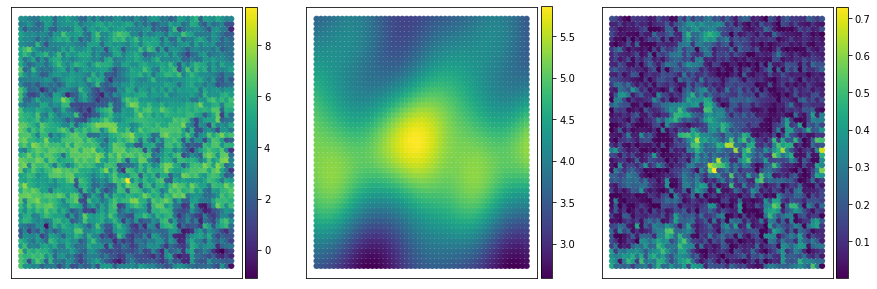

In [ ]:
spec_ground_norm = (spec_ground -torch.min(spec_ground))/(torch.max(spec_ground)-torch.min(spec_ground))
y_pred_means_norm = (y_pred_means-torch.min(y_pred_means))/(torch.max(y_pred_means)-torch.min(y_pred_means))
error = torch.absolute(spec_ground_norm-y_pred_means_norm)
mae = torch.mean(error)
print(mae)
fig,ax=plt.subplots(ncols=3,figsize=(15,5))
a = ax[0].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[0].set_title('Objective (GP mean) map', fontsize=10)
ax[0].axes.xaxis.set_visible(False)
ax[0].axes.yaxis.set_visible(False)

a = ax[1].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=y_pred_means, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[1].axes.xaxis.set_visible(False)
ax[1].axes.yaxis.set_visible(False)

a = ax[2].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=error, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[2].axes.xaxis.set_visible(False)
ax[2].axes.yaxis.set_visible(False)

tensor(0.0434)


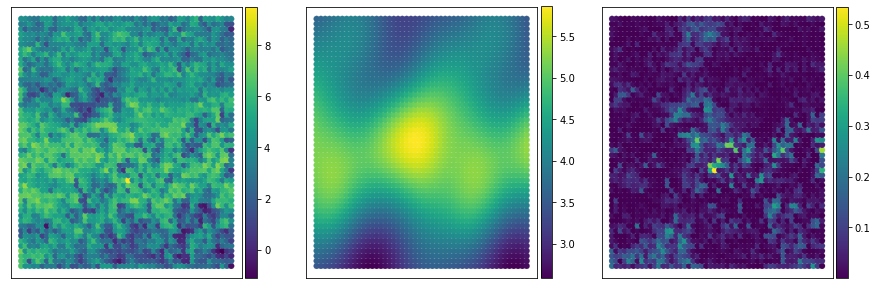

In [ ]:
spec_ground_norm = (spec_ground -torch.min(spec_ground))/(torch.max(spec_ground)-torch.min(spec_ground))
y_pred_means_norm = (y_pred_means-torch.min(y_pred_means))/(torch.max(y_pred_means)-torch.min(y_pred_means))
error = (spec_ground_norm-y_pred_means_norm)**2
mse = torch.mean(error)
print(mse)
fig,ax=plt.subplots(ncols=3,figsize=(15,5))
a = ax[0].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[0].set_title('Objective (GP mean) map', fontsize=10)
ax[0].axes.xaxis.set_visible(False)
ax[0].axes.yaxis.set_visible(False)

a = ax[1].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=y_pred_means, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[1].axes.xaxis.set_visible(False)
ax[1].axes.yaxis.set_visible(False)

a = ax[2].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=error, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[2].axes.xaxis.set_visible(False)
ax[2].axes.yaxis.set_visible(False)

#Next Data

In [ ]:
!gdown https://drive.google.com/uc?id=1pl7tJwDH0xsx21TwrN_i8KM7yEFHT4Xw
pickle_file_loc = r'beps_ground_truth_d2.p'
original_data = pickle.load(open(pickle_file_loc, "rb"))
beps_all = original_data['results_beps']

Downloading...
From: https://drive.google.com/uc?id=1pl7tJwDH0xsx21TwrN_i8KM7yEFHT4Xw
To: /content/beps_ground_truth_d2.p
100% 758M/758M [00:02<00:00, 257MB/s]


In [ ]:
!gdown https://drive.google.com/uc?id=1djbYo-Gjgu6oVGaZlnp3idkUDDOru991
results = np.load("iterative_results_d2.npy", allow_pickle=True)

Downloading...
From: https://drive.google.com/uc?id=1djbYo-Gjgu6oVGaZlnp3idkUDDOru991
To: /content/iterative_results_d2.npy
100% 112M/112M [00:00<00:00, 184MB/s] 


In [ ]:
img_big = results[0][-2]

In [ ]:
dim = 50
img = resize(img_big, (50, 50),
                       anti_aliasing=True)

# Ground truth image

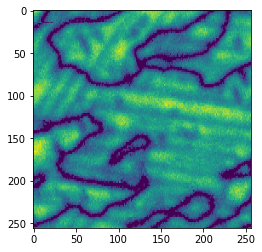

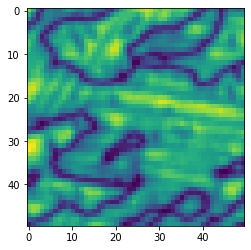

In [ ]:
plt.imshow(img_big)
plt.show()
plt.imshow(img)
plt.show()

In [ ]:
num_start = int(10)
N = int(200)
m = 0
spec_length = 64  #spectral data length

amp_slices = []
for ind in range(len(beps_all)):
    amp_slices.append(beps_all[ind][1][2])
amp_slices = np.array(amp_slices)
#img = amp_slices[:,16].reshape(50,50)

vdc_full = np.array(beps_all[0][1][0])
vdc_vec = vdc_full[-64:]

amp_mat = amp_slices[:,128:][:,1::2]
amp_masked = np.zeros_like(amp_mat)

rand_points = np.random.choice(np.arange(50*50), size = num_start, replace = False)
for ind in range(num_start):
    amp_masked[int(rand_points[ind]),:] = amp_mat[int(rand_points[ind]),:]

spec_length = amp_mat.shape[-1]  #spectral data length

coordinates = utils.get_coord_grid(img, 1)
X_feas = torch.from_numpy(coordinates[0][:,:2])

X_feas_norm = torch.empty((X_feas.shape[0], X_feas.shape[1]))

# Normalize X
for i in range(0, X_feas.shape[1]):
    X_feas_norm[:, i] = (X_feas[:, i] - 
                       torch.min(X_feas[:, i])) / (torch.max(X_feas[:, i]) - 
                                                                  torch.min(X_feas[:, i]))

# Initial evaluation

i is 0, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #1


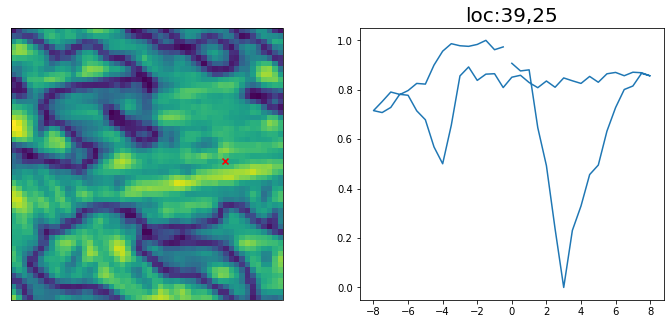

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 1, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #2


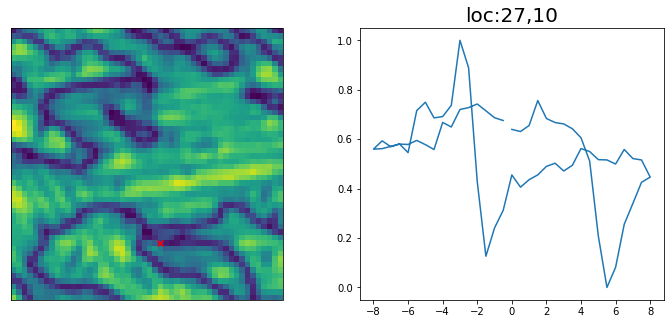

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 2, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #3


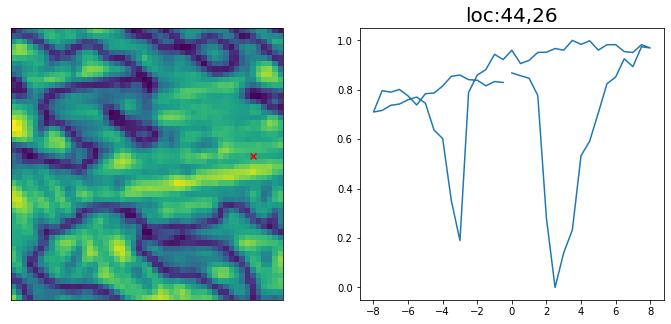

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
i is 3, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #4


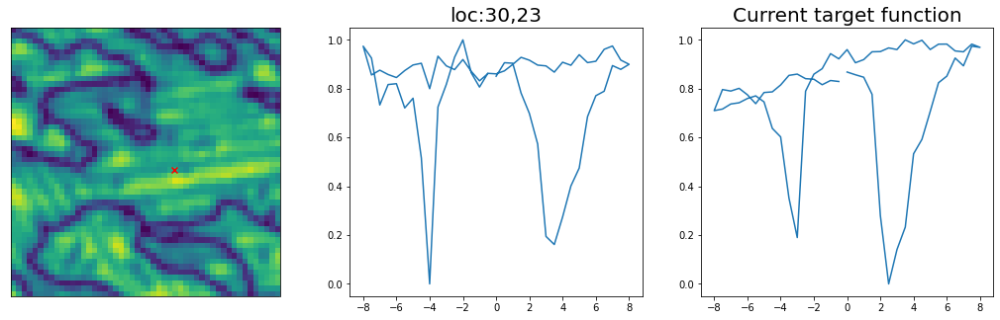

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 4, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #5


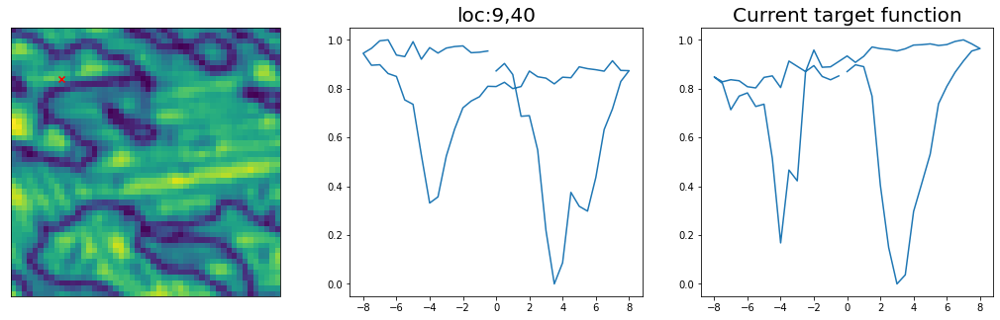

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: y
Provide weights between 0 and 10: 
10 being all the weights to new spectral as new target.
enter weightage: 8
0.8
i is 5, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #6


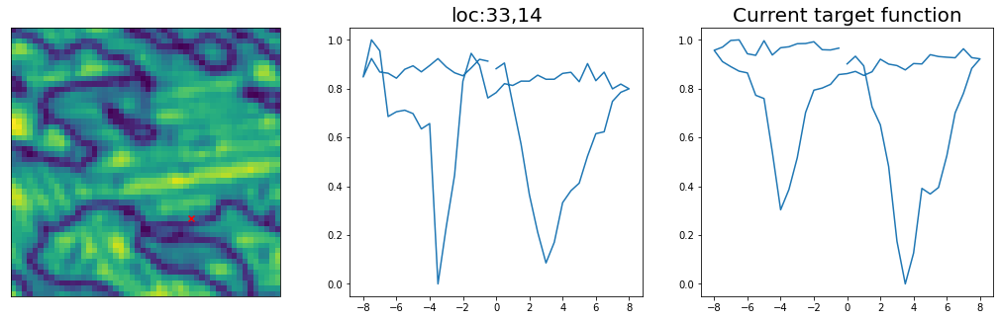

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 6, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #7


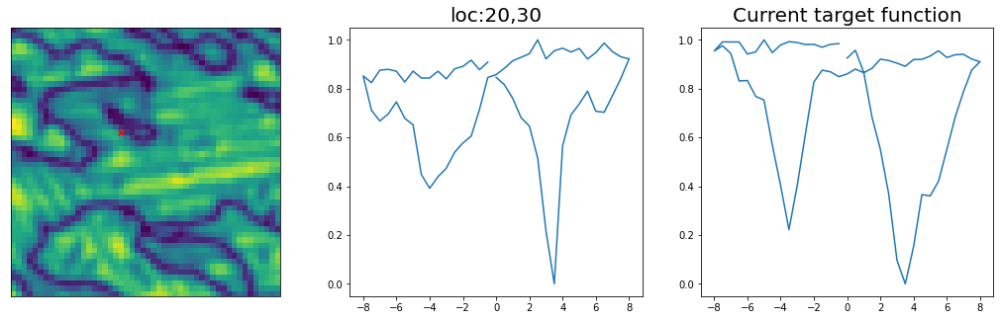

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 7, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #8


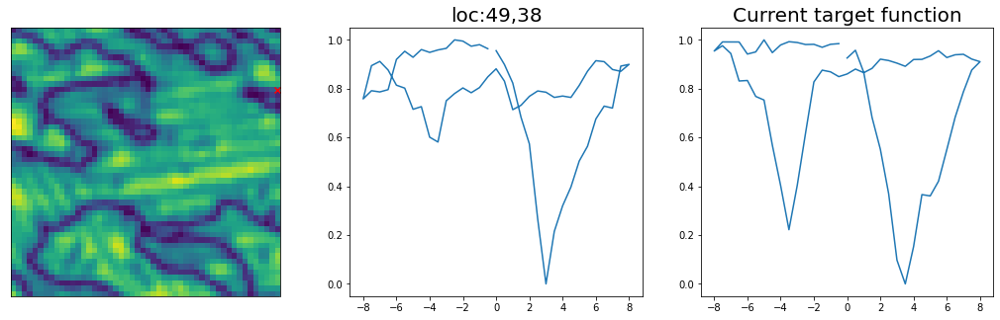

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
0
i is 8, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #9


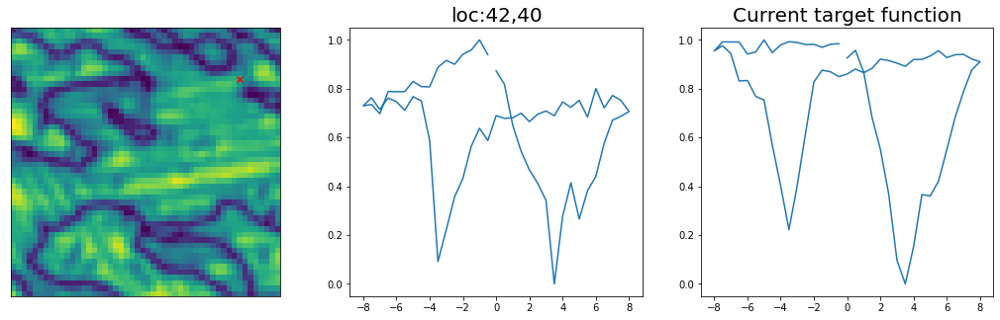

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
2.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 9, measurement done
points measured [ 874  219  567 2442 1838 1079 1122  829  731 1175]
new_points_measured []


Sample #10


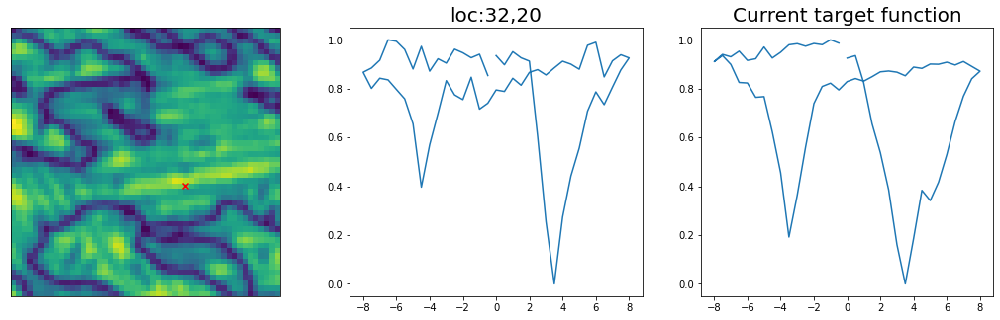

Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
1.0
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 


In [ ]:
def return_new_measurement(full_dataset, points_measured):
    ampdat_masked = np.zeros_like(full_dataset)
    ampdat_masked[points_measured,:] = full_dataset[points_measured,:]
    return ampdat_masked, points_measured

# set parameters
IV = np.copy(amp_masked)
points_measured = np.array(rand_points)
last_points_measured = np.array(points_measured)
vdc = vdc_vec

# initial train location
np.random.seed(10)
idx = np.random.randint(0, len(X_feas), num_start)
train_X = X_feas[idx]
train_X_norm = X_feas_norm[idx]

train_Y = torch.empty((num_start, 1))
pref = torch.empty((num_start, 1))
init_spec = torch.empty((num_start, spec_length))
# Define a sparse grid to store evaluated spectral locations
eval_spec_y = torch.zeros(img.shape[0],img.shape[0],spec_length)
#Evaluate initial training data
x = torch.empty((1,2))

# First generate target loop, based on initial training data
wcount_good= 0
target_func = torch.zeros(spec_length)

mask = np.isin(points_measured, last_points_measured, invert = True)
new_points_measured = points_measured[mask]
last_points_measured = np.append(last_points_measured, new_points_measured)

for i in range(0, num_start):
    
    ##******************experiment start*******************##
    time.sleep(0.1)

    idx_x = int(train_X[i, 0])
    idx_y = int(train_X[i, 1])

    next_loc = np.asarray([idx_x, idx_y])

    print("i is {}, measurement done".format(i))
    
    mask = np.isin(points_measured, last_points_measured, invert = True)
    new_points_measured = points_measured[mask]
    last_points_measured = np.append(last_points_measured, new_points_measured)
    print('points measured {}'.format(points_measured))
    print('new_points_measured {}'.format(new_points_measured))

    new_iv = IV[last_points_measured,:]

    new_spec_x = torch.from_numpy(vdc_vec)
    new_spec_y = torch.from_numpy(new_iv)[i,:]

    new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())

    init_spec[i,] = new_spec_y
    eval_spec_y[idx_x, idx_y, :] = new_spec_y
    print("\n\nSample #" + str(m + 1))
    pref[i, 0], wcount_good, target_func = play_varTBO.generate_targetobj(idx_x, idx_y, new_spec_x,new_spec_y, 
                                                              img, wcount_good, target_func)
    m = m + 1


# Once target loop is defined (unless are loops are selected bad by user), we compute the obj
for i in range(0, num_start):
  idx_x = int(train_X[i, 0])
  idx_y = int(train_X[i, 1])
  spec_y = eval_spec_y[idx_x, idx_y, :]
  #print(idx_x, idx_y)
  train_Y[i, 0] = play_varTBO.func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func, pref[i, 0])

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
= X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m


# Start BO

In [ ]:
## Gp model fit
# Calling function to fit and optimizize Hyperparameter of Gaussian Process (using Adam optimizer)
# Input args- Torch arrays of normalized training data, parameter X and objective eval Y
# Output args- Gaussian process model lists
switch_obj_index = 0 # This is the index parameter to switch from 0 to 1 when the user satisfy with updating target
#Set up the surrogat emodel
gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

for i in range(1, N + 1):
    print("step: ", i)
    print("Sample #" + str(m + 1)+ "\n\n")
    # Calculate posterior for analysis for intermidiate iterations
    y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_surro, test_X_norm)
    
    #Plot every tenth iteration after running the evaluation
    if ((i == 1) or ((i % 10) == 0)):
        #This will estimate the surrogate
        X_eval, X_GP = play_varTBO.estimate(train_X, train_Y, test_X, y_pred_means)
        fig = plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)
        #put the savefig within the plot function
        #fig.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    #calculate acquisition function
    acq_cand, acq_val, EI_val = play_varTBO.acqmanEI(y_pred_means, y_pred_vars, train_Y, idx)
    val = acq_val
    ind = np.random.choice(acq_cand) # When multiple points have same acq values
    idx = np.hstack((idx, ind))

    ## Find next point which maximizes the learning through exploration-exploitation
    if (i == 1):
        val_ini = val
      # Check for convergence
    if ((val) < 0):  # Stop for negligible expected improvement
        print("Model converged due to sufficient learning over search space ")
        break
    else:
        nextX = torch.empty((1, 2))
        nextX_norm = torch.empty(1, 2)
        nextX[0,:] = test_X[ind, :]
        nextX_norm [0, :] = test_X_norm[ind, :]
        idx_x = int(nextX[0, 0])
        idx_y = int(nextX[0, 1])

        next_loc = np.asarray([idx_x, idx_y])
        new_points_measured = idx
        
        #polarization loop area
        IV, points_measured = return_new_measurement(amp_mat, new_points_measured)

        new_iv = IV[points_measured,:]

        new_spec_x = torch.from_numpy(vdc_vec)
        new_spec_y = torch.from_numpy(new_iv)[-1]

      
        new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
        
        #clear_output(wait=True) Comment out as I need to check the run in colab
        
        eval_spec_y[idx_x, idx_y, :] = new_spec_y
        # Evaluate true function for new data, augment data
        train_X, train_X_norm, train_Y, var_params, switch_obj_index, m =\
        play_varTBO.augment_newdata_KL(nextX, nextX_norm, train_X, train_X_norm, train_Y,
                                        new_spec_x, new_spec_y, eval_spec_y, img, var_params, switch_obj_index, m)


        # Gp model fit
        # Updating GP with augmented training data
        gp_surro = play_varTBO.optimize_hyperparam_trainGP(train_X_norm, train_Y)

    ## Final posterior prediction after all the sampling done

if (i == N):
    print("\n\n#####----Max. sampling reached, model stopped----#####")

#Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
y_pred_means, y_pred_vars = play_varTBO.cal_posterior(gp_opt, test_X_norm)
# Plotting functions to check final iteration
X_opt, X_opt_GP = play_varTBO.estimate(train_X, train_Y, test_X, y_pred_means)
plot_results(train_X, train_Y, test_X, y_pred_means, y_pred_vars, X_eval, X_GP, img, i)

explored_data = [train_X, train_Y]
final_GP_estim = [y_pred_means, y_pred_vars]
user_votes = var_params[1]
optim_results = [X_opt, X_opt_GP, user_votes, explored_data, y_pred_means, y_pred_vars]

#Save few data
np.save("optim_resultsd2_BO", optim_results)

#Generate spectral (given target) ground truth, computing objective at each location grid points

In [ ]:
spec_ground = torch.zeros((X_feas_norm.shape[0],1))
spec_ground.shape

torch.Size([2500, 1])

In [ ]:
for i in range(0, X_feas_norm.shape[0]):
  idx_x = int(X_feas_norm[i, 0])
  idx_y = int(X_feas_norm[i, 1])
  new_spec_y = torch.from_numpy(amp_mat[i, :])
  new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
  #print(idx_x, idx_y, spec_y)
  spec_ground[i, 0] = play_varTBO.func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func)

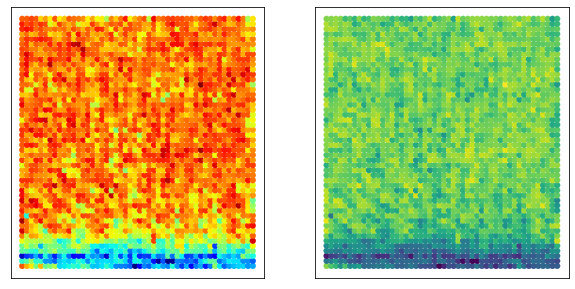

In [ ]:
  fig,ax=plt.subplots(ncols=2,figsize=(10,5))
  a = ax[0].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='jet', linewidth=0.2)
  #cax = divider.append_axes('right', size='5%', pad=0.05)
  #fig.colorbar(a, cax=cax, orientation='vertical')
  #ax[0].set_title('Objective (GP mean) map', fontsize=10)
  ax[0].axes.xaxis.set_visible(False)
  ax[0].axes.yaxis.set_visible(False)

  a = ax[1].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='viridis', linewidth=0.2)
  #cax = divider.append_axes('right', size='5%', pad=0.05)
  #fig.colorbar(a, cax=cax, orientation='vertical')
  #ax[1].set_title('Objective (GP mean) map', fontsize=10)
  ax[1].axes.xaxis.set_visible(False)
  ax[1].axes.yaxis.set_visible(False)

Error map between ground truth and GP prediction of SSIM

tensor(0.1726)


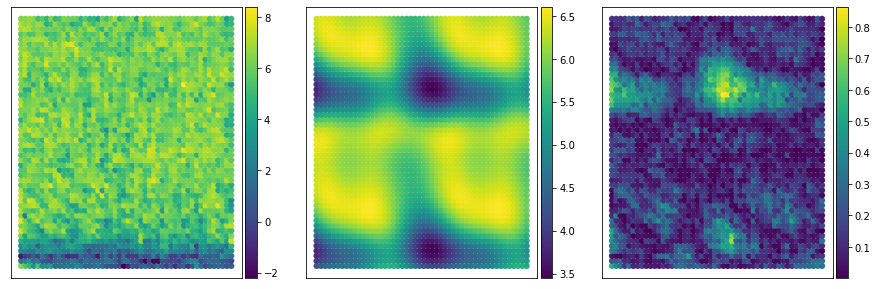

In [ ]:
spec_ground_norm = (spec_ground -torch.min(spec_ground))/(torch.max(spec_ground)-torch.min(spec_ground))
y_pred_means_norm = (y_pred_means-torch.min(y_pred_means))/(torch.max(y_pred_means)-torch.min(y_pred_means))
error = torch.absolute(spec_ground_norm-y_pred_means_norm)
mae = torch.mean(error)
print(mae)
fig,ax=plt.subplots(ncols=3,figsize=(15,5))
a = ax[0].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[0].set_title('Objective (GP mean) map', fontsize=10)
ax[0].axes.xaxis.set_visible(False)
ax[0].axes.yaxis.set_visible(False)

a = ax[1].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=y_pred_means, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[1].axes.xaxis.set_visible(False)
ax[1].axes.yaxis.set_visible(False)

a = ax[2].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=error, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[2].axes.xaxis.set_visible(False)
ax[2].axes.yaxis.set_visible(False)

tensor(0.0501)


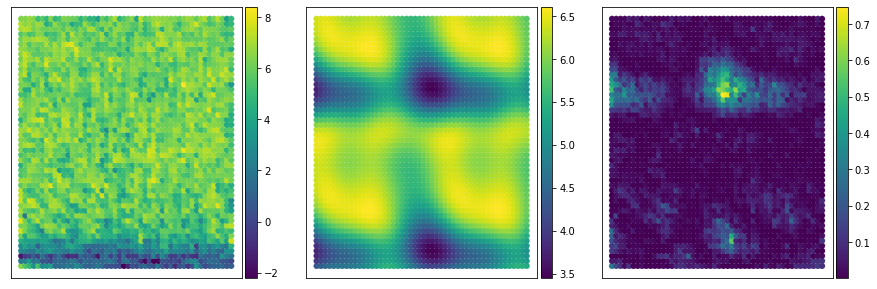

In [ ]:
spec_ground_norm = (spec_ground -torch.min(spec_ground))/(torch.max(spec_ground)-torch.min(spec_ground))
y_pred_means_norm = (y_pred_means-torch.min(y_pred_means))/(torch.max(y_pred_means)-torch.min(y_pred_means))
error = (spec_ground_norm-y_pred_means_norm)**2
mse = torch.mean(error)
print(mse)
fig,ax=plt.subplots(ncols=3,figsize=(15,5))
a = ax[0].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=spec_ground, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[0].set_title('Objective (GP mean) map', fontsize=10)
ax[0].axes.xaxis.set_visible(False)
ax[0].axes.yaxis.set_visible(False)

a = ax[1].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=y_pred_means, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[1].axes.xaxis.set_visible(False)
ax[1].axes.yaxis.set_visible(False)

a = ax[2].scatter(X_feas_norm[:,1], X_feas_norm[:,0], c=error, cmap='viridis', linewidth=0.2)
divider = make_axes_locatable(ax[2])
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(a, cax=cax, orientation='vertical')
#ax[1].set_title('Objective (GP mean) map', fontsize=10)
ax[2].axes.xaxis.set_visible(False)
ax[2].axes.yaxis.set_visible(False)